# Sign to Speech: an investigation in sign Language Processing
### Kora S. Hughes
> an extension of my Fall 2022 Machine Learning final project

In [1]:
# General Imports
from matplotlib import pyplot as plt
import os
import numpy as np
import pandas as pd
from sklearn import preprocessing
from sklearn.model_selection import train_test_split 

In [2]:
# MediaPipe SetUp --> https://google.github.io/mediapipe/getting_started/python.html
"""
python3 -m venv mp_env && source mp_env/bin/activate
pip install mediapipe
python3
"""
import mediapipe as mp
mp_face_mesh = mp.solutions.face_mesh

conf_level = 0.25  # default 0.5
print("Confidence level of hand recognition to run point extrapolation algorithm:\n", conf_level)

Confidence level of hand recognition to run point extrapolation algorithm:
 0.25


In [3]:
# MediaPipe Implementation --> https://google.github.io/mediapipe/solutions/hands
import cv2
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_hands = mp.solutions.hands

# mediapipe for static images:
def run_mediapipe(IMAGE_FILES, show_image=False, print_landmarks=False, max_hands=1, conf=conf_level):
    with mp_hands.Hands(static_image_mode=True, max_num_hands=max_hands, min_detection_confidence=conf) as hands:
        all_results = []
        for idx, file in enumerate(IMAGE_FILES):
            # Read an image, flip it around y-axis for correct handedness output (see above).
            image = cv2.imread(file)  # cv2.flip(cv2.imread(file), 1) not needed since it is already flipped when taken by my method
            # Convert the BGR image to RGB before processing.
            results = hands.process(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

            # Draw hand world landmarks.
            if show_image:
                if not results.multi_hand_world_landmarks:
                    continue
                for hand_world_landmarks in results.multi_hand_world_landmarks:
                    mp_drawing.plot_landmarks(hand_world_landmarks, mp_hands.HAND_CONNECTIONS, azimuth=5)
            
            # Print handedness and draw hand landmarks on the image.
#             print('Handedness:', results.multi_handedness)
            if not results.multi_hand_landmarks:
                continue

            # print landmarks
            image_height, image_width, _ = image.shape
            annotated_image = image.copy()
            if print_landmarks:
                for hand_landmarks in results.multi_hand_landmarks:  # normalized
                    print('hand_landmarks:', hand_landmarks)
                    print(f'Index finger tip coordinates: (',
                      f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * image_width}, '
                      f'{hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * image_height})')
                    mp_drawing.draw_landmarks(annotated_image, hand_landmarks, mp_hands.HAND_CONNECTIONS,
                                              mp_drawing_styles.get_default_hand_landmarks_style(),
                                              mp_drawing_styles.get_default_hand_connections_style())
#             cv2.imwrite('/tmp/annotated_image' + str(idx) + '.png', cv2.flip(annotated_image, 1))
            # save results
            all_results.append(results)
        return all_results

In [4]:
# structure functions
old_classes = {"A":0, "B":1, "K":2, "H":3, "Y":4, "W":5}

# refrence to Kaggle Paper: https://arxiv.org/pdf/2203.03859.pdf
letters = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'a', 'b', 'c', 'd', 'e', 'bye', 'good',
'good morning', 'hello', 'little bit', 'no', 'pardon', 'please', 'project', 'whats up', 'yes', 'NULL']
classes = dict([[letters[i], i] for i in range(len(letters))])

total_options = len(classes)
print("Options:", total_options, "=>", classes)

# generating list of attributes for data processing
landmark_list = [] # list of attributes in MULTI_HAND_WORLD_LANDMARKS, multi_hand_world_landmarks
# print("\nAll Attributes (+xyz):\n", list(mp_hands.HandLandmark))
for landmark in mp_hands.HandLandmark:
    for comp in ['.x', '.y', '.z']:
        landmark_list.append(str(landmark)[13:]+comp)  # Note: first 13 characters are always 'HandLandmark.'
landmark_list = np.array(landmark_list).reshape(1,-1)
# temp_target = np.array(list(classes.keys())[1:]).reshape(1,-1)  # formatted list of which letters we are looking at
# Note: we dont take the first index because every encoded number being 0 implies the first attribute

temp_target = [["index", "target"]]  # 'target': label encoding with 'target', 'index': refrence to image
attribute_decoder = np.hstack( (temp_target, landmark_list) )
print("\nAttribute Encoding:\n", attribute_decoder)
num_features = attribute_decoder.shape[1] - 2  # (21 landmarks) * (3 xyz_coords/landmark) - (image ref + target)
print("\nTotal Features:", num_features)

Options: 27 => {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'bye': 15, 'good': 16, 'good morning': 17, 'hello': 18, 'little bit': 19, 'no': 20, 'pardon': 21, 'please': 22, 'project': 23, 'whats up': 24, 'yes': 25, 'NULL': 26}

Attribute Encoding:
 [['index' 'target' 'WRIST.x' 'WRIST.y' 'WRIST.z' 'THUMB_CMC.x'
  'THUMB_CMC.y' 'THUMB_CMC.z' 'THUMB_MCP.x' 'THUMB_MCP.y' 'THUMB_MCP.z'
  'THUMB_IP.x' 'THUMB_IP.y' 'THUMB_IP.z' 'THUMB_TIP.x' 'THUMB_TIP.y'
  'THUMB_TIP.z' 'INDEX_FINGER_MCP.x' 'INDEX_FINGER_MCP.y'
  'INDEX_FINGER_MCP.z' 'INDEX_FINGER_PIP.x' 'INDEX_FINGER_PIP.y'
  'INDEX_FINGER_PIP.z' 'INDEX_FINGER_DIP.x' 'INDEX_FINGER_DIP.y'
  'INDEX_FINGER_DIP.z' 'INDEX_FINGER_TIP.x' 'INDEX_FINGER_TIP.y'
  'INDEX_FINGER_TIP.z' 'MIDDLE_FINGER_MCP.x' 'MIDDLE_FINGER_MCP.y'
  'MIDDLE_FINGER_MCP.z' 'MIDDLE_FINGER_PIP.x' 'MIDDLE_FINGER_PIP.y'
  'MIDDLE_FINGER_PIP.z' 'MIDDLE_FINGER_DIP.x' 'MIDDLE_FINGER_DIP.y'
  'MIDDLE_F

In [5]:
# one-hot encoding refrence
one_hot_target = [letters[:-1]]  # we ditch the last elem (NULL) since all values 0 => NULL
print("One Hot Encoded Target:", one_hot_target)
def hot_encode_y(y):
    temp_target = [0]*(total_options-1)
    if y != (total_options-1):  # NULL case
        temp_target[y] = 1
    return [temp_target]

One Hot Encoded Target: [['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'a', 'b', 'c', 'd', 'e', 'bye', 'good', 'good morning', 'hello', 'little bit', 'no', 'pardon', 'please', 'project', 'whats up', 'yes']]


## Image Processing & Feature Extraction:
### Starting with Homebrew Testing Images
(derived from videos in the data_gatherer file)

In [62]:
# image directories
cwd = os.getcwd()  # current dir
save_test_results = cwd + "/results/processed_testing_data"
save_test_image_key = cwd + "/results/processed_testing_data_to_image"

save_train = cwd + "/results/processed_train_data/"
save_train_results = save_train + "processed_train_data"
save_train_image_key = save_train + "processed_train_data_to_image"
final_results = cwd + "/results/predicted_data"

# Accessing Image Data (TESTING)
test_image_dir = "/testing/images/"
train_image_dir = "/training/images/"

# variables to keep track of distribution of chunks
# all_read_types = {}
# all_notread_types = {}

def get_target(name):  # filename => target
    # image formatting "[dir]/[target_y]-video[video#]image[image#].png"
    return str(name[name.rfind('/')+1:name.find('-')]).lower()

# list of images via dir string
print("Finding Files...\n")
# Note: we filter for the letters we want here
test_images = [cwd+test_image_dir+file for file in os.listdir(cwd+test_image_dir) if get_target(file) in letters and ".png" in file]
assert len(test_images) >= 1
print("Found", len(test_images), "files...")

Finding Files...

Found 1271 files...


Calculating Landmarks For Testing Images...

Image(1/1271) from b-video8image44.png is category b => [[1, 'b']]


INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/google/protobuf/symbol_database.py:78: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '




Image(2/1271) from a-video12image47.png is category a => [[2, 'a']]


Image(3/1271) from 3-video42image6.png is category 3 => [[3, '3']]


Image(4/1271) from a-video12image53.png is category a => [[4, 'a']]


Image(5/1271) from b-video8image50.png is category b => [[5, 'b']]


Image(6/1271) from 6-video1image35.png is category 6 => [[6, '6']]


Image(7/1271) from e-video27image49.png is category e => [[7, 'e']]


Image(8/1271) from 6-video1image21.png is category 6 => [[8, '6']]


Image(9/1271) from e-video27image61.png is category e => [[9, 'e']]


Image(10/1271) from a-video16image12.png is category a => [[10, 'a']]


Image(11/1271) from 3-video42image21.png is category 3 => [[11, '3']]


Image(12/1271) from 8-video40image19.png is category 8 => [[12, '8']]


Image(13/1271) from 3-video42image35.png is category 3 => [[13, '3']]


Image(14/1271) from 7-video14image1.png is category 7 => [[14, '7']]


Image(15/1271) from 8-video40image25.png is category 8 => [[15, '8']]


Image(16/12

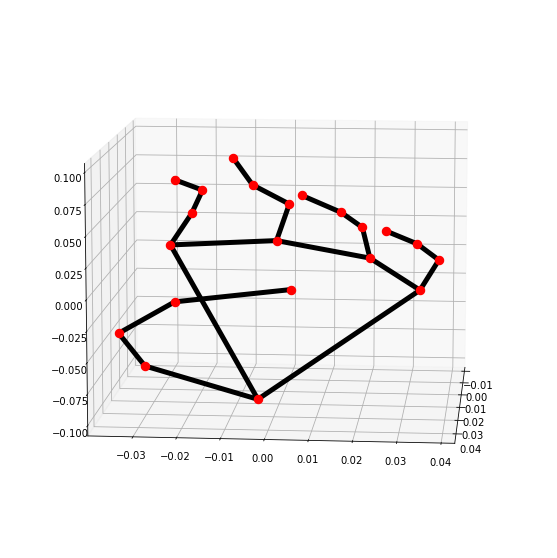

KeyboardInterrupt: 

In [7]:
# calculate landmarks and develop feature matrix from images
print("Calculating Landmarks For Testing Images...\n")
testing_image_refrence = {}  # save a refrence to which data goes to what image
results = np.ones((1, num_features+2))
counter = 0
image_counter = 0  # reduces number of images shown in log to save space for github
not_read = dict([[temp_target, 0] for temp_target in letters]) # record of what kind of images we couldn't read

for img in test_images:
    image_name = str(img[img.rfind('/')+1:])  # name of the image file
    letter = image_name[:image_name.find('-')]  # our target variable
    counter += 1
    add_y = [[counter, letter]]  # index, target
    print("Image(" +str(counter)+"/"+str(len(test_images))+") from", image_name, "is category", letter, "=>", add_y)
    
    show_im = (counter%20 == 0)  # reduces number of images shown in log to save space for github
    temp_ret = run_mediapipe([img], show_im, False, 1)
    if len(temp_ret) == 0:
        print("**MEDIAPIPE DID NOT READ IMAGE**")
        not_read[letter] += 1
    else:
        if show_im:
            plt.imshow(cv2.imread(img))  # show actual image on import
            plt.show()
        
        ret = temp_ret[0].multi_hand_landmarks[0]  # get hand skeleton data

        # translate landmark values to feature matrix format
        assert len(ret.landmark)*3 == num_features   # just checking my analysis of features is correct so we dont miss any data
    #         print("Landmark:\n", ret.landmark)
        add_row = np.ones((1, num_features))
        for j in range(0, num_features):
            if j%3 == 0:
                add_row[0, j] = ret.landmark[j//3].x
            elif j%3 == 1:
                add_row[0, j] = ret.landmark[j//3].y
            else:
                add_row[0, j] = ret.landmark[j//3].z
        add_row = np.hstack((add_y, add_row))  # concat target with features
#         print("Example Landmark Extraction:\n", add_row[0])
        results = np.vstack((results, add_row))  # append results

        # (key) index counter --> (value) image name/data
        testing_image_refrence[counter] = test_image_dir + image_name # [image_name, cv2.imread(img)]
        print('\n')
counter_after_test_processing = counter

# clean results
testing_dataset = np.delete(results, (0), axis=0)  # delete the initial row of ones

In [8]:
def get_dist(data, target_ind=0, ordered=True):
    """ helper to see distribution of a given target variable in data """
    y_dist = dict([[let, 0] for let in letters])
    for entry in data:
        y_dist[entry[target_ind]] += 1
    if ordered:
        y_dist = dict(sorted(y_dist.items(), key=lambda item: -item[1]))  # pseudo-sorting for presentation
    return y_dist

In [12]:
print("Total # Images Added to Testing Set =", testing_dataset.shape, "out of", len(test_images))
metadata_dir = cwd+"/results/hand_metadata/confidence-" + str(conf_level)

not_read = dict(sorted(not_read.items(), key=lambda item: -item[1]))  # sort for convenience
print("\nDistribution of Images Not Read:", not_read)
print("Distribution of Images that Were Read:", get_dist(testing_dataset, 1))
print()

# save data on what images were recongized vs not
np.save(metadata_dir+"-testing-notread", not_read)
print("**saved distribution of read vs. not read images by medipipe to ", metadata_dir)

Total # Images Added to Testing Set = (1269, 65) out of 1271

Distribution of Images Not Read: {'a': 2, '0': 0, '1': 0, '2': 0, '3': 0, '4': 0, '5': 0, '6': 0, '7': 0, '8': 0, '9': 0, 'b': 0, 'c': 0, 'd': 0, 'e': 0, 'bye': 0, 'good': 0, 'good morning': 0, 'hello': 0, 'little bit': 0, 'no': 0, 'pardon': 0, 'please': 0, 'project': 0, 'whats up': 0, 'yes': 0, 'NULL': 0}
Distribution of Images that Were Read: {'b': 187, 'a': 182, '4': 86, '3': 76, 'c': 75, '8': 72, '9': 72, '2': 69, '5': 69, '7': 67, 'e': 67, '0': 66, '6': 64, '1': 60, 'd': 57, 'bye': 0, 'good': 0, 'good morning': 0, 'hello': 0, 'little bit': 0, 'no': 0, 'pardon': 0, 'please': 0, 'project': 0, 'whats up': 0, 'yes': 0, 'NULL': 0}

**saved distribution of read vs. not read images by medipipe to  /Users/korahughes/Documents/GitHub/SignToSpeech/results/hand_metadata/confidence-0.25


In [13]:
# save results to avoid processing repeats
np.save(save_test_results, testing_dataset)
print("**saved processed testing data to", save_test_results)
np.save(save_test_image_key, testing_image_refrence)
print("**saved testing data image refrence to", save_test_image_key)

**saved processed testing data to /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_testing_data
**saved testing data image refrence to /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_testing_data_to_image


In [9]:
testing_dataset = np.load(save_test_results+".npy")
print(testing_dataset)
print("Total images loaded:", testing_dataset.shape)

testing_image_refrence = np.load(save_test_image_key+".npy", allow_pickle=True).item()
# print(testing_image_refrence)

num_test_images = len(test_images)
max_im_ref = max(testing_image_refrence.keys())

print("Image refrence congruence:",  num_test_images, "vs.", max_im_ref)
assert num_test_images == max_im_ref  # make sure we are picking up where we left off in the loaded data

counter_after_test_processing = num_test_images+1

[['1' 'b' '0.3964062035083771' ... '0.4469251036643982'
  '0.27895665168762207' '-0.048183050006628036']
 ['2' 'a' '0.5397152304649353' ... '0.5071197748184204'
  '0.6244933009147644' '-0.0010223040590062737']
 ['3' '3' '0.6293796896934509' ... '0.6812839508056641'
  '0.7319893836975098' '-0.04643464833498001']
 ...
 ['1269' 'e' '0.557081401348114' ... '0.5100159645080566'
  '0.48228058218955994' '0.007078072056174278']
 ['1270' 'a' '0.532738447189331' ... '0.5130353569984436'
  '0.5815353989601135' '0.00015242386143654585']
 ['1271' 'b' '0.39213827252388' ... '0.46315693855285645'
  '0.3094737231731415' '-0.012809917330741882']]
Total images loaded: (1269, 65)
Image refrence congruence: 1271 vs. 1271


### Training Image Processing

In [10]:
# analysing and importing new dataset
new_data_dir = cwd + "/training/"  # X.npy, Y.npy
training_X = np.load((new_data_dir+"X.npy"))
training_y = np.load((new_data_dir+"Y.npy"))

In [11]:
# general info analysis (.info() .describe() for dataframe)
print(training_X.shape)
print(training_y.shape)
# looking at target data
unique_y = list(set(training_y.flatten()))
print("Y vals:", unique_y)

# validating we have the target data we think we have
y_in_ourtarget = [(val in letters) for val in unique_y]
ourtarget_in_y = [(val in unique_y) for val in letters]
print("\nCross refrencing y:", all(y_in_ourtarget), "&", all(ourtarget_in_y))

(22801, 128, 128, 3)
(22801, 1)
Y vals: ['5', 'e', 'good', '1', 'little bit', '4', '7', 'bye', '2', 'pardon', 'project', 'good morning', 'd', '8', 'yes', '9', 'c', 'b', '3', '6', '0', 'NULL', 'whats up', 'a', 'no', 'please', 'hello']

Cross refrencing y: True & True


In [12]:
already_processed = True
# processing images for mediapip
if already_processed == False:
    train_images = []
    for i in range(training_X.shape[0]):
        save_dir = new_data_dir + "images/" + training_y[i][0] + "-MaviDikle-Data-" + str(i) + ".png" 
        # Note: we save the target value in the file name to refrence for later
        cv2.imwrite(save_dir, training_X[i]*255)  # scale by 255
        print("Saved:", save_dir)
        train_images.append(save_dir)
else:  
    # if already has been processed:
    train_images = [new_data_dir+"images/"+file for file in os.listdir(new_data_dir+"images/")]
    print("Loaded:", len(train_images), "data:", '\n'.join(train_images[:5]))

# splitting data for later processing
all_training_images = np.array_split(train_images, 6)

# current split looking at
chunk_num = 0
train_images = all_training_images[chunk_num]
print("\nCurr size:", len(train_images), "/", sum([len(chunk) for chunk in all_training_images]))

Loaded: 22801 data: /Users/korahughes/Documents/GitHub/SignToSpeech/training/images/7-MaviDikle-Data-4629.png
/Users/korahughes/Documents/GitHub/SignToSpeech/training/images/c-MaviDikle-Data-15087.png
/Users/korahughes/Documents/GitHub/SignToSpeech/training/images/please-MaviDikle-Data-679.png
/Users/korahughes/Documents/GitHub/SignToSpeech/training/images/3-MaviDikle-Data-17726.png
/Users/korahughes/Documents/GitHub/SignToSpeech/training/images/whats up-MaviDikle-Data-1339.png

Curr size: 3801 / 22801


Calculating Landmarks For Testing Images...

Image(0/3801) from 7-MaviDikle-Data-4629.png is category 7 => [[1272, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1/3801) from c-MaviDikle-Data-15087.png is category c => [[1273, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2/3801) from please-MaviDikle-Data-679.png is category please => [[1274, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3/3801) from 3-MaviDikle-Data-17726.png is category 3 => [[1275, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(4/3801) from whats up-MaviDikle-Data-1339.png is category whats up => [[1276, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(5/3801) from 4-MaviDikle-Data-16734.png is category 4 => [[1277, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(6/3801) from bye-MaviDikle-Data-6692.png is category bye => [[1278, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(7/3801) from pardon-MaviDikle-Data-10522.png is category pardon => [[1279, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(8/3801) from pard

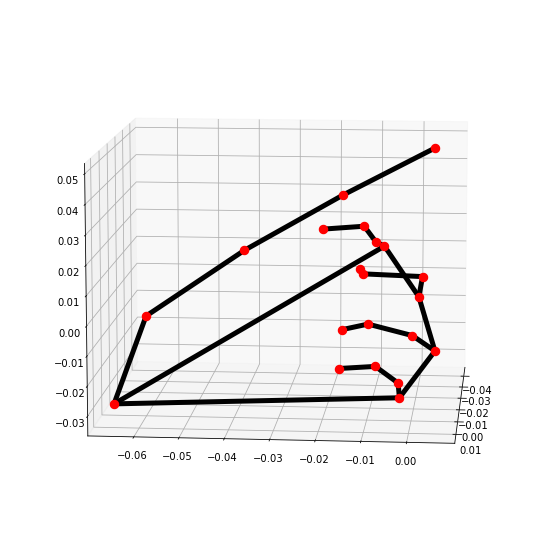

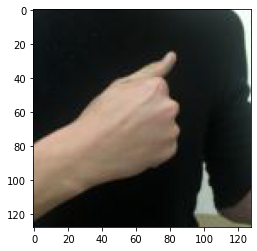



Image(9/3801) from e-MaviDikle-Data-18608.png is category e => [[1281, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(10/3801) from hello-MaviDikle-Data-12963.png is category hello => [[1282, 'hello']]


Image(11/3801) from project-MaviDikle-Data-9069.png is category project => [[1283, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(12/3801) from 9-MaviDikle-Data-2586.png is category 9 => [[1284, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(13/3801) from 2-MaviDikle-Data-19974.png is category 2 => [[1285, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(14/3801) from 9-MaviDikle-Data-2592.png is category 9 => [[1286, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(15/3801) from 4-MaviDikle-Data-17358.png is category 4 => [[1287, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(16/3801) from 2-MaviDikle-Data-19960.png is category 2 => [[1288, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(17/3801) from 2-MaviDikle-Data-20139.png is category 2 => [[1289, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Imag

**MEDIAPIPE DID NOT READ IMAGE**
Image(83/3801) from 6-MaviDikle-Data-5217.png is category 6 => [[1355, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(84/3801) from 7-MaviDikle-Data-4832.png is category 7 => [[1356, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(85/3801) from bye-MaviDikle-Data-6651.png is category bye => [[1357, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(86/3801) from no-MaviDikle-Data-2058.png is category no => [[1358, 'no']]


Image(87/3801) from c-MaviDikle-Data-15044.png is category c => [[1359, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(88/3801) from little bit-MaviDikle-Data-11725.png is category little bit => [[1360, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(89/3801) from bye-MaviDikle-Data-6889.png is category bye => [[1361, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(90/3801) from c-MaviDikle-Data-15722.png is category c => [[1362, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(91/3801) from bye-MaviDikle-Data-7229.png is category bye => [[1363

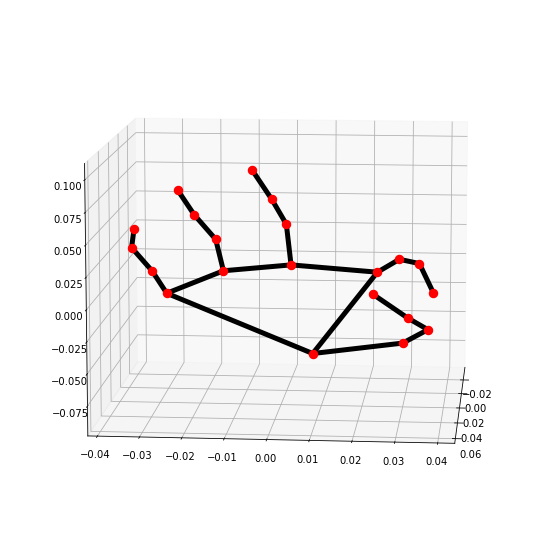

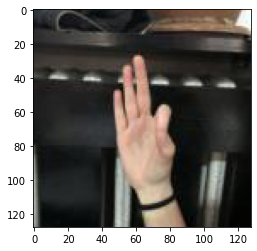



Image(129/3801) from b-MaviDikle-Data-19183.png is category b => [[1401, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(130/3801) from little bit-MaviDikle-Data-12210.png is category little bit => [[1402, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(131/3801) from a-MaviDikle-Data-8442.png is category a => [[1403, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(132/3801) from 1-MaviDikle-Data-6192.png is category 1 => [[1404, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(133/3801) from a-MaviDikle-Data-8324.png is category a => [[1405, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(134/3801) from good morning-MaviDikle-Data-14743.png is category good morning => [[1406, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(135/3801) from project-MaviDikle-Data-9096.png is category project => [[1407, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(136/3801) from 0-MaviDikle-Data-4066.png is category 0 => [[1408, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(137/3801) from yes-Mavi

**MEDIAPIPE DID NOT READ IMAGE**
Image(204/3801) from 7-MaviDikle-Data-4359.png is category 7 => [[1476, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(205/3801) from 3-MaviDikle-Data-18165.png is category 3 => [[1477, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(206/3801) from please-MaviDikle-Data-309.png is category please => [[1478, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(207/3801) from pardon-MaviDikle-Data-9800.png is category pardon => [[1479, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(208/3801) from 9-MaviDikle-Data-2948.png is category 9 => [[1480, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(209/3801) from 5-MaviDikle-Data-21329.png is category 5 => [[1481, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(210/3801) from d-MaviDikle-Data-15823.png is category d => [[1482, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(211/3801) from 9-MaviDikle-Data-2790.png is category 9 => [[1483, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(212/3801) from good morning-MaviDikle-Dat

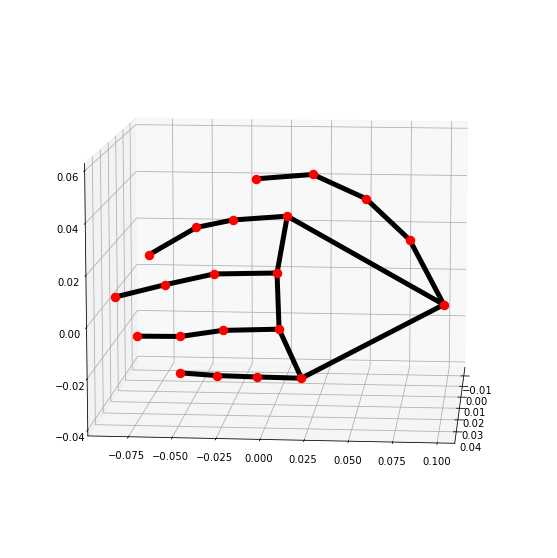

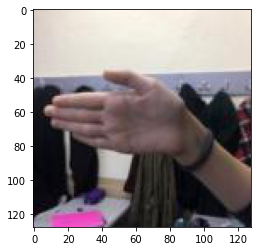



Image(249/3801) from 5-MaviDikle-Data-21473.png is category 5 => [[1521, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(250/3801) from 8-MaviDikle-Data-7889.png is category 8 => [[1522, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(251/3801) from whats up-MaviDikle-Data-1113.png is category whats up => [[1523, 'whats up']]


Image(252/3801) from c-MaviDikle-Data-22401.png is category c => [[1524, 'c']]


Image(253/3801) from 2-MaviDikle-Data-20461.png is category 2 => [[1525, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(254/3801) from 7-MaviDikle-Data-4403.png is category 7 => [[1526, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(255/3801) from please-MaviDikle-Data-453.png is category please => [[1527, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(256/3801) from good-MaviDikle-Data-22159.png is category good => [[1528, 'good']]


Image(257/3801) from 8-MaviDikle-Data-7651.png is category 8 => [[1529, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(258/3801) from 2-MaviDikle-Data-20307.

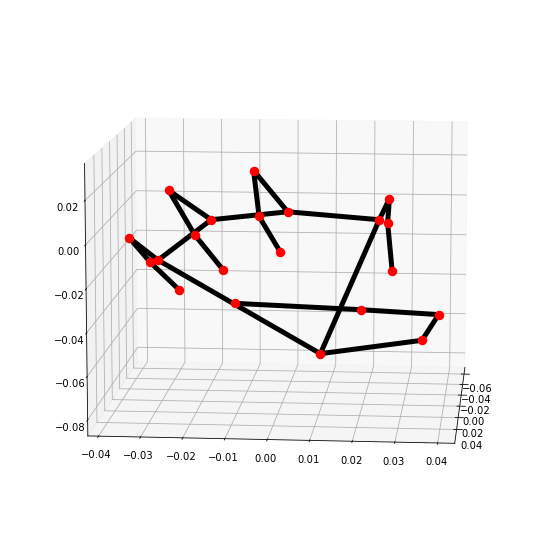

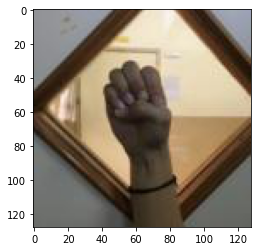



Image(269/3801) from 1-MaviDikle-Data-6347.png is category 1 => [[1541, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(270/3801) from hello-MaviDikle-Data-12591.png is category hello => [[1542, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(271/3801) from b-MaviDikle-Data-19430.png is category b => [[1543, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(272/3801) from pardon-MaviDikle-Data-10085.png is category pardon => [[1544, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(273/3801) from yes-MaviDikle-Data-13738.png is category yes => [[1545, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(274/3801) from 0-MaviDikle-Data-3537.png is category 0 => [[1546, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(275/3801) from d-MaviDikle-Data-16325.png is category d => [[1547, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(276/3801) from yes-MaviDikle-Data-14057.png is category yes => [[1548, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(277/3801) from 9-MaviDikle-Data-2747.png is category 9 => [

**MEDIAPIPE DID NOT READ IMAGE**
Image(344/3801) from 0-MaviDikle-Data-3279.png is category 0 => [[1616, '0']]


Image(345/3801) from good-MaviDikle-Data-11550.png is category good => [[1617, 'good']]


Image(346/3801) from hello-MaviDikle-Data-12552.png is category hello => [[1618, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(347/3801) from whats up-MaviDikle-Data-974.png is category whats up => [[1619, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(348/3801) from yes-MaviDikle-Data-13710.png is category yes => [[1620, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(349/3801) from good-MaviDikle-Data-11236.png is category good => [[1621, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(350/3801) from good morning-MaviDikle-Data-14555.png is category good morning => [[1622, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(351/3801) from project-MaviDikle-Data-9280.png is category project => [[1623, 'project']]


Image(352/3801) from 1-MaviDikle-Data-6384.png is category 1

**MEDIAPIPE DID NOT READ IMAGE**
Image(419/3801) from good morning-MaviDikle-Data-14390.png is category good morning => [[1691, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(420/3801) from project-MaviDikle-Data-9445.png is category project => [[1692, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(421/3801) from hello-MaviDikle-Data-13089.png is category hello => [[1693, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(422/3801) from project-MaviDikle-Data-8983.png is category project => [[1694, 'project']]


Image(423/3801) from e-MaviDikle-Data-18224.png is category e => [[1695, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(424/3801) from no-MaviDikle-Data-1800.png is category no => [[1696, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(425/3801) from good-MaviDikle-Data-10935.png is category good => [[1697, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(426/3801) from b-MaviDikle-Data-19236.png is category b => [[1698, 'b']]


Image(427/3801) from hello-MaviDikle-Data-2

**MEDIAPIPE DID NOT READ IMAGE**
Image(492/3801) from bye-MaviDikle-Data-6533.png is category bye => [[1764, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(493/3801) from 3-MaviDikle-Data-17487.png is category 3 => [[1765, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(494/3801) from 7-MaviDikle-Data-4588.png is category 7 => [[1766, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(495/3801) from c-MaviDikle-Data-15326.png is category c => [[1767, 'c']]


Image(496/3801) from whats up-MaviDikle-Data-1098.png is category whats up => [[1768, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(497/3801) from c-MaviDikle-Data-14986.png is category c => [[1769, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(498/3801) from e-MaviDikle-Data-22621.png is category e => [[1770, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(499/3801) from c-MaviDikle-Data-15440.png is category c => [[1771, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(500/3801) from d-MaviDikle-Data-15994.png is category d => [[1772, 'd']]

**MEDIAPIPE DID NOT READ IMAGE**
Image(563/3801) from c-MaviDikle-Data-15695.png is category c => [[1835, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(564/3801) from 3-MaviDikle-Data-18207.png is category 3 => [[1836, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(565/3801) from 2-MaviDikle-Data-20059.png is category 2 => [[1837, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(566/3801) from 4-MaviDikle-Data-17238.png is category 4 => [[1838, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(567/3801) from 1-MaviDikle-Data-21880.png is category 1 => [[1839, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(568/3801) from 3-MaviDikle-Data-18213.png is category 3 => [[1840, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(569/3801) from c-MaviDikle-Data-15681.png is category c => [[1841, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(570/3801) from hello-MaviDikle-Data-12803.png is category hello => [[1842, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(571/3801) from project-MaviDikle-Data-9109.png is cat

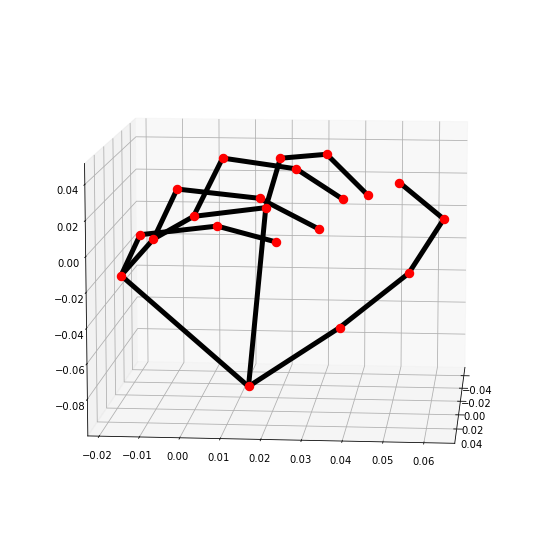

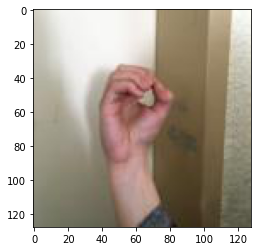



Image(609/3801) from project-MaviDikle-Data-9135.png is category project => [[1881, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(610/3801) from 1-MaviDikle-Data-6031.png is category 1 => [[1882, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(611/3801) from a-MaviDikle-Data-8287.png is category a => [[1883, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(612/3801) from e-MaviDikle-Data-18754.png is category e => [[1884, 'e']]


Image(613/3801) from good-MaviDikle-Data-11183.png is category good => [[1885, 'good']]


Image(614/3801) from pardon-MaviDikle-Data-10318.png is category pardon => [[1886, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(615/3801) from good morning-MaviDikle-Data-14838.png is category good morning => [[1887, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(616/3801) from b-MaviDikle-Data-19746.png is category b => [[1888, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(617/3801) from good morning-MaviDikle-Data-22352.png is category good morning => [[188

**MEDIAPIPE DID NOT READ IMAGE**
Image(682/3801) from project-MaviDikle-Data-9684.png is category project => [[1954, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(683/3801) from little bit-MaviDikle-Data-12364.png is category little bit => [[1955, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(684/3801) from good-MaviDikle-Data-11632.png is category good => [[1956, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(685/3801) from good-MaviDikle-Data-11154.png is category good => [[1957, 'good']]


Image(686/3801) from yes-MaviDikle-Data-13472.png is category yes => [[1958, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(687/3801) from hello-MaviDikle-Data-12630.png is category hello => [[1959, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(688/3801) from little bit-MaviDikle-Data-12402.png is category little bit => [[1960, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(689/3801) from b-MaviDikle-Data-19791.png is category b => [[1961, 'b']]
**MEDIAPIPE DID NOT READ IMA

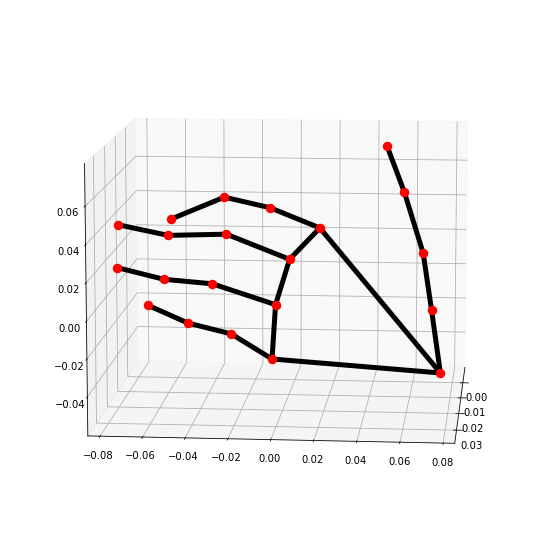

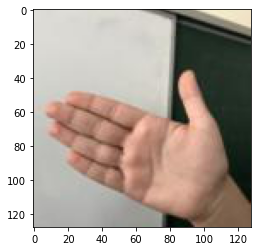



Image(709/3801) from 4-MaviDikle-Data-16873.png is category 4 => [[1981, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(710/3801) from c-MaviDikle-Data-15118.png is category c => [[1982, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(711/3801) from 9-MaviDikle-Data-3061.png is category 9 => [[1983, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(712/3801) from no-MaviDikle-Data-2104.png is category no => [[1984, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(713/3801) from 3-MaviDikle-Data-17861.png is category 3 => [[1985, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(714/3801) from e-MaviDikle-Data-18796.png is category e => [[1986, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(715/3801) from a-MaviDikle-Data-8245.png is category a => [[1987, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(716/3801) from good morning-MaviDikle-Data-14622.png is category good morning => [[1988, 'good morning']]


Image(717/3801) from good morning-MaviDikle-Data-22390.png is category good morning => [[1989, 'good

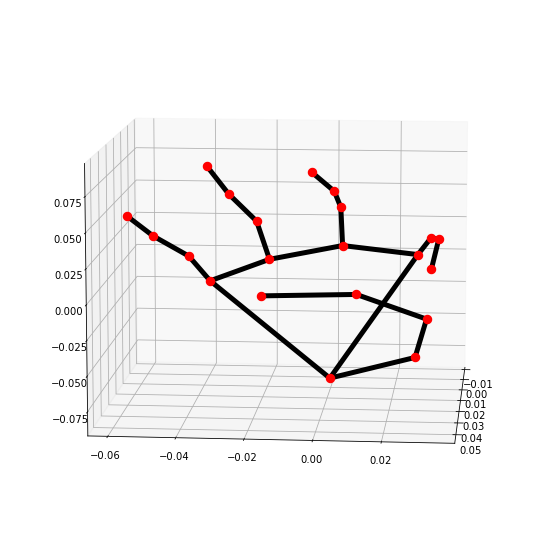

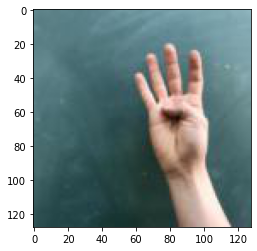



Image(729/3801) from good-MaviDikle-Data-11627.png is category good => [[2001, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(730/3801) from little bit-MaviDikle-Data-12371.png is category little bit => [[2002, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(731/3801) from project-MaviDikle-Data-9691.png is category project => [[2003, 'project']]


Image(732/3801) from a-MaviDikle-Data-8523.png is category a => [[2004, 'a']]


Image(733/3801) from good-MaviDikle-Data-11633.png is category good => [[2005, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(734/3801) from little bit-MaviDikle-Data-12365.png is category little bit => [[2006, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(735/3801) from good morning-MaviDikle-Data-14150.png is category good morning => [[2007, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(736/3801) from project-MaviDikle-Data-9685.png is category project => [[2008, 'project']]


Image(737/3801) from hello-MaviDikle-Data-13249.png is ca

**MEDIAPIPE DID NOT READ IMAGE**
Image(801/3801) from good morning-MaviDikle-Data-14839.png is category good morning => [[2073, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(802/3801) from good-MaviDikle-Data-11182.png is category good => [[2074, 'good']]


Image(803/3801) from pardon-MaviDikle-Data-10319.png is category pardon => [[2075, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(804/3801) from e-MaviDikle-Data-18755.png is category e => [[2076, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(805/3801) from a-MaviDikle-Data-8286.png is category a => [[2077, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(806/3801) from 1-MaviDikle-Data-6030.png is category 1 => [[2078, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(807/3801) from 0-MaviDikle-Data-3873.png is category 0 => [[2079, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(808/3801) from project-MaviDikle-Data-9134.png is category project => [[2080, 'project']]


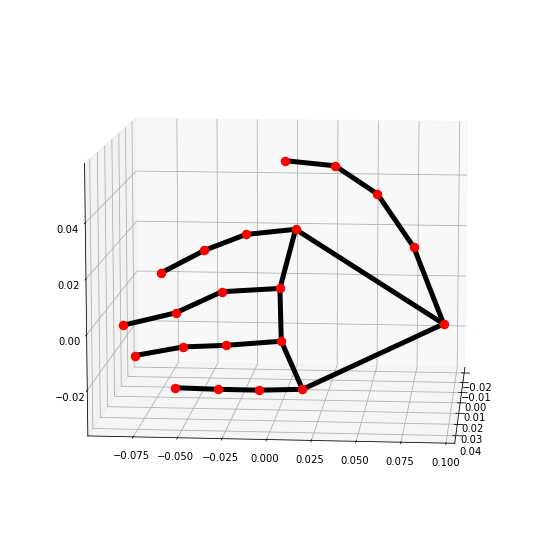

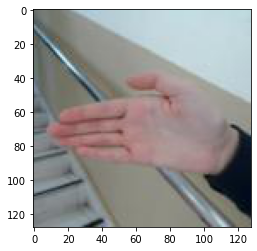



Image(809/3801) from 6-MaviDikle-Data-4929.png is category 6 => [[2081, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(810/3801) from please-MaviDikle-Data-64.png is category please => [[2082, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(811/3801) from good morning-MaviDikle-Data-14187.png is category good morning => [[2083, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(812/3801) from project-MaviDikle-Data-9652.png is category project => [[2084, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(813/3801) from 6-MaviDikle-Data-5389.png is category 6 => [[2085, '6']]


Image(814/3801) from 7-MaviDikle-Data-4774.png is category 7 => [[2086, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(815/3801) from please-MaviDikle-Data-724.png is category please => [[2087, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(816/3801) from 8-MaviDikle-Data-7526.png is category 8 => [[2088, '8']]


Image(817/3801) from whats up-MaviDikle-Data-1264.png is category whats up => [[2089, 'whats 

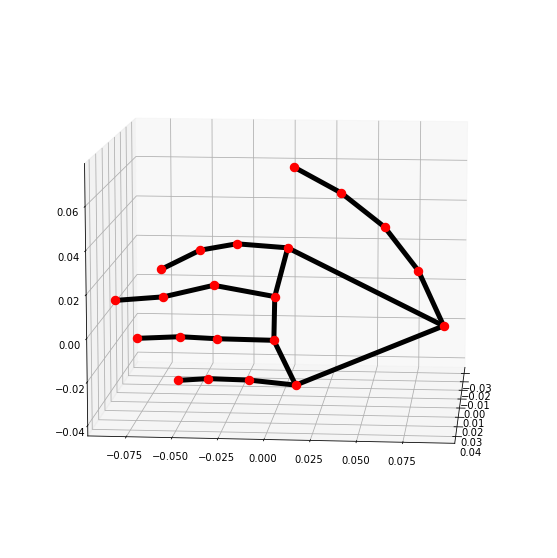

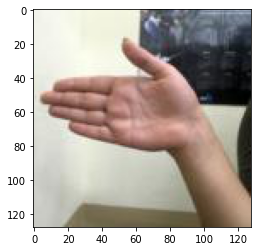



Image(829/3801) from please-MaviDikle-Data-70.png is category please => [[2101, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(830/3801) from b-MaviDikle-Data-19035.png is category b => [[2102, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(831/3801) from e-MaviDikle-Data-18999.png is category e => [[2103, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(832/3801) from b-MaviDikle-Data-19753.png is category b => [[2104, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(833/3801) from good-MaviDikle-Data-11196.png is category good => [[2105, 'good']]


Image(834/3801) from e-MaviDikle-Data-18741.png is category e => [[2106, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(835/3801) from 1-MaviDikle-Data-6024.png is category 1 => [[2107, '1']]


Image(836/3801) from a-MaviDikle-Data-8292.png is category a => [[2108, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(837/3801) from project-MaviDikle-Data-9120.png is category project => [[2109, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(838/3801) 

**MEDIAPIPE DID NOT READ IMAGE**
Image(904/3801) from bye-MaviDikle-Data-7162.png is category bye => [[2176, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(905/3801) from 1-MaviDikle-Data-5934.png is category 1 => [[2177, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(906/3801) from NULL-MaviDikle-Data-10672.png is category NULL => [[2178, 'NULL']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(907/3801) from e-MaviDikle-Data-22608.png is category e => [[2179, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(908/3801) from 5-MaviDikle-Data-20817.png is category 5 => [[2180, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(909/3801) from no-MaviDikle-Data-2313.png is category no => [[2181, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(910/3801) from a-MaviDikle-Data-8735.png is category a => [[2182, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(911/3801) from good morning-MaviDikle-Data-14352.png is category good morning => [[2183, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(912/3801) from pro

**MEDIAPIPE DID NOT READ IMAGE**
Image(978/3801) from good-MaviDikle-Data-10920.png is category good => [[2250, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(979/3801) from b-MaviDikle-Data-19223.png is category b => [[2251, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(980/3801) from no-MaviDikle-Data-1815.png is category no => [[2252, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(981/3801) from e-MaviDikle-Data-18231.png is category e => [[2253, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(982/3801) from project-MaviDikle-Data-8996.png is category project => [[2254, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(983/3801) from good morning-MaviDikle-Data-14385.png is category good morning => [[2255, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(984/3801) from project-MaviDikle-Data-9450.png is category project => [[2256, 'project']]


Image(985/3801) from project-MaviDikle-Data-9336.png is category project => [[2257, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(9

**MEDIAPIPE DID NOT READ IMAGE**
Image(1050/3801) from 0-MaviDikle-Data-3481.png is category 0 => [[2322, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1051/3801) from d-MaviDikle-Data-16293.png is category d => [[2323, 'd']]


Image(1052/3801) from pardon-MaviDikle-Data-10133.png is category pardon => [[2324, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1053/3801) from 3-MaviDikle-Data-18004.png is category 3 => [[2325, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1054/3801) from 7-MaviDikle-Data-4238.png is category 7 => [[2326, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1055/3801) from c-MaviDikle-Data-15496.png is category c => [[2327, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1056/3801) from please-MaviDikle-Data-268.png is category please => [[2328, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1057/3801) from 9-MaviDikle-Data-2829.png is category 9 => [[2329, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1058/3801) from pardon-MaviDikle-Data-9961.png is category pard

**MEDIAPIPE DID NOT READ IMAGE**
Image(1124/3801) from 5-MaviDikle-Data-20793.png is category 5 => [[2396, '5']]


Image(1125/3801) from 8-MaviDikle-Data-21979.png is category 8 => [[2397, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1126/3801) from d-MaviDikle-Data-16456.png is category d => [[2398, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1127/3801) from no-MaviDikle-Data-1746.png is category no => [[2399, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1128/3801) from hello-MaviDikle-Data-13117.png is category hello => [[2400, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1129/3801) from 6-MaviDikle-Data-5000.png is category 6 => [[2401, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1130/3801) from a-MaviDikle-Data-8669.png is category a => [[2402, 'a']]


Image(1131/3801) from good morning-MaviDikle-Data-14568.png is category good morning => [[2403, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1132/3801) from yes-MaviDikle-Data-14042.png is category yes => [[2404, 'y

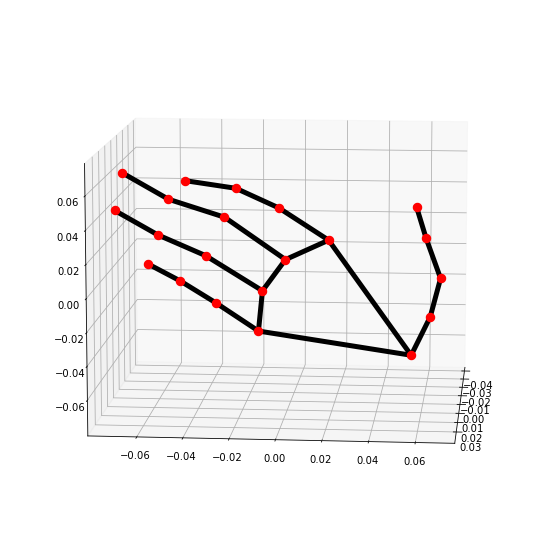

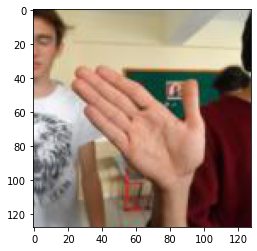



Image(1169/3801) from no-MaviDikle-Data-1961.png is category no => [[2441, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1170/3801) from b-MaviDikle-Data-19357.png is category b => [[2442, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1171/3801) from b-MaviDikle-Data-19431.png is category b => [[2443, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1172/3801) from hello-MaviDikle-Data-12590.png is category hello => [[2444, 'hello']]


Image(1173/3801) from 1-MaviDikle-Data-6346.png is category 1 => [[2445, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1174/3801) from e-MaviDikle-Data-18423.png is category e => [[2446, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1175/3801) from good morning-MaviDikle-Data-14597.png is category good morning => [[2447, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1176/3801) from project-MaviDikle-Data-9242.png is category project => [[2448, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1177/3801) from 5-MaviDikle-Data-21314.png is category 5

**MEDIAPIPE DID NOT READ IMAGE**
Image(1242/3801) from d-MaviDikle-Data-15836.png is category d => [[2514, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1243/3801) from pardon-MaviDikle-Data-9815.png is category pardon => [[2515, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1244/3801) from 3-MaviDikle-Data-18170.png is category 3 => [[2516, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1245/3801) from c-MaviDikle-Data-15284.png is category c => [[2517, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1246/3801) from c-MaviDikle-Data-22428.png is category c => [[2518, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1247/3801) from 2-MaviDikle-Data-20448.png is category 2 => [[2519, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1248/3801) from 8-MaviDikle-Data-7678.png is category 8 => [[2520, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1249/3801) from 3-MaviDikle-Data-17525.png is category 3 => [[2521, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1250/3801) from good-MaviDikle-Data-22170.pn

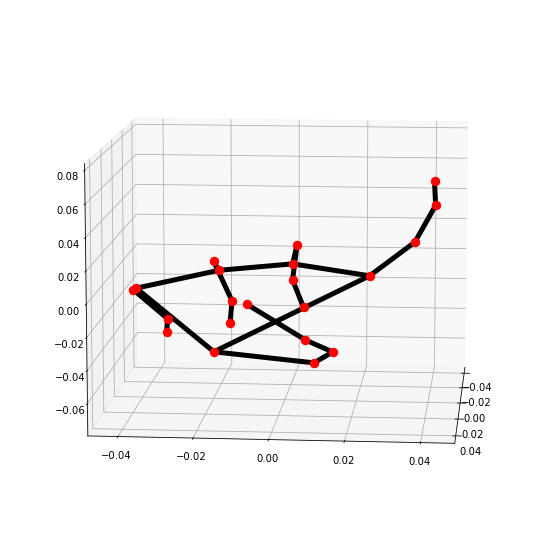

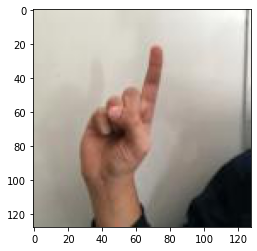



Image(1269/3801) from a-MaviDikle-Data-8331.png is category a => [[2541, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1270/3801) from bye-MaviDikle-Data-7200.png is category bye => [[2542, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1271/3801) from b-MaviDikle-Data-22666.png is category b => [[2543, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1272/3801) from 4-MaviDikle-Data-16906.png is category 4 => [[2544, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1273/3801) from please-MaviDikle-Data-693.png is category please => [[2545, 'please']]


Image(1274/3801) from 9-MaviDikle-Data-3114.png is category 9 => [[2546, '9']]


Image(1275/3801) from 8-MaviDikle-Data-7491.png is category 8 => [[2547, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1276/3801) from bye-MaviDikle-Data-6678.png is category bye => [[2548, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1277/3801) from no-MaviDikle-Data-2071.png is category no => [[2549, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1278/3801) from

**MEDIAPIPE DID NOT READ IMAGE**
Image(1343/3801) from c-MaviDikle-Data-15723.png is category c => [[2615, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1344/3801) from bye-MaviDikle-Data-7228.png is category bye => [[2616, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1345/3801) from please-MaviDikle-Data-136.png is category please => [[2617, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1346/3801) from 7-MaviDikle-Data-4166.png is category 7 => [[2618, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1347/3801) from 2-MaviDikle-Data-20104.png is category 2 => [[2619, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1348/3801) from 8-MaviDikle-Data-8007.png is category 8 => [[2620, '8']]


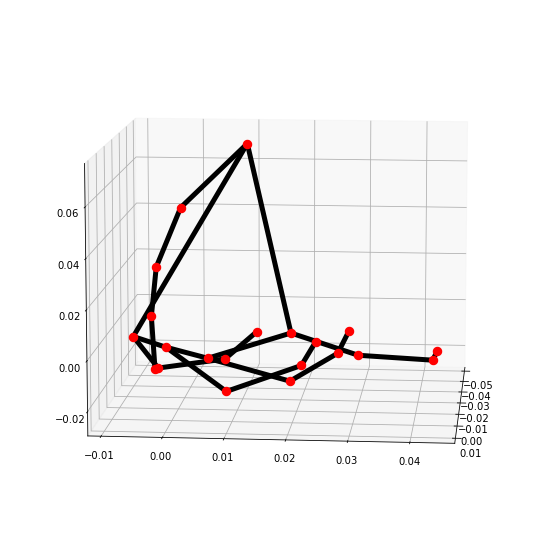

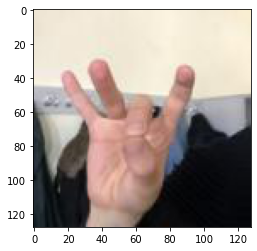



Image(1349/3801) from whats up-MaviDikle-Data-1476.png is category whats up => [[2621, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1350/3801) from 4-MaviDikle-Data-17365.png is category 4 => [[2622, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1351/3801) from 5-MaviDikle-Data-21116.png is category 5 => [[2623, '5']]


Image(1352/3801) from good morning-MaviDikle-Data-14795.png is category good morning => [[2624, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1353/3801) from project-MaviDikle-Data-9040.png is category project => [[2625, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1354/3801) from 0-MaviDikle-Data-3907.png is category 0 => [[2626, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1355/3801) from 2-MaviDikle-Data-22713.png is category 2 => [[2627, '2']]


Image(1356/3801) from e-MaviDikle-Data-18621.png is category e => [[2628, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1357/3801) from 1-MaviDikle-Data-6144.png is category 1 => [[2629, '1']]
**MEDIAP

**MEDIAPIPE DID NOT READ IMAGE**
Image(1422/3801) from 9-MaviDikle-Data-2587.png is category 9 => [[2694, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1423/3801) from project-MaviDikle-Data-9068.png is category project => [[2695, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1424/3801) from hello-MaviDikle-Data-12962.png is category hello => [[2696, 'hello']]


Image(1425/3801) from e-MaviDikle-Data-18609.png is category e => [[2697, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1426/3801) from pardon-MaviDikle-Data-10245.png is category pardon => [[2698, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1427/3801) from project-MaviDikle-Data-9718.png is category project => [[2699, 'project']]


Image(1428/3801) from pardon-MaviDikle-Data-10535.png is category pardon => [[2700, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1429/3801) from 3-MaviDikle-Data-17731.png is category 3 => [[2701, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1430/3801) from c-MaviDikle-Data-15090.png i

**MEDIAPIPE DID NOT READ IMAGE**
Image(1496/3801) from b-MaviDikle-Data-19625.png is category b => [[2768, 'b']]


Image(1497/3801) from hello-MaviDikle-Data-12784.png is category hello => [[2769, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1498/3801) from e-MaviDikle-Data-18637.png is category e => [[2770, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1499/3801) from 1-MaviDikle-Data-6152.png is category 1 => [[2771, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1500/3801) from good morning-MaviDikle-Data-14783.png is category good morning => [[2772, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1501/3801) from project-MaviDikle-Data-9056.png is category project => [[2773, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1502/3801) from 0-MaviDikle-Data-3911.png is category 0 => [[2774, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1503/3801) from 2-MaviDikle-Data-22705.png is category 2 => [[2775, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1504/3801) from project-Mavi

**MEDIAPIPE DID NOT READ IMAGE**
Image(1568/3801) from hello-MaviDikle-Data-12753.png is category hello => [[2840, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1569/3801) from yes-MaviDikle-Data-13511.png is category yes => [[2841, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1570/3801) from good-MaviDikle-Data-11037.png is category good => [[2842, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1571/3801) from 1-MaviDikle-Data-6191.png is category 1 => [[2843, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1572/3801) from a-MaviDikle-Data-8327.png is category a => [[2844, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1573/3801) from good morning-MaviDikle-Data-14740.png is category good morning => [[2845, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1574/3801) from project-MaviDikle-Data-9095.png is category project => [[2846, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1575/3801) from 0-MaviDikle-Data-4065.png is category 0 => [[2847, '0']]
**MEDIAPIPE DID NOT RE

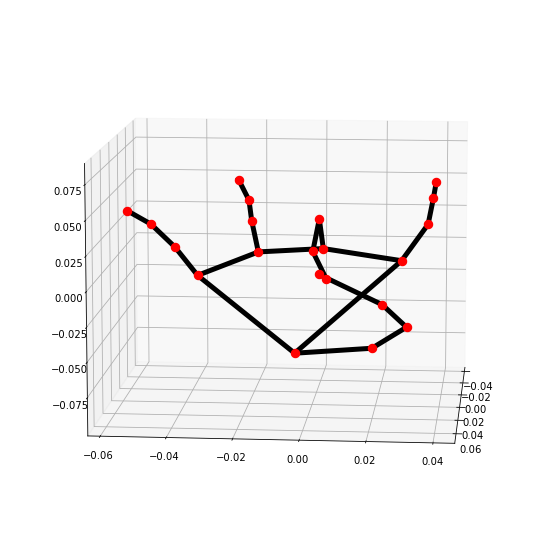

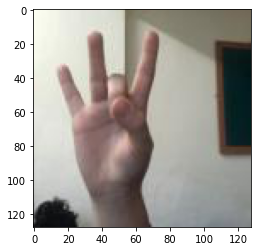



Image(1589/3801) from little bit-MaviDikle-Data-12213.png is category little bit => [[2861, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1590/3801) from b-MaviDikle-Data-19180.png is category b => [[2862, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1591/3801) from a-MaviDikle-Data-8441.png is category a => [[2863, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1592/3801) from 6-MaviDikle-Data-5228.png is category 6 => [[2864, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1593/3801) from yes-MaviDikle-Data-13934.png is category yes => [[2865, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1594/3801) from 1-MaviDikle-Data-6378.png is category 1 => [[2866, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1595/3801) from whats up-MaviDikle-Data-988.png is category whats up => [[2867, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1596/3801) from pardon-MaviDikle-Data-10051.png is category pardon => [[2868, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1597/3801) from yes-Mavi

**MEDIAPIPE DID NOT READ IMAGE**
Image(1664/3801) from whats up-MaviDikle-Data-1104.png is category whats up => [[2936, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1665/3801) from 8-MaviDikle-Data-7646.png is category 8 => [[2937, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1666/3801) from 7-MaviDikle-Data-4414.png is category 7 => [[2938, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1667/3801) from 2-MaviDikle-Data-20476.png is category 2 => [[2939, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1668/3801) from c-MaviDikle-Data-22416.png is category c => [[2940, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1669/3801) from please-MaviDikle-Data-444.png is category please => [[2941, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1670/3801) from a-MaviDikle-Data-8858.png is category a => [[2942, 'a']]


Image(1671/3801) from b-MaviDikle-Data-19341.png is category b => [[2943, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1672/3801) from good-MaviDikle-Data-11584.png is category 

**MEDIAPIPE DID NOT READ IMAGE**
Image(1736/3801) from project-MaviDikle-Data-9283.png is category project => [[3008, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1737/3801) from 1-MaviDikle-Data-6387.png is category 1 => [[3009, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1738/3801) from 1-MaviDikle-Data-5856.png is category 1 => [[3010, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1739/3801) from 6-MaviDikle-Data-21812.png is category 6 => [[3011, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1740/3801) from 3-MaviDikle-Data-18199.png is category 3 => [[3012, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1741/3801) from bye-MaviDikle-Data-7000.png is category bye => [[3013, 'bye']]


Image(1742/3801) from NULL-MaviDikle-Data-10710.png is category NULL => [[3014, 'NULL']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1743/3801) from 8-MaviDikle-Data-21947.png is category 8 => [[3015, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1744/3801) from 8-MaviDikle-Data-7691.png is category 8 => 

**MEDIAPIPE DID NOT READ IMAGE**
Image(1808/3801) from b-MaviDikle-Data-19209.png is category b => [[3080, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1809/3801) from a-MaviDikle-Data-8910.png is category a => [[3081, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1810/3801) from 3-MaviDikle-Data-17453.png is category 3 => [[3082, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1811/3801) from NULL-MaviDikle-Data-10857.png is category NULL => [[3083, 'NULL']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1812/3801) from d-MaviDikle-Data-15940.png is category d => [[3084, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1813/3801) from 1-MaviDikle-Data-5711.png is category 1 => [[3085, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1814/3801) from 4-MaviDikle-Data-17039.png is category 4 => [[3086, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1815/3801) from pardon-MaviDikle-Data-9963.png is category pardon => [[3087, 'pardon']]


Image(1816/3801) from d-MaviDikle-Data-15798.png is category d => [[3088,

**MEDIAPIPE DID NOT READ IMAGE**
Image(1880/3801) from e-MaviDikle-Data-22622.png is category e => [[3152, 'e']]


Image(1881/3801) from c-MaviDikle-Data-14985.png is category c => [[3153, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1882/3801) from NULL-MaviDikle-Data-10658.png is category NULL => [[3154, 'NULL']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1883/3801) from c-MaviDikle-Data-15443.png is category c => [[3155, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1884/3801) from bye-MaviDikle-Data-7148.png is category bye => [[3156, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1885/3801) from 9-MaviDikle-Data-21670.png is category 9 => [[3157, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1886/3801) from 9-MaviDikle-Data-2624.png is category 9 => [[3158, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1887/3801) from NULL-MaviDikle-Data-10880.png is category NULL => [[3159, 'NULL']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1888/3801) from d-MaviDikle-Data-15997.png is category d => [[3160

**MEDIAPIPE DID NOT READ IMAGE**
Image(1954/3801) from good morning-MaviDikle-Data-14344.png is category good morning => [[3226, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1955/3801) from project-MaviDikle-Data-9491.png is category project => [[3227, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1956/3801) from a-MaviDikle-Data-8723.png is category a => [[3228, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1957/3801) from good-MaviDikle-Data-11433.png is category good => [[3229, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1958/3801) from d-MaviDikle-Data-16508.png is category d => [[3230, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1959/3801) from little bit-MaviDikle-Data-12165.png is category little bit => [[3231, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1960/3801) from hello-MaviDikle-Data-22294.png is category hello => [[3232, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(1961/3801) from good morning-MaviDikle-Data-14350.png is category good mo

**MEDIAPIPE DID NOT READ IMAGE**
Image(2024/3801) from project-MaviDikle-Data-9650.png is category project => [[3296, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2025/3801) from please-MaviDikle-Data-66.png is category please => [[3297, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2026/3801) from project-MaviDikle-Data-9136.png is category project => [[3298, 'project']]


Image(2027/3801) from 0-MaviDikle-Data-3871.png is category 0 => [[3299, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2028/3801) from e-MaviDikle-Data-18757.png is category e => [[3300, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2029/3801) from 1-MaviDikle-Data-6032.png is category 1 => [[3301, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2030/3801) from a-MaviDikle-Data-8284.png is category a => [[3302, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2031/3801) from good-MaviDikle-Data-11180.png is category good => [[3303, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2032/3801) from good morning-MaviDik

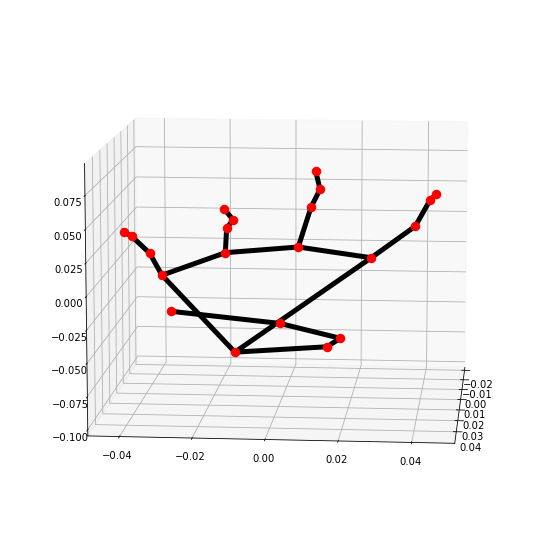

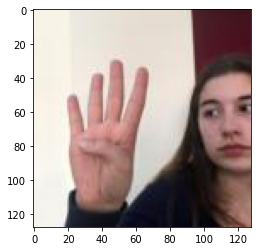



Image(2069/3801) from 4-MaviDikle-Data-22531.png is category 4 => [[3341, '4']]


Image(2070/3801) from 6-MaviDikle-Data-5374.png is category 6 => [[3342, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2071/3801) from hello-MaviDikle-Data-13263.png is category hello => [[3343, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2072/3801) from please-MaviDikle-Data-99.png is category please => [[3344, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2073/3801) from good-MaviDikle-Data-11619.png is category good => [[3345, 'good']]


Image(2074/3801) from pardon-MaviDikle-Data-10482.png is category pardon => [[3346, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2075/3801) from yes-MaviDikle-Data-13459.png is category yes => [[3347, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2076/3801) from 0-MaviDikle-Data-3656.png is category 0 => [[3348, '0']]


Image(2077/3801) from d-MaviDikle-Data-16044.png is category d => [[3349, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2078/3801) from 

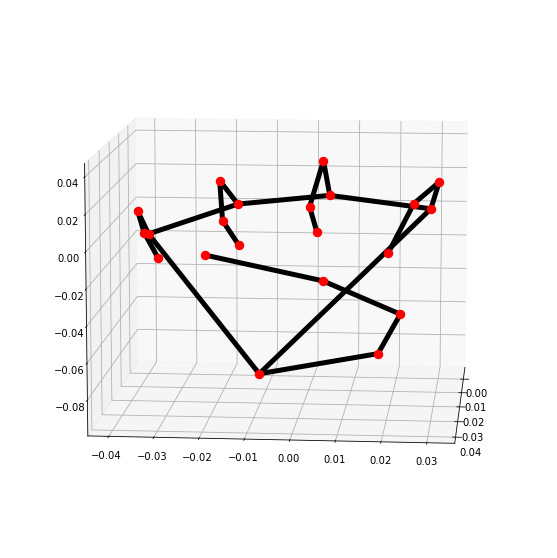

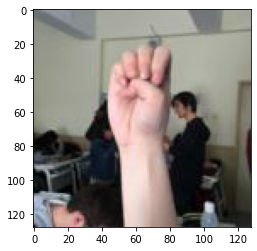



Image(2089/3801) from good morning-MaviDikle-Data-14608.png is category good morning => [[3361, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2090/3801) from 6-MaviDikle-Data-5406.png is category 6 => [[3362, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2091/3801) from 6-MaviDikle-Data-5360.png is category 6 => [[3363, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2092/3801) from 4-MaviDikle-Data-22525.png is category 4 => [[3364, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2093/3801) from a-MaviDikle-Data-8509.png is category a => [[3365, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2094/3801) from hello-MaviDikle-Data-13277.png is category hello => [[3366, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2095/3801) from pardon-MaviDikle-Data-10496.png is category pardon => [[3367, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2096/3801) from d-MaviDikle-Data-22493.png is category d => [[3368, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2097/3801) from 3-MaviDikle-Dat

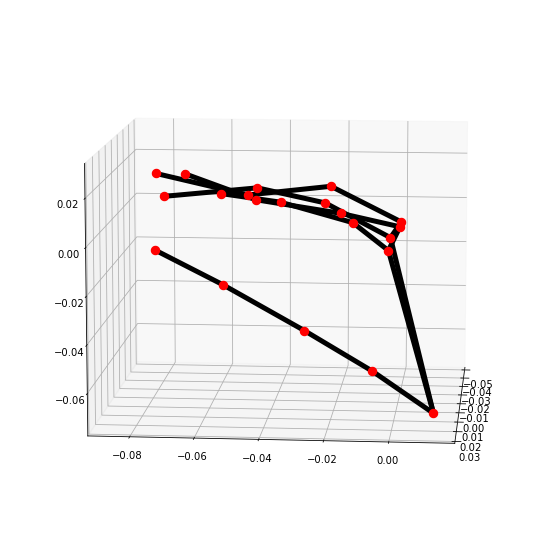

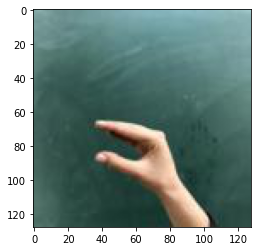



Image(2149/3801) from good morning-MaviDikle-Data-22387.png is category good morning => [[3421, 'good morning']]


Image(2150/3801) from e-MaviDikle-Data-18959.png is category e => [[3422, 'e']]


Image(2151/3801) from yes-MaviDikle-Data-13470.png is category yes => [[3423, 'yes']]


Image(2152/3801) from good-MaviDikle-Data-11156.png is category good => [[3424, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2153/3801) from hello-MaviDikle-Data-12632.png is category hello => [[3425, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2154/3801) from good-MaviDikle-Data-11630.png is category good => [[3426, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2155/3801) from little bit-MaviDikle-Data-12366.png is category little bit => [[3427, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2156/3801) from good morning-MaviDikle-Data-14153.png is category good morning => [[3428, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2157/3801) from project-MaviDikle-Data-9686.png is c

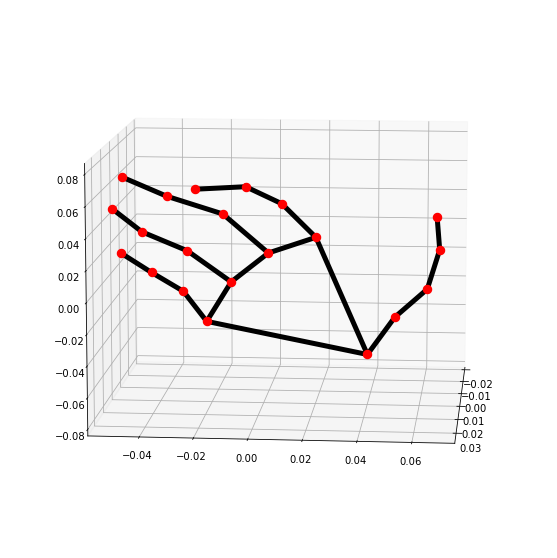

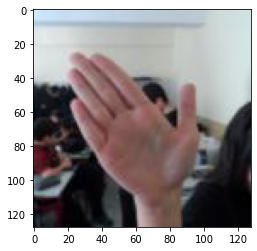



Image(2169/3801) from little bit-MaviDikle-Data-12372.png is category little bit => [[3441, 'little bit']]


Image(2170/3801) from 3-MaviDikle-Data-22600.png is category 3 => [[3442, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2171/3801) from project-MaviDikle-Data-9692.png is category project => [[3443, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2172/3801) from 6-MaviDikle-Data-5349.png is category 6 => [[3444, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2173/3801) from a-MaviDikle-Data-8520.png is category a => [[3445, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2174/3801) from a-MaviDikle-Data-8246.png is category a => [[3446, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2175/3801) from e-MaviDikle-Data-18795.png is category e => [[3447, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2176/3801) from good morning-MaviDikle-Data-14621.png is category good morning => [[3448, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2177/3801) from little bit-MaviDikle-Data-124



Image(2242/3801) from little bit-MaviDikle-Data-11874.png is category little bit => [[3514, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2243/3801) from please-MaviDikle-Data-73.png is category please => [[3515, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2244/3801) from good morning-MaviDikle-Data-14190.png is category good morning => [[3516, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2245/3801) from project-MaviDikle-Data-9645.png is category project => [[3517, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2246/3801) from hello-MaviDikle-Data-13289.png is category hello => [[3518, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2247/3801) from pardon-MaviDikle-Data-10468.png is category pardon => [[3519, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2248/3801) from b-MaviDikle-Data-19036.png is category b => [[3520, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2249/3801) from good morning-MaviDikle-Data-14184.png is category good morning => [[3

**MEDIAPIPE DID NOT READ IMAGE**
Image(2312/3801) from project-MaviDikle-Data-9484.png is category project => [[3584, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2313/3801) from little bit-MaviDikle-Data-12164.png is category little bit => [[3585, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2314/3801) from hello-MaviDikle-Data-22295.png is category hello => [[3586, 'hello']]


Image(2315/3801) from d-MaviDikle-Data-16509.png is category d => [[3587, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2316/3801) from good-MaviDikle-Data-11432.png is category good => [[3588, 'good']]


Image(2317/3801) from whats up-MaviDikle-Data-816.png is category whats up => [[3589, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2318/3801) from good-MaviDikle-Data-11354.png is category good => [[3590, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2319/3801) from yes-MaviDikle-Data-13672.png is category yes => [[3591, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2320/3801) from b-Ma

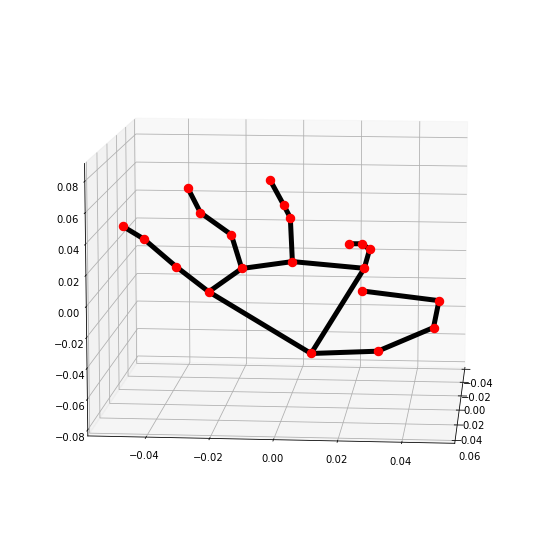

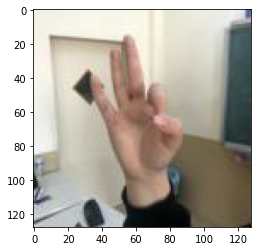



Image(2369/3801) from a-MaviDikle-Data-22024.png is category a => [[3641, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2370/3801) from c-MaviDikle-Data-15456.png is category c => [[3642, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2371/3801) from c-MaviDikle-Data-14990.png is category c => [[3643, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2372/3801) from e-MaviDikle-Data-22637.png is category e => [[3644, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2373/3801) from good-MaviDikle-Data-11368.png is category good => [[3645, 'good']]


Image(2374/3801) from 0-MaviDikle-Data-3441.png is category 0 => [[3646, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2375/3801) from d-MaviDikle-Data-16253.png is category d => [[3647, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2376/3801) from yes-MaviDikle-Data-14121.png is category yes => [[3648, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2377/3801) from yes-MaviDikle-Data-13896.png is category yes => [[3649, 'yes']]
**MEDIAPIPE DID NOT READ 

**MEDIAPIPE DID NOT READ IMAGE**
Image(2442/3801) from please-MaviDikle-Data-243.png is category please => [[3714, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2443/3801) from 9-MaviDikle-Data-2802.png is category 9 => [[3715, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2444/3801) from 4-MaviDikle-Data-17010.png is category 4 => [[3716, '4']]


Image(2445/3801) from 1-MaviDikle-Data-5738.png is category 1 => [[3717, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2446/3801) from 5-MaviDikle-Data-21263.png is category 5 => [[3718, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2447/3801) from d-MaviDikle-Data-15969.png is category d => [[3719, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2448/3801) from pardon-MaviDikle-Data-9792.png is category pardon => [[3720, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2449/3801) from whats up-MaviDikle-Data-1065.png is category whats up => [[3721, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2450/3801) from 2-MaviDikle-Data-20517.png 

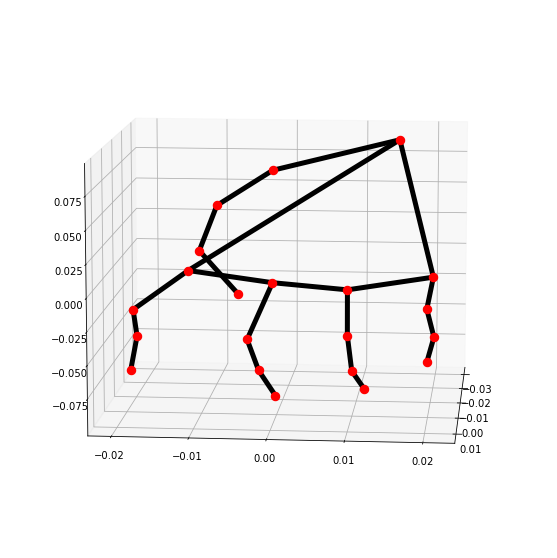

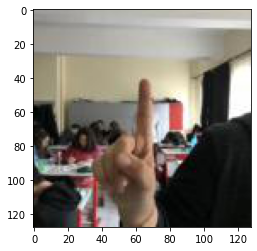



Image(2469/3801) from pardon-MaviDikle-Data-10130.png is category pardon => [[3741, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2470/3801) from d-MaviDikle-Data-16290.png is category d => [[3742, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2471/3801) from 0-MaviDikle-Data-3482.png is category 0 => [[3743, '0']]


Image(2472/3801) from c-MaviDikle-Data-15495.png is category c => [[3744, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2473/3801) from 3-MaviDikle-Data-18007.png is category 3 => [[3745, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2474/3801) from 2-MaviDikle-Data-20259.png is category 2 => [[3746, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2475/3801) from pardon-MaviDikle-Data-9962.png is category pardon => [[3747, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2476/3801) from d-MaviDikle-Data-15799.png is category d => [[3748, 'd']]


Image(2477/3801) from 4-MaviDikle-Data-17038.png is category 4 => [[3749, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2478/3801

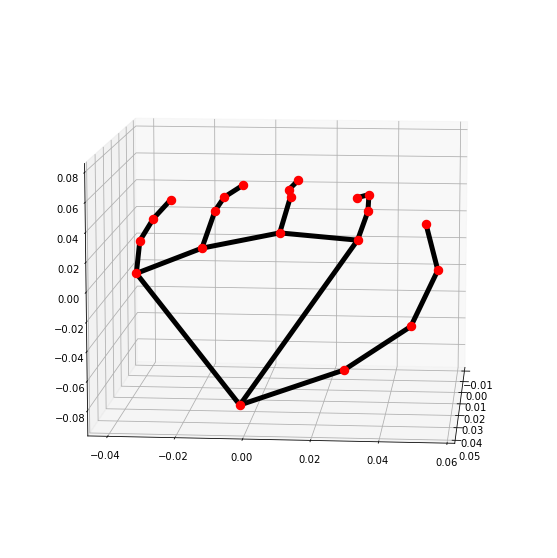

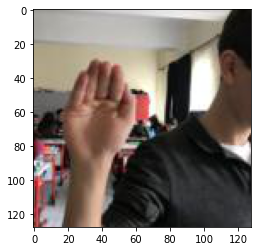



Image(2529/3801) from 3-MaviDikle-Data-18198.png is category 3 => [[3801, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2530/3801) from 6-MaviDikle-Data-21813.png is category 6 => [[3802, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2531/3801) from 1-MaviDikle-Data-5857.png is category 1 => [[3803, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2532/3801) from 1-MaviDikle-Data-6386.png is category 1 => [[3804, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2533/3801) from good morning-MaviDikle-Data-14557.png is category good morning => [[3805, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2534/3801) from project-MaviDikle-Data-9282.png is category project => [[3806, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2535/3801) from whats up-MaviDikle-Data-976.png is category whats up => [[3807, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2536/3801) from hello-MaviDikle-Data-12550.png is category hello => [[3808, 'hello']]


Image(2537/3801) from good-MaviDikle-Data-1123

**MEDIAPIPE DID NOT READ IMAGE**
Image(2602/3801) from a-MaviDikle-Data-8859.png is category a => [[3874, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2603/3801) from c-MaviDikle-Data-22417.png is category c => [[3875, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2604/3801) from 2-MaviDikle-Data-20477.png is category 2 => [[3876, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2605/3801) from 7-MaviDikle-Data-4415.png is category 7 => [[3877, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2606/3801) from please-MaviDikle-Data-445.png is category please => [[3878, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2607/3801) from 8-MaviDikle-Data-7647.png is category 8 => [[3879, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2608/3801) from whats up-MaviDikle-Data-1105.png is category whats up => [[3880, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2609/3801) from 5-MaviDikle-Data-21465.png is category 5 => [[3881, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2610/3801) from d-MaviDikle

**MEDIAPIPE DID NOT READ IMAGE**
Image(2678/3801) from 3-MaviDikle-Data-18167.png is category 3 => [[3950, '3']]


Image(2679/3801) from 2-MaviDikle-Data-20339.png is category 2 => [[3951, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2680/3801) from yes-MaviDikle-Data-14082.png is category yes => [[3952, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2681/3801) from pardon-MaviDikle-Data-10050.png is category pardon => [[3953, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2682/3801) from whats up-MaviDikle-Data-989.png is category whats up => [[3954, 'whats up']]


Image(2683/3801) from 1-MaviDikle-Data-6379.png is category 1 => [[3955, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2684/3801) from yes-MaviDikle-Data-13935.png is category yes => [[3956, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2685/3801) from no-MaviDikle-Data-1786.png is category no => [[3957, 'no']]


Image(2686/3801) from 3-MaviDikle-Data-22589.png is category 3 => [[3958, '3']]
**MEDIAPIPE DID NOT READ IMAG



Image(2752/3801) from 7-MaviDikle-Data-4830.png is category 7 => [[4024, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2753/3801) from hello-MaviDikle-Data-13302.png is category hello => [[4025, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2754/3801) from 6-MaviDikle-Data-5215.png is category 6 => [[4026, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2755/3801) from hello-MaviDikle-Data-13316.png is category hello => [[4027, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2756/3801) from a-MaviDikle-Data-8468.png is category a => [[4028, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2757/3801) from 6-MaviDikle-Data-5201.png is category 6 => [[4029, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2758/3801) from 4-MaviDikle-Data-16939.png is category 4 => [[4030, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2759/3801) from c-MaviDikle-Data-15052.png is category c => [[4031, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2760/3801) from little bit-MaviDikle-Data-11733.png is category litt

**MEDIAPIPE DID NOT READ IMAGE**
Image(2826/3801) from e-MaviDikle-Data-18622.png is category e => [[4098, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2827/3801) from hello-MaviDikle-Data-12791.png is category hello => [[4099, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2828/3801) from b-MaviDikle-Data-19630.png is category b => [[4100, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2829/3801) from 2-MaviDikle-Data-19976.png is category 2 => [[4101, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2830/3801) from 9-MaviDikle-Data-2584.png is category 9 => [[4102, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2831/3801) from hello-MaviDikle-Data-12961.png is category hello => [[4103, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2832/3801) from 2-MaviDikle-Data-22738.png is category 2 => [[4104, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2833/3801) from pardon-MaviDikle-Data-10246.png is category pardon => [[4105, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2834/3801) from b-M

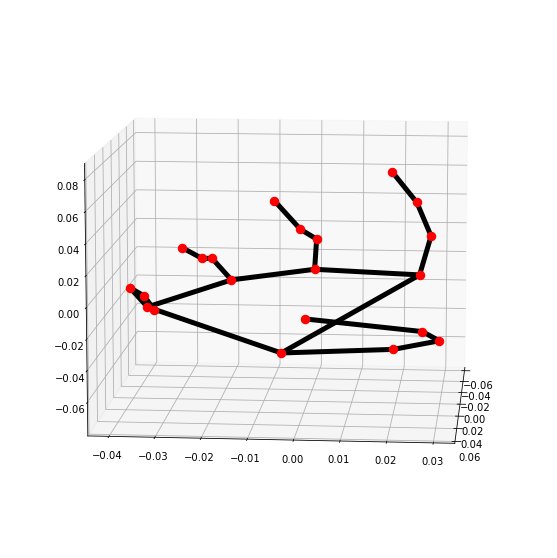

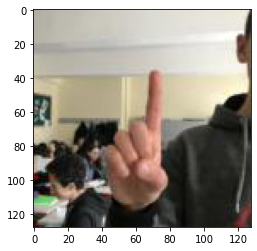



Image(2869/3801) from 5-MaviDikle-Data-21111.png is category 5 => [[4141, '5']]


Image(2870/3801) from please-MaviDikle-Data-131.png is category please => [[4142, 'please']]


Image(2871/3801) from 8-MaviDikle-Data-8000.png is category 8 => [[4143, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2872/3801) from 2-MaviDikle-Data-20103.png is category 2 => [[4144, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2873/3801) from 7-MaviDikle-Data-4161.png is category 7 => [[4145, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2874/3801) from whats up-MaviDikle-Data-1471.png is category whats up => [[4146, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2875/3801) from 4-MaviDikle-Data-17362.png is category 4 => [[4147, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2876/3801) from whats up-MaviDikle-Data-1317.png is category whats up => [[4148, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2877/3801) from bye-MaviDikle-Data-6864.png is category bye => [[4149, 'bye']]
**MEDIAPIPE DID NOT 

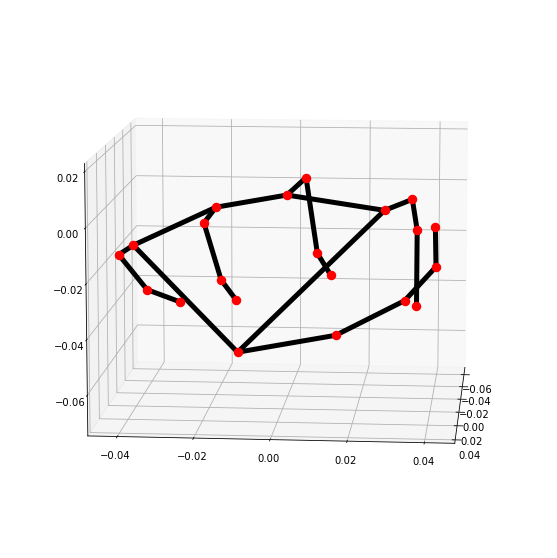

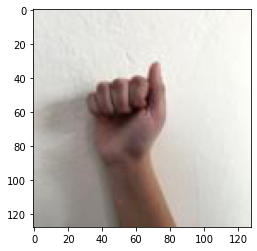



Image(2889/3801) from project-MaviDikle-Data-9735.png is category project => [[4161, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2890/3801) from b-MaviDikle-Data-19146.png is category b => [[4162, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2891/3801) from pardon-MaviDikle-Data-10518.png is category pardon => [[4163, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2892/3801) from bye-MaviDikle-Data-6870.png is category bye => [[4164, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2893/3801) from whats up-MaviDikle-Data-1303.png is category whats up => [[4165, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2894/3801) from 7-MaviDikle-Data-4613.png is category 7 => [[4166, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2895/3801) from please-MaviDikle-Data-643.png is category please => [[4167, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2896/3801) from 8-MaviDikle-Data-7441.png is category 8 => [[4168, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2897/3801) from litt

**MEDIAPIPE DID NOT READ IMAGE**
Image(2960/3801) from little bit-MaviDikle-Data-12202.png is category little bit => [[4232, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2961/3801) from b-MaviDikle-Data-19191.png is category b => [[4233, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2962/3801) from 6-MaviDikle-Data-5239.png is category 6 => [[4234, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2963/3801) from a-MaviDikle-Data-8450.png is category a => [[4235, 'a']]


Image(2964/3801) from no-MaviDikle-Data-2076.png is category no => [[4236, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2965/3801) from 3-MaviDikle-Data-17913.png is category 3 => [[4237, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2966/3801) from 9-MaviDikle-Data-3113.png is category 9 => [[4238, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2967/3801) from please-MaviDikle-Data-694.png is category please => [[4239, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(2968/3801) from 4-MaviDikle-Data-16901.png is cat

**MEDIAPIPE DID NOT READ IMAGE**
Image(3034/3801) from 5-MaviDikle-Data-21475.png is category 5 => [[4306, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3035/3801) from 8-MaviDikle-Data-7657.png is category 8 => [[4307, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3036/3801) from c-MaviDikle-Data-22407.png is category c => [[4308, 'c']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3037/3801) from 2-MaviDikle-Data-20467.png is category 2 => [[4309, '2']]


Image(3038/3801) from 7-MaviDikle-Data-4405.png is category 7 => [[4310, '7']]


Image(3039/3801) from please-MaviDikle-Data-455.png is category please => [[4311, 'please']]


Image(3040/3801) from whats up-MaviDikle-Data-1115.png is category whats up => [[4312, 'whats up']]


Image(3041/3801) from 9-MaviDikle-Data-2972.png is category 9 => [[4313, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3042/3801) from 4-MaviDikle-Data-17160.png is category 4 => [[4314, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3043/3801) from 2-MaviDikle-Data-20301

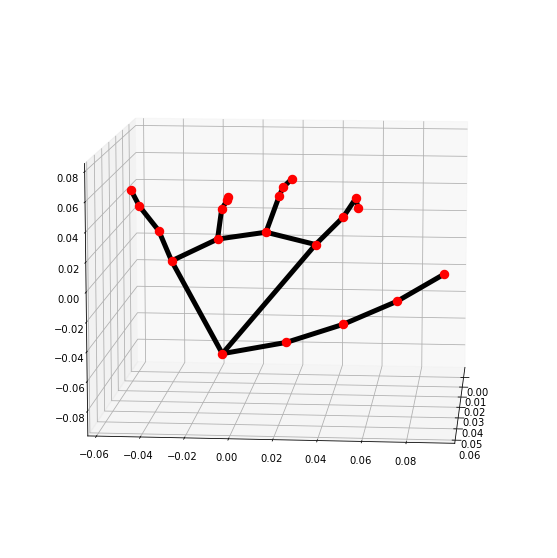

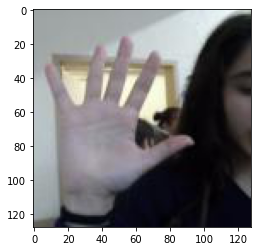



Image(3049/3801) from 1-MaviDikle-Data-6341.png is category 1 => [[4321, '1']]


Image(3050/3801) from e-MaviDikle-Data-18424.png is category e => [[4322, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3051/3801) from good morning-MaviDikle-Data-14590.png is category good morning => [[4323, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3052/3801) from project-MaviDikle-Data-9245.png is category project => [[4324, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3053/3801) from b-MaviDikle-Data-19436.png is category b => [[4325, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3054/3801) from pardon-MaviDikle-Data-10068.png is category pardon => [[4326, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3055/3801) from hello-MaviDikle-Data-12597.png is category hello => [[4327, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3056/3801) from 1-MaviDikle-Data-6355.png is category 1 => [[4328, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3057/3801) from e-MaviDikle-Data-18430.png i

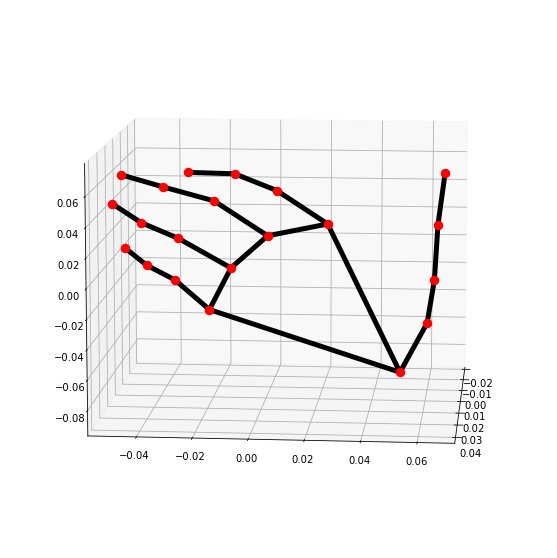

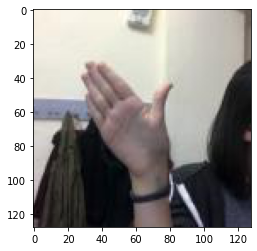



Image(3089/3801) from 3-MaviDikle-Data-17536.png is category 3 => [[4361, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3090/3801) from whats up-MaviDikle-Data-1129.png is category whats up => [[4362, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3091/3801) from 5-MaviDikle-Data-20757.png is category 5 => [[4363, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3092/3801) from 0-MaviDikle-Data-3280.png is category 0 => [[4364, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3093/3801) from d-MaviDikle-Data-16492.png is category d => [[4365, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3094/3801) from a-MaviDikle-Data-8875.png is category a => [[4366, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3095/3801) from no-MaviDikle-Data-1782.png is category no => [[4367, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3096/3801) from e-MaviDikle-Data-18418.png is category e => [[4368, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3097/3801) from project-MaviDikle-Data-9279.png is category project 

**MEDIAPIPE DID NOT READ IMAGE**
Image(3162/3801) from hello-MaviDikle-Data-12540.png is category hello => [[4434, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3163/3801) from 1-MaviDikle-Data-6396.png is category 1 => [[4435, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3164/3801) from good morning-MaviDikle-Data-14547.png is category good morning => [[4436, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3165/3801) from project-MaviDikle-Data-9292.png is category project => [[4437, 'project']]


Image(3166/3801) from no-MaviDikle-Data-1769.png is category no => [[4438, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3167/3801) from 3-MaviDikle-Data-22566.png is category 3 => [[4439, '3']]


Image(3168/3801) from good morning-MaviDikle-Data-14221.png is category good morning => [[4440, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3169/3801) from a-MaviDikle-Data-8646.png is category a => [[4441, 'a']]


Image(3170/3801) from hello-MaviDikle-Data-13138.png is categ

**MEDIAPIPE DID NOT READ IMAGE**
Image(3236/3801) from 7-MaviDikle-Data-4217.png is category 7 => [[4508, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3237/3801) from 2-MaviDikle-Data-20275.png is category 2 => [[4509, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3238/3801) from 4-MaviDikle-Data-17014.png is category 4 => [[4510, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3239/3801) from 9-MaviDikle-Data-2806.png is category 9 => [[4511, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3240/3801) from good-MaviDikle-Data-11387.png is category good => [[4512, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3241/3801) from b-MaviDikle-Data-19542.png is category b => [[4513, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3242/3801) from yes-MaviDikle-Data-13879.png is category yes => [[4514, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3243/3801) from project-MaviDikle-Data-9331.png is category project => [[4515, 'project']]


Image(3244/3801) from 1-MaviDikle-Data-6235.png is category 1 =>

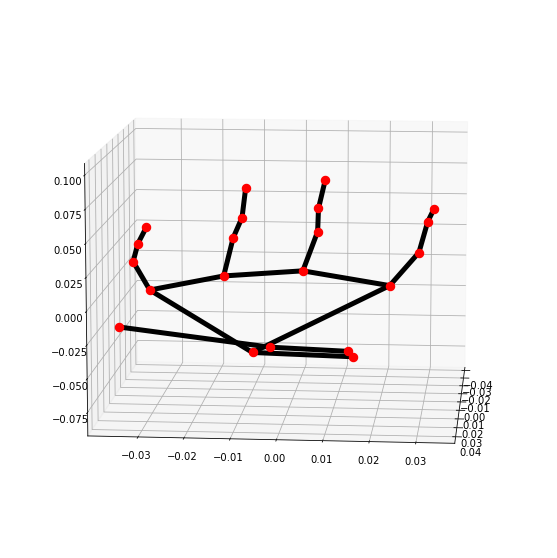

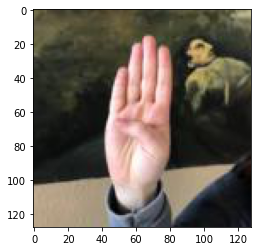



Image(3249/3801) from project-MaviDikle-Data-9325.png is category project => [[4521, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3250/3801) from 1-MaviDikle-Data-6221.png is category 1 => [[4522, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3251/3801) from e-MaviDikle-Data-18544.png is category e => [[4523, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3252/3801) from 5-MaviDikle-Data-21273.png is category 5 => [[4524, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3253/3801) from 1-MaviDikle-Data-5728.png is category 1 => [[4525, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3254/3801) from d-MaviDikle-Data-15979.png is category d => [[4526, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3255/3801) from pardon-MaviDikle-Data-9782.png is category pardon => [[4527, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3256/3801) from 2-MaviDikle-Data-20261.png is category 2 => [[4528, '2']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3257/3801) from 7-MaviDikle-Data-4203.png is category 7 => 

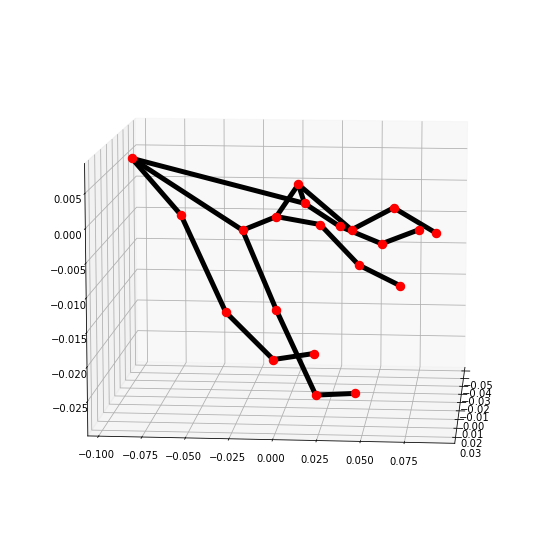

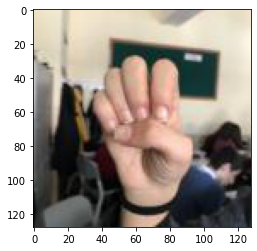



Image(3269/3801) from good morning-MaviDikle-Data-14396.png is category good morning => [[4541, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3270/3801) from project-MaviDikle-Data-9443.png is category project => [[4542, 'project']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3271/3801) from good-MaviDikle-Data-10933.png is category good => [[4543, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3272/3801) from b-MaviDikle-Data-19230.png is category b => [[4544, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3273/3801) from a-MaviDikle-Data-8929.png is category a => [[4545, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3274/3801) from hello-MaviDikle-Data-22252.png is category hello => [[4546, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3275/3801) from no-MaviDikle-Data-1806.png is category no => [[4547, 'no']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3276/3801) from 3-MaviDikle-Data-17442.png is category 3 => [[4548, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3277/3801) from 

**MEDIAPIPE DID NOT READ IMAGE**
Image(3342/3801) from good morning-MaviDikle-Data-14433.png is category good morning => [[4614, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3343/3801) from e-MaviDikle-Data-18587.png is category e => [[4615, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3344/3801) from yes-MaviDikle-Data-13676.png is category yes => [[4616, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3345/3801) from good-MaviDikle-Data-11350.png is category good => [[4617, 'good']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3346/3801) from 0-MaviDikle-Data-3479.png is category 0 => [[4618, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3347/3801) from b-MaviDikle-Data-19595.png is category b => [[4619, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3348/3801) from yes-MaviDikle-Data-14119.png is category yes => [[4620, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3349/3801) from hello-MaviDikle-Data-22291.png is category hello => [[4621, 'hello']]


Image(3350/3801) from little 

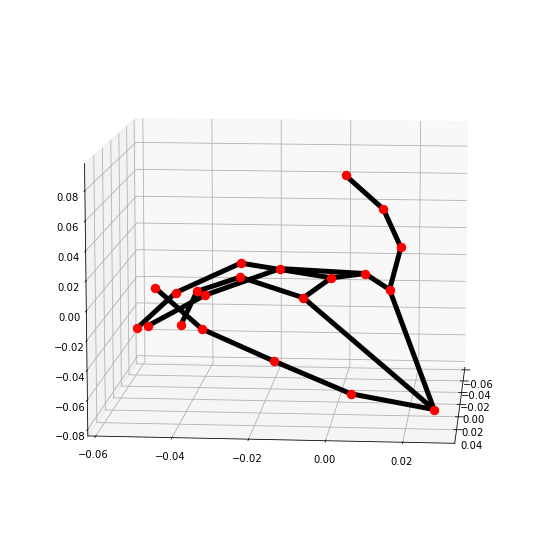

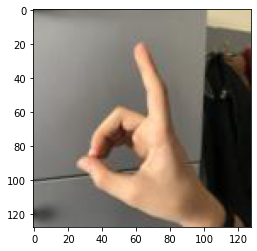



Image(3409/3801) from 0-MaviDikle-Data-3323.png is category 0 => [[4681, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3410/3801) from hello-MaviDikle-Data-13070.png is category hello => [[4682, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3411/3801) from 6-MaviDikle-Data-5167.png is category 6 => [[4683, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3412/3801) from good morning-MaviDikle-Data-14369.png is category good morning => [[4684, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3413/3801) from e-MaviDikle-Data-18752.png is category e => [[4685, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3414/3801) from 1-MaviDikle-Data-6037.png is category 1 => [[4686, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3415/3801) from a-MaviDikle-Data-8281.png is category a => [[4687, 'a']]


Image(3416/3801) from 0-MaviDikle-Data-3874.png is category 0 => [[4688, '0']]


Image(3417/3801) from hello-MaviDikle-Data-12839.png is category hello => [[4689, 'hello']]
**MEDIAPIPE DID NOT READ

**MEDIAPIPE DID NOT READ IMAGE**
Image(3478/3801) from 3-MaviDikle-Data-17640.png is category 3 => [[4750, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3479/3801) from 9-MaviDikle-Data-3098.png is category 9 => [[4751, '9']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3480/3801) from 4-MaviDikle-Data-16646.png is category 4 => [[4752, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3481/3801) from 8-MaviDikle-Data-7509.png is category 8 => [[4753, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3482/3801) from 3-MaviDikle-Data-17654.png is category 3 => [[4754, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3483/3801) from d-MaviDikle-Data-22455.png is category d => [[4755, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3484/3801) from bye-MaviDikle-Data-6938.png is category bye => [[4756, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3485/3801) from pardon-MaviDikle-Data-10450.png is category pardon => [[4757, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3486/3801) from 6-MaviDikle-Data-4906.p



Image(3550/3801) from 4-MaviDikle-Data-22534.png is category 4 => [[4822, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3551/3801) from a-MaviDikle-Data-8518.png is category a => [[4823, 'a']]


Image(3552/3801) from 6-MaviDikle-Data-5371.png is category 6 => [[4824, '6']]


Image(3553/3801) from hello-MaviDikle-Data-13266.png is category hello => [[4825, 'hello']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3554/3801) from pardon-MaviDikle-Data-10487.png is category pardon => [[4826, 'pardon']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3555/3801) from please-MaviDikle-Data-88.png is category please => [[4827, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3556/3801) from 6-MaviDikle-Data-5365.png is category 6 => [[4828, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3557/3801) from 4-MaviDikle-Data-22520.png is category 4 => [[4829, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3558/3801) from hello-MaviDikle-Data-13272.png is category hello => [[4830, 'hello']]
**MEDIAPIPE DID NOT READ IMA

**MEDIAPIPE DID NOT READ IMAGE**
Image(3623/3801) from 3-MaviDikle-Data-17872.png is category 3 => [[4895, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3624/3801) from 4-MaviDikle-Data-16860.png is category 4 => [[4896, '4']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3625/3801) from 9-MaviDikle-Data-3072.png is category 9 => [[4897, '9']]


Image(3626/3801) from b-MaviDikle-Data-22700.png is category b => [[4898, 'b']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3627/3801) from 1-MaviDikle-Data-21878.png is category 1 => [[4899, '1']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3628/3801) from good morning-MaviDikle-Data-14630.png is category good morning => [[4900, 'good morning']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3629/3801) from a-MaviDikle-Data-8257.png is category a => [[4901, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3630/3801) from e-MaviDikle-Data-18784.png is category e => [[4902, 'e']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3631/3801) from good-MaviDikle-Data-11153.png is category

**MEDIAPIPE DID NOT READ IMAGE**
Image(3695/3801) from d-MaviDikle-Data-22468.png is category d => [[4967, 'd']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3696/3801) from bye-MaviDikle-Data-6905.png is category bye => [[4968, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3697/3801) from whats up-MaviDikle-Data-1276.png is category whats up => [[4969, 'whats up']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3698/3801) from 8-MaviDikle-Data-7534.png is category 8 => [[4970, '8']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3699/3801) from 3-MaviDikle-Data-17669.png is category 3 => [[4971, '3']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3700/3801) from please-MaviDikle-Data-736.png is category please => [[4972, 'please']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3701/3801) from 7-MaviDikle-Data-4766.png is category 7 => [[4973, '7']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3702/3801) from little bit-MaviDikle-Data-11871.png is category little bit => [[4974, 'little bit']]
**MEDIAPIPE DID NOT READ IMAGE**


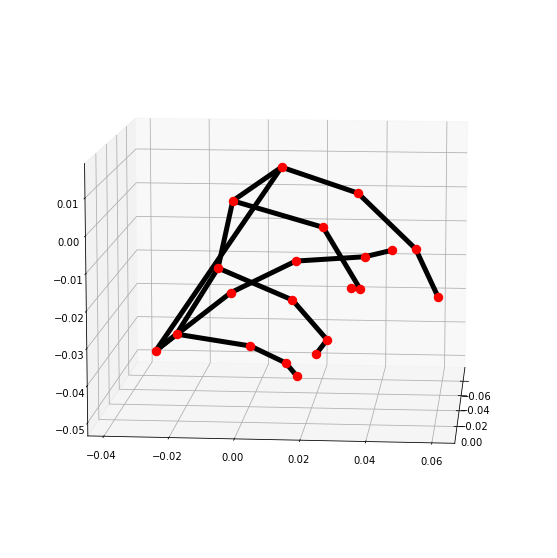

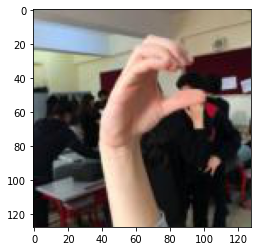



Image(3749/3801) from bye-MaviDikle-Data-7158.png is category bye => [[5021, 'bye']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3750/3801) from a-MaviDikle-Data-22021.png is category a => [[5022, 'a']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3751/3801) from yes-MaviDikle-Data-14124.png is category yes => [[5023, 'yes']]


Image(3752/3801) from d-MaviDikle-Data-16256.png is category d => [[5024, 'd']]


Image(3753/3801) from 0-MaviDikle-Data-3444.png is category 0 => [[5025, '0']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3754/3801) from 6-MaviDikle-Data-5600.png is category 6 => [[5026, '6']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3755/3801) from 5-MaviDikle-Data-22784.png is category 5 => [[5027, '5']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3756/3801) from yes-MaviDikle-Data-13893.png is category yes => [[5028, 'yes']]
**MEDIAPIPE DID NOT READ IMAGE**
Image(3757/3801) from good morning-MaviDikle-Data-14368.png is category good morning => [[5029, 'good morning']]
**MEDIAPIPE DID NOT READ IMA

In [18]:
print("Calculating Landmarks For Testing Images...\n")
training_image_refrence = {}  # save a refrence to which data goes to what image
results = np.ones((1, num_features+2))
# counter = counter_after_test_processing
not_read = dict([[temp_target, 0] for temp_target in letters]) # record of what kind of images we couldn't read

for img in train_images:
    image_name = str(img[img.rfind('/')+1:])
    letter = image_name[:image_name.find('-')]  # training_y[counter-counter_after_test_processing][0]
    counter += 1
    add_y = [[counter, letter]]  # index, target
    print("Image(" +str(counter-counter_after_test_processing)+"/"+str(len(train_images))+") from", image_name, "is category", letter, "=>", add_y)
    
    show_im = (counter%20 == 0)  # reduces number of images shown in log to save space for github
    temp_ret = run_mediapipe([img], show_im, False, 1)
    if len(temp_ret) == 0:
        print("**MEDIAPIPE DID NOT READ IMAGE**")
        not_read[letter] += 1
    else:
        if show_im:
            plt.imshow(cv2.imread(img))  # show actual image on import
            plt.show()
        
        ret = temp_ret[0].multi_hand_landmarks[0]  # get hand skeleton data

        # translate landmark values to feature matrix format
        assert len(ret.landmark)*3 == num_features   # just checking my analysis of features is correct so we dont miss any data
    #         print("Landmark:\n", ret.landmark)
        add_row = np.ones((1, num_features))
        for j in range(0, num_features):
            if j%3 == 0:
                add_row[0, j] = ret.landmark[j//3].x
            elif j%3 == 1:
                add_row[0, j] = ret.landmark[j//3].y
            else:
                add_row[0, j] = ret.landmark[j//3].z
        add_row = np.hstack((add_y, add_row))  # concat target with features
#         print("Example Landmark Extraction:\n", add_row[0])
        results = np.vstack((results, add_row))  # append results

        # (key) index counter --> (value) image name/data
        training_image_refrence[counter] = train_image_dir + image_name # [image_name, cv2.imread(img)]
        print('\n')

# clean results
training_dataset = np.delete(results, (0), axis=0)  # delete the initial row of ones
print("Completed with Results:", results.shape, "& training dataset:", training_dataset.shape)

In [19]:
print("Chunk", chunk_num, ":: Total # Images Added to Testing Set =", training_dataset.shape[0], "out of", len(train_images))
metadata_dir = cwd+"/results/hand_metadata/confidence-" + str(conf_level) + "/chunk"+str(chunk_num)

not_read = dict(sorted(not_read.items(), key=lambda item: -item[1]))  # sort for convenience
print("\nDistribution of Images Not Read:", not_read)
print("Distribution of Images that Were Read:", get_dist(training_dataset, 1))
print()

# save data on what images were recongized vs not
np.save(metadata_dir+"-training-notread", not_read)
print("**saved distribution of read vs. not read images by medipipe to ", metadata_dir)

Chunk 0 :: Total # Images Added to Testing Set = 478 out of 3801

Distribution of Images Not Read: {'c': 161, 'd': 159, 'good morning': 159, 'b': 149, 'hello': 147, '3': 142, 'yes': 140, 'pardon': 136, '1': 130, '4': 130, '6': 129, 'e': 129, 'please': 128, '0': 125, '8': 122, '9': 121, 'a': 118, '2': 113, 'project': 112, '7': 110, 'good': 109, 'little bit': 108, '5': 107, 'no': 102, 'whats up': 96, 'bye': 95, 'NULL': 46}
Distribution of Images that Were Read: {'good': 50, 'project': 47, '5': 35, 'a': 31, 'bye': 24, 'e': 23, '0': 22, 'hello': 20, '3': 18, 'd': 18, '4': 17, '1': 15, '9': 15, 'b': 15, 'c': 15, 'pardon': 15, 'whats up': 13, 'no': 12, '6': 11, '8': 10, 'little bit': 10, 'good morning': 9, 'please': 9, '7': 8, 'yes': 8, '2': 7, 'NULL': 1}

**saved distribution of read vs. not read images by medipipe to  /Users/korahughes/Documents/GitHub/SignToSpeech/results/hand_metadata/confidence-0.25/chunk0


In [20]:
chunk_name = "-chunk" + str(chunk_num)
np.save(save_train_results+chunk_name, training_dataset)
print("**saved processed training data to", save_train_results+chunk_name)
np.save(save_train_image_key+chunk_name, training_image_refrence)
print("**saved training data image refrence to", save_train_image_key+chunk_name)

**saved processed training data to /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_train_data/processed_train_data-chunk0
**saved training data image refrence to /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_train_data/processed_train_data_to_image-chunk0


In [13]:
# load & stack processed chunks of training data
training_data_dirs = [save_train+file for file in os.listdir(save_train) if "processed_train_data-chunk" in file]
chunk_composite = np.ones((1, num_features+2))
for train_dir in training_data_dirs:
    data_to_add = np.load(train_dir)
    chunk_composite = np.vstack((chunk_composite, data_to_add))
    print("Data Added from", train_dir, "with", data_to_add.shape, " shape:\n", data_to_add)
training_dataset = np.delete(chunk_composite, (0), axis=0)  # take dummy row from data
print("\n# Data Aggregated from chunks:", training_dataset.shape[0])

Data Added from /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_train_data/processed_train_data-chunk4.npy with (455, 65)  shape:
 [['414' '5' '0.46483519673347473' ... '0.172580748796463'
  '0.3822636008262634' '-0.17991304397583008']
 ['422' 'project' '0.7028158903121948' ... '0.23442310094833374'
  '0.7714716196060181' '-0.09971960633993149']
 ['429' '0' '0.38542652130126953' ... '0.4748164415359497'
  '0.42002254724502563' '-0.017270896583795547']
 ...
 ['4177' 'd' '0.5091308355331421' ... '0.4910763204097748'
  '0.12262842804193497' '0.015076232142746449']
 ['4183' '7' '0.0857696533203125' ... '0.23364713788032532'
  '0.5338901281356812' '-0.006599570158869028']
 ['4196' 'project' '0.825913667678833' ... '0.2333950698375702'
  '0.684455156326294' '-0.09571889787912369']]
Data Added from /Users/korahughes/Documents/GitHub/SignToSpeech/results/processed_train_data/processed_train_data-chunk5.npy with (517, 65)  shape:
 [['413' '2' '0.4188411831855774' ... '0.347632

In [14]:
# load & stack processed chunks of training data's refrences to images
training_data_ref_dirs = [save_train+file for file in os.listdir(save_train) 
                          if "processed_train_data_to_image-" in file]
images_ref = {}
for train_ref_dir in training_data_ref_dirs:
    dict_to_add = np.load(train_ref_dir, allow_pickle=True).item()
    images_ref.update(dict_to_add)
# print("Images Refrence:", images_ref)

# composite dictionary[index_from_keypoint_data] = directory_of_actual_image
images_ref.update(testing_image_refrence) # add homebrew image refrence to the total
min_im = min(images_ref.keys())
max_im = max(images_ref.keys())
print("Image refrences cover", min_im, "to", max_im)

Image refrences cover 1 to 5069



Example Dataset Entry: ['1210' '3' '0.48045670986175537' '0.7624378800392151'
 '9.720785101308138e-07' '0.5807864665985107' '0.6555123329162598'
 '-0.03735955432057381' '0.6445004940032959' '0.517646074295044'
 '-0.047564879059791565' '0.7030068635940552' '0.4158414602279663'
 '-0.06404998153448105' '0.7531011700630188' '0.35615256428718567'
 '-0.08092328906059265' '0.4899168312549591' '0.4066920578479767'
 '-0.006550502497702837' '0.4948459565639496' '0.27217036485671997'
 '-0.041357964277267456' '0.49197137355804443' '0.19400613009929657'
 '-0.06654568016529083' '0.48240092396736145' '0.12616413831710815'
 '-0.08291266113519669' '0.40473073720932007' '0.4236726462841034'
 '-0.0199520792812109' '0.3502223491668701' '0.26908430457115173'
 '-0.06545799225568771' '0.3165406286716461' '0.17971494793891907'
 '-0.09335339814424515' '0.2821193337440491' '0.10626819729804993'
 '-0.10486461967229843' '0.3393568694591522' '0.4788062572479248'
 '-0.03957048058509827' '0.2835692763328552' '0.368

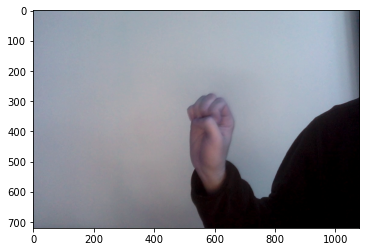

In [15]:
# test that image can still be derived from loaded data
from random import random
rand_image = int(random()*max_im) + min_im

if rand_image < counter_after_test_processing:
    temp_images = testing_dataset
else:
    temp_images = training_dataset
    rand_image -= counter_after_test_processing

print("\nExample Dataset Entry:", temp_images[rand_image])
temp_ref = images_ref[int(temp_images[rand_image][0])]  # Note: must case to int
print("Corresponding Image Name:", cwd+temp_ref)
plt.imshow(cv2.imread(cwd+temp_ref))  # show actual image on import
plt.show()


In [16]:
# TODO: load all metadata for current confidence level & show distribution of read vs. not read hands

print("Kaggel Data:\n", get_dist(training_dataset, 1))
print("Homebrew Data:\n", get_dist(testing_dataset, 1))

Kaggel Data:
 {'good': 268, 'project': 246, '5': 237, 'a': 181, 'bye': 166, '0': 132, 'whats up': 122, 'b': 110, 'e': 110, '9': 109, 'hello': 107, '3': 106, 'good morning': 100, '1': 93, '4': 88, 'c': 86, 'please': 85, 'no': 80, 'pardon': 80, 'little bit': 63, 'd': 62, '2': 56, '6': 55, '7': 53, 'yes': 49, '8': 48, 'NULL': 2}
Homebrew Data:
 {'b': 187, 'a': 182, '4': 86, '3': 76, 'c': 75, '8': 72, '9': 72, '2': 69, '5': 69, '7': 67, 'e': 67, '0': 66, '6': 64, '1': 60, 'd': 57, 'bye': 0, 'good': 0, 'good morning': 0, 'hello': 0, 'little bit': 0, 'no': 0, 'pardon': 0, 'please': 0, 'project': 0, 'whats up': 0, 'yes': 0, 'NULL': 0}


In [17]:
# delete index row for training
training_dataset = np.delete(training_dataset, (0), axis=1)
print(training_dataset)

[['5' '0.46483519673347473' '0.8584572076797485' ... '0.172580748796463'
  '0.3822636008262634' '-0.17991304397583008']
 ['project' '0.7028158903121948' '0.6411921977996826' ...
  '0.23442310094833374' '0.7714716196060181' '-0.09971960633993149']
 ['0' '0.38542652130126953' '0.6159404516220093' ... '0.4748164415359497'
  '0.42002254724502563' '-0.017270896583795547']
 ...
 ['project' '0.827033281326294' '0.6131060123443604' ...
  '0.3326241374015808' '0.643967866897583' '-0.06480514258146286']
 ['whats up' '0.4761280417442322' '0.7346334457397461' ...
  '0.30661413073539734' '0.24892805516719818' '-0.08135085552930832']
 ['project' '0.8161284923553467' '0.5799387097358704' ...
  '0.220038503408432' '0.6012241840362549' '-0.05777936056256294']]


## Transforming Processed Data

In [18]:
# TODO: test
# filter dataset for specific values
constrained_y = True
typical_constraints = {"letters_only": ['a', 'b', 'c', 'd', 'e'], 
                       "numbers_only": ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], 
                       "words_only": ['bye', 'good', 'good morning', 'hello', 'little bit',
                                      'no', 'pardon', 'please', 'project', 'whats up', 'yes'],
                       "not_na": letters[:-1]}  # TODO: maybe try encoding target by these subsets
""" Note: since we are coming from a learning perspective, we assume that our input sign is in our dataset
(therefore we dont need to train )"""
if constrained_y:
    acceptable_y_vals = typical_constraints["not_na"]  # hyperparam
    training_dataset = training_dataset[np.isin(training_dataset[:, 0],acceptable_y_vals)]
    print("NEW Distribution of target values in dataset:", get_dist(training_dataset), '\n')
#     for i in range(training_dataset.shape[0]):
#         if training_dataset[i][0] not in acceptable_y_vals:
#             training_dataset = np.delete(training_dataset, (i), axis=0)

# transform data into one-hot encoded
one_hot = False
if one_hot:
    y = np.ones(one_hot_target.shape)
    for i in range(training_dataset.shape[0]):
        y = np.vstack((y, hot_encode_y(training_dataset[i][0])))
    y = np.delete(y, (0), axis=0).reshape(-1,1)  # delete empty row
    X = np.delete(training_dataset, (1), axis=1)
else:
    # separate X & y
    y = training_dataset[:, 0].reshape(-1,1)
    X = training_dataset[:, 1:]

print("\nFeature Matrix X", X.shape, ':\n', X)
print("y:\n", y)  # transpose to be easier to read

# preprocessing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25) # 0.25 x 0.8 = 0.2
print("\n{ Train | Validation | Test =>", len(X_train), len(X_val), len(X_test), "}")

NEW Distribution of target values in dataset: {'good': 268, 'project': 246, '5': 237, 'a': 181, 'bye': 166, '0': 132, 'whats up': 122, 'b': 110, 'e': 110, '9': 109, 'hello': 107, '3': 106, 'good morning': 100, '1': 93, '4': 88, 'c': 86, 'please': 85, 'no': 80, 'pardon': 80, 'little bit': 63, 'd': 62, '2': 56, '6': 55, '7': 53, 'yes': 49, '8': 48, 'NULL': 0} 


Feature Matrix X (2892, 63) :
 [['0.46483519673347473' '0.8584572076797485' '8.370435011784139e-07' ...
  '0.172580748796463' '0.3822636008262634' '-0.17991304397583008']
 ['0.7028158903121948' '0.6411921977996826' '4.639007045170729e-07' ...
  '0.23442310094833374' '0.7714716196060181' '-0.09971960633993149']
 ['0.38542652130126953' '0.6159404516220093' '4.958922090736451e-07' ...
  '0.4748164415359497' '0.42002254724502563' '-0.017270896583795547']
 ...
 ['0.827033281326294' '0.6131060123443604' '7.06601952060737e-07' ...
  '0.3326241374015808' '0.643967866897583' '-0.06480514258146286']
 ['0.4761280417442322' '0.73463344573974

In [19]:
# general eval imports
from sklearn.metrics import accuracy_score
from sklearn import metrics

# values for saving data
predicted_dir = cwd + "/results/predicted_matrix/"
trained_labels = np.hstack(([["predicted"]], np.delete(attribute_decoder, (0), axis=1))).tolist()[0]
print(trained_labels)

['predicted', 'target', 'WRIST.x', 'WRIST.y', 'WRIST.z', 'THUMB_CMC.x', 'THUMB_CMC.y', 'THUMB_CMC.z', 'THUMB_MCP.x', 'THUMB_MCP.y', 'THUMB_MCP.z', 'THUMB_IP.x', 'THUMB_IP.y', 'THUMB_IP.z', 'THUMB_TIP.x', 'THUMB_TIP.y', 'THUMB_TIP.z', 'INDEX_FINGER_MCP.x', 'INDEX_FINGER_MCP.y', 'INDEX_FINGER_MCP.z', 'INDEX_FINGER_PIP.x', 'INDEX_FINGER_PIP.y', 'INDEX_FINGER_PIP.z', 'INDEX_FINGER_DIP.x', 'INDEX_FINGER_DIP.y', 'INDEX_FINGER_DIP.z', 'INDEX_FINGER_TIP.x', 'INDEX_FINGER_TIP.y', 'INDEX_FINGER_TIP.z', 'MIDDLE_FINGER_MCP.x', 'MIDDLE_FINGER_MCP.y', 'MIDDLE_FINGER_MCP.z', 'MIDDLE_FINGER_PIP.x', 'MIDDLE_FINGER_PIP.y', 'MIDDLE_FINGER_PIP.z', 'MIDDLE_FINGER_DIP.x', 'MIDDLE_FINGER_DIP.y', 'MIDDLE_FINGER_DIP.z', 'MIDDLE_FINGER_TIP.x', 'MIDDLE_FINGER_TIP.y', 'MIDDLE_FINGER_TIP.z', 'RING_FINGER_MCP.x', 'RING_FINGER_MCP.y', 'RING_FINGER_MCP.z', 'RING_FINGER_PIP.x', 'RING_FINGER_PIP.y', 'RING_FINGER_PIP.z', 'RING_FINGER_DIP.x', 'RING_FINGER_DIP.y', 'RING_FINGER_DIP.z', 'RING_FINGER_TIP.x', 'RING_FINGER_TIP

# HOMEBREW TRAINING:

/var/folders/mv/k0krwyts3z5cfn3y2tltw0sc0000gn/T/ipykernel_12969/1748516315.py:21: RuntimeWarning: divide by zero encountered in log
  t2 = np.dot((1-y_tr.T), np.log(1-y_hat))



Training Results for 6 classes, 239  examples, and 0.005 alpha:


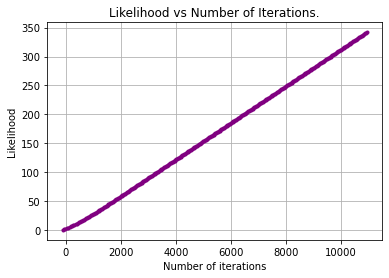


Training set with 239 items...
[TP, TN, FP, FN] = [597.0, 0, 37, 0]
Precision:  0.9416403785488959
Recall:  1.0
F1: 0.9699431356620635

Validating set with 80 items...
[TP, TN, FP, FN] = [213.0, 0, 12, 0]
Precision:  0.9466666666666667
Recall:  1.0
F1: 0.9726027397260273

Testing set with 80 items...
[TP, TN, FP, FN] = [193.0, 0, 17, 0]
Precision:  0.919047619047619
Recall:  1.0
F1: 0.9578163771712159



In [32]:
# Logistic Regression Implementation:
multiclass = True if phase_num > 1 else False

def sigmoid(z):
    result = 1/(1+np.exp(-z))
    return result

def hypothesis(X_train_1, w):
    y_hat = sigmoid(np.dot(X_train_1, w))
    return y_hat


def add_ridge(w, l=0.05, lasso=False):
    if lasso:
        return np.sum(np.absolute(w))*l
    return np.sum(np.square(w))*l

def likelihood(X_tr, y_tr, w, n, r=False):
    y_hat = hypothesis(X_tr, w)
    t1 = np.dot(y_tr.T, np.log(y_hat))
    t2 = np.dot((1-y_tr.T), np.log(1-y_hat))
    likelihood = np.sum(t1 + t2)
    if r:
        likelihood = likelihood - add_ridge(w, 0.05)
    return likelihood


data_div = 1 # num data pts skipped in between plotting pts
def Gradient_Ascent(X_train_1, y_2d_train, learning_rate, num_iters):
    N = len(X_train_1) # Number of training examples.
    likelihood_values = []
    w = np.zeros((X_train_1.shape[1],1))
    
    for i in range(num_iters):
        y_hat = hypothesis(X_train_1, w)
        error = y_2d_train - y_hat
        gradient = np.dot(X_train_1.T, error)  # - add_ridge(w, lambd2)
        w = w + (learning_rate/N)*gradient  # Updating Parameters
        if (i % data_div) == 0:
#             print("added ridge of", add_ridge(w, lambd2))
#             print("new w mean", np.mean(w))
            likelihood_values.append(likelihood(X_train_1,y_2d_train, w*1, N))
    return w, likelihood_values

# train weights for feature matrix
num_iters = 10000
learning_rate = 0.005

w, likelihood_values = Gradient_Ascent(X_train, y_train, learning_rate, num_iters)  # my implementation
# print("W_final:", w)

print("\nTraining Results for", str(phase_num+1), "classes,", len(X_train), " examples, and", learning_rate, "alpha:")
iters = np.array(range(0,num_iters,data_div))
plt.plot(likelihood_values,iters,'.-',color='purple')
plt.xlabel('Number of iterations')
plt.ylabel('Likelihood')
plt.title("Likelihood vs Number of Iterations.")
plt.grid()
plt.show(block=False)


# eval

# make_multiclass = np.vectorize(lambda )
make_binary = np.vectorize(lambda x, t: 1 if x > t else 0)  # helper
def precision_recall(y_hat, y, threshold, binarized=False):  
    # Before finding precision or recall, you have to convert y_hat into a vector of zeros and ones named y_hat_binary using threshold.
    # Values in y_hat > threshold should be equal to 1 and others should be 0.
    y_hat = np.copy(y_hat)
    # Convert values in y_hat_binary to binary values below
    if binarized:
        y_hat_binary = y_hat
    else:
        y_hat_binary = make_binary(y_hat, threshold)

    # Calculate false positive and false negative using false difference
    # HINT: false different can be calculated by subtracting hypothesis from actual value
    # HINT: if done correctly, false_pos should be 4 and false_neg should be 2
    false_difference = y_hat - y
    false_pos = np.sum(np.logical_and(y_hat_binary == 1, y == 0))
    false_neg = np.sum(np.logical_and(y_hat_binary == 0, y == 1))

    all_trues = np.ones((y.shape[0], 1)) 
    # Calculate true positive using all_trues and true difference
    # HINT: true different can be calculated by subtracting sum of hypothesis and actual value from all trues
    # HINT: if done correctly, true_pos should be 266
    true_difference = np.sum(y_hat_binary) - np.sum(y)
    true_pos = np.sum(np.multiply(y_hat_binary, y))  # only = 1 if both y_hat and y are 1
    true_neg = np.sum(np.logical_and(y_hat_binary == 0, y == 0))

    if binarized:
        is_eq = np.vectorize(lambda a,b: 1 if a==b else 0)
        is_not_eq = np.vectorize(lambda a,b: 0 if a==b else 1)
        true_pos = np.sum(is_eq(y_hat_binary, y))
        true_neg = np.sum(is_eq(y_hat_binary, y))
        false_pos = np.sum(is_not_eq(y_hat_binary, y))
        false_neg = np.sum(is_not_eq(y_hat_binary, y))
#         print(false_difference)
    print("[TP, TN, FP, FN] =", [true_pos, true_neg, false_pos, false_neg])
    precision = true_pos/(true_pos+false_pos)
    recall = true_pos/(true_pos+false_neg)
    return precision, recall

def f_score(precision, recall):
    score = (2*precision*recall)/(precision+recall)
    return score

def predict(X_train_1, w):
    y_hat = hypothesis(X_train_1, w)
    return y_hat

print()
validations = {"Training":[X_train, y_train], "Validating":[X_val,y_val], "Testing": [X_test,y_test]}
for key, value in validations.items():
    print(key, "set with", len(value[0]), "items...")
    y_hat = predict(value[0], w)  # predict(X_train, w)
    precision, recall = precision_recall(y_hat, value[1], 0.5)
    
    print('Precision: ', precision)
    print('Recall: ', recall)
    fsc = f_score(precision, recall)
    print("F1:", fsc)
    print()
# TODO: find the top 10 most significant measurements according to the weights and translate them to the mp_hands.HandLandmark

In [34]:
# SVM Implementation
def one_vs_rest_encoding(y, digit = '0'):

    # Let y_encoded be an numpy array of encoded digits, with 1 for the digit we want to predict, and -1 for the rest
    # This may take several lines of code, but please store your final encoding in y_encoded
    onevrest = np.vectorize(lambda x: 1 if x == digit else -1)
    return  onevrest(y)

curr_class = [value for key, value in classes.items() if value <= phase_num]   # {"A":0, "B":1, "K":2, "H":3, "Y":4, "W":5}
y_train_vs_rest = [one_vs_rest_encoding(y_train, num) for num in curr_class]
y_val_vs_rest =  [one_vs_rest_encoding(y_val, num) for num in curr_class]
# print("Vs Rest Training:", y_train_vs_rest)


def score(X, w):
    # To do
    return np.dot(X, w)

def svm_objective(w, X, y, lambda1=.1):
    # To do. This part may require several lines of code. 
    # Store your answer in result.
    result = (lambda1/2)*np.sum(np.square(w)) + np.sum(np.maximum(0, (1 - np.multiply(y, np.dot(X, w)))))
    return result


# stochastic sub-gradient descent
def pegasos(X_train, y_train, lambda1=0.08, num_iters = 3, threshold=1):
    # Hyperparameters: threshold, lambda1
    N = X_train.shape[0]
    d = X_train.shape[1]
    t = 0
    # Initial weight vector
    w = np.ones((d,))

    for iter in range(num_iters):
#         print('Iteration %d. J: %.6f' % (iter, svm_objective(w, X_train, y_train)))
        for i in range(N):
            t = t + 1
            # Complete the following code to find w. This will require several lines of code. 
            alpha = 1/(lambda1*t)
            if (y_train[i] * (X_train[i].dot(w)) >= threshold):
                w = w - alpha * (lambda1*w)
            else:
                w = w - alpha * ((lambda1*w) - y_train[i]*(X_train[i].T))
    return w


# Create the 10 classifiers
labels = "0123456789"
w_vals= {}
val_scores = {}
for i in range(len(labels)):
    # Note that each section may require more than one line of code.
    
    # Perform one-vs-rest for labels[i]
    # To do: Relabel the y labels in the train set to either 1 or -1 using one_vs_rest_encoding
    y_encoded = one_vs_rest_encoding(y_train, labels[i]) 
    # To do: Use the Pegasos algorithm on X_train and y_encoded to get the weight vector
    w_vals[i] = pegasos(X_train, y_encoded, 0.001, 3, 1) 
    
    # Estimate accuracy for one-vs-rest classifier for labels[i]
    # To do:  Relabel the y labels in the validation set to either 1 or -1 using one_vs_rest_encoding
    y_encoded_val = one_vs_rest_encoding(y_val, labels[i]) 
    # To do: Accuracy Estimation for one-vs-rest classifier for labels[i]
    y_hat = np.where(score(X_val, w_vals[i]) > 0, 1, -1)
    encode = np.vectorize(lambda a,b: 1 if a==b else 0)
    val_scores[i] = encode(y_encoded_val, y_hat)
encoded_vals = val_scores
val_scores = [np.sum(val_scores[i])/len(val_scores[i]) for i in range(len(val_scores))]

# To do: Predict the label for each example in the validation set 
# We will let eval be a numpy array of length N, where N is the number of examples in the validation set. 
# eval1 will hold either a 1 or a 0, depending if the handwritten digit was predicted correctly or not.
eval1 = np.zeros(len(X_val))

# To do: Loop through each sample in the validation set and assign it a label based on the highest score. 
# Store either a 1 if the number was predicted correctly, or a 0 if the number was predicted incorrectly.
# for val in val_score:
#     score = svm_objective(w, X_train, y_train)
for i in range(len(X_val)):
    scores = []
    for j in range(len(labels)):
        scores.append(np.dot(w_vals[j], X_val[i]))
    k = np.argmax(scores)
    if int(y_val[i]) == k:
        eval1[i] += 1

# eval

validations = {"Training":[X_train, y_train], "Validating":[X_val,y_val], "Testing": [X_test,y_test]}
for key, value in validations.items():
    print(key, "set with", len(value[0]), "items...")
    
    y_hat = predict(value[0], w)  # predict(X_train, w)
    precision, recall = precision_recall(y_hat, value[1], 0.5)
    
    print('Precision: ', precision)
    print('Recall: ', recall)
    fsc = f_score(precision, recall)
    print("F1:", fsc)
    print()



Training set with 239 items...
[TP, TN, FP, FN] = [597.0, 0, 37, 0]
Precision:  0.9416403785488959
Recall:  1.0
F1: 0.9699431356620635

Validating set with 80 items...
[TP, TN, FP, FN] = [213.0, 0, 12, 0]
Precision:  0.9466666666666667
Recall:  1.0
F1: 0.9726027397260273

Testing set with 80 items...
[TP, TN, FP, FN] = [193.0, 0, 17, 0]
Precision:  0.919047619047619
Recall:  1.0
F1: 0.9578163771712159



In [39]:
# Neural Network Implementation

# Activations:
def f(z, alpha=0.25, activation='relu'):
    if activation == 'sigmoid':
        sigmoid = 1 / (1 + np.exp(-z))
    elif activation == 'relu':
        relu = np.vectorize(lambda x: max(0, x))(z)
    elif activation == 'tanh':
        tanh = np.vectorize(lambda x: ((np.exp(x)-np.exp(-1*x))/(np.exp(x)+np.exp(-1*x))))(z)
    elif activation == 'elu':
        elu = np.vectorize(lambda x: max(alpha*np.exp(x), x))(z)
    else:
        print("activation function", activation, "count not be found...")
        assert False
#     print("sigmoid v. Reli v. Tanh v. Elu:", sigmoid, relu, tanh, elu)
    return np.vectorize(lambda x: max(0, x))(z)

def f_deriv(z, activation='relu'):
    if activation == 'sigmoid':
        sigmoid = f(z) * (1 - f(z))
    elif activation == 'relu':
        relu = np.vectorize(lambda x: 0 if x < 1 else 1)(z)
    elif activation == 'tanh':
        tanh = np.vectorize(lambda x: (1-f(x)*f(x)))(z)
    elif activation == 'elu':
        elu = np.vectorize(lambda x: (1 if f(x)==x else f(x)))(z)
    else:
        print("activation function", activation, "count not be found...")
        assert False
#     print("sigmoid v. Reli v. Tanh v. Elu:", sigmoid, relu, tanh, elu)
    return np.vectorize(lambda x: 0 if x < 1 else 1)(z)


# Setup Steps
def setup_and_init_weights(nn_structure):
    W = {} #creating a dictionary i.e. a set of key: value pairs
    b = {}
    for l in range(1, len(nn_structure)):
        W[l] = np.random.random_sample((nn_structure[l], nn_structure[l-1])) #Return “continuous uniform” random floats in the half-open interval [0.0, 1.0). 
        b[l] = np.random.random_sample((nn_structure[l],))
    return W, b

def init_tri_values(nn_structure):
    tri_W = {}
    tri_b = {}
    for l in range(1, len(nn_structure)):
        tri_W[l] = np.zeros((nn_structure[l], nn_structure[l-1]))
        tri_b[l] = np.zeros((nn_structure[l],))
    return tri_W, tri_b


# Calculation Steps
def feed_forward(x, W, b):
    a = {1: x} # create a dictionary for holding the a values for all levels
    z = { } # create a dictionary for holding the z values for all the layers
    for l in range(1, len(W) + 1): # for each layer
        node_in = a[l]
        z[l+1] = W[l].dot(node_in) + b[l]  # z^(l+1) = W^(l)*a^(l) + b^(l)
        a[l+1] = f(z[l+1]) # a^(l+1) = f(z^(l+1))
    return a, z

# Computations:
def calculate_out_layer_delta(y, a_out, z_out):
    # delta^(nl) = -(y_i - a_i^(nl)) * f'(z_i^(nl))
    return -(y-a_out) * f_deriv(z_out) 


def calculate_hidden_delta(delta_plus_1, w_l, z_l):
    # delta^(l) = (transpose(W^(l)) * delta^(l+1)) * f'(z^(l))
    return np.dot(np.transpose(w_l), delta_plus_1) * f_deriv(z_l)


def train_nn(nn_structure, X, y, iter_num=3000, alpha=0.25, regularized=0):
    W, b = setup_and_init_weights(nn_structure)
    cnt = 0
    N = len(y)
    avg_cost_func = []
    print('Starting gradient descent for {} iterations'.format(iter_num))
    while cnt < iter_num:
        if cnt%100 == 0:
            print('Iteration {} of {}'.format(cnt, iter_num))
        tri_W, tri_b = init_tri_values(nn_structure)
        avg_cost = 0
        for i in range(N):
            delta = {}
            # perform the feed forward pass and return the stored a and z values, to be used in the
            # gradient descent step
            a, z = feed_forward(X[i, :], W, b)
            
            # loop from nl-1 to 1 backpropagating the errors
            for l in range(len(nn_structure), 0, -1):
                if l == len(nn_structure):
                    delta[l] = calculate_out_layer_delta(y[i,:], a[l], z[l])
                    avg_cost += np.linalg.norm((y[i,:]-a[l])) + regularized*sum([np.sum(np.square(weight)) for weight in W.values()])/2
                else:
                    if l > 1:
                        delta[l] = calculate_hidden_delta(delta[l+1], W[l], z[l])
                    # triW^(l) = triW^(l) + delta^(l+1) * transpose(a^(l))
                    tri_W[l] += np.dot(delta[l+1][:,np.newaxis], np.transpose(a[l][:,np.newaxis]))  # np.newaxis increase the number of dimensions
                    tri_W[l] += regularized*W[l]  # add regularized term
                    # trib^(l) = trib^(l) + delta^(l+1)
                    tri_b[l] += delta[l+1]
                    
        # perform the gradient descent step for the weights in each layer
        for l in range(len(nn_structure) - 1, 0, -1):
            W[l] += -alpha * (1.0/N * tri_W[l])
            b[l] += -alpha * (1.0/N * tri_b[l])
            
        # complete the average cost calculation
        avg_cost = 1.0/N * avg_cost
        avg_cost_func.append(avg_cost)
        cnt += 1
    return W, b, avg_cost_func


def predict_y(W, b, X, n_layers):
    N = X.shape[0]
    y = np.zeros((N,))
    for i in range(N):
        a, z = feed_forward(X[i, :], W, b)
        y[i] = np.argmax(a[n_layers])
    return y

# Neural Network Implementation
middle_layer = 5*3 + 3  # hand digits xyz + wrist orientation
nn_structure = [X_train.shape[1], int(middle_layer*2), phase_num+1]
"""
nn_structure = [X_train.shape[1], middle_layer, phase_num+1]
nn_structure2 = [X_train.shape[1], X_train.shape[1]//2, middle_layer, phase_num+1]
nn_structure3 = [X_train.shape[1], middle_layer, middle_layer//2, phase_num+1]
nn_structure4 = [X_train.shape[1], middle_layer//2, phase_num+1]
nn_structure5 = [X_train.shape[1], int(middle_layer*2), phase_num+1]
nn_structure6 = [X_train.shape[1], int(X_train.shape[1]//1.5), int(middle_layer*1.5), phase_num+1]
"""
print("Current NN Structure =", nn_structure)

# train the NN
n_iters = 2500
alpha = 0.25
add_reg = 0.006  # lambda for the regularization term

print()
print("WITH RELU")  # TODO: implement activation function as param so we can train with mutliple activations in 1 loop
print(nn_structure, "Neural Network: alpha =", alpha, ", regularized_lambda =", add_reg, "for", str(phase_num+1), "categories")
if phase_num > 1:  # one vs rest encoding
    phase_results = []
    predict_results = []
#     for category in range(phase_num+1):
    W, b, avg_cost_func = train_nn(nn_structure, X_train, y_train, n_iters, alpha, add_reg)
#     phase_results.append((W, b, avg_cost_func))
    y_pred = predict_y(W, b, X_test, len(nn_structure))
#     predict_results.append(y_pred)
else:
    W, b, avg_cost_func = train_nn(nn_structure, X_train, y_train, n_iters, alpha, add_reg)
    plt.plot(avg_cost_func)
    plt.ylabel('Average J')
    plt.xlabel('Iteration number')
    plt.show()
    print("Last value =", avg_cost_func[-1])
    print()    
    y_pred = predict_y(W, b, X_test, len(nn_structure))
    
# Assessing accuracy
print('\nPrediction accuracy is {}%'.format(accuracy_score(y_test, y_pred) * 100))

NameError: name 'phase_num' is not defined

# SKLEARN TRAINING:

### Logistic Regression Model

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)
/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_para

Accuracy on training data = 0.721453
Metrics for Testing data
              precision    recall  f1-score   support

           0       0.48      0.76      0.59        21
           1       0.56      0.67      0.61        15
           2       0.30      0.60      0.40        10
           3       0.86      0.79      0.83        24
           4       0.54      0.47      0.50        15
           5       0.70      0.98      0.82        43
           6       1.00      0.60      0.75         5
           7       0.00      0.00      0.00        16
           8       0.00      0.00      0.00        11
           9       0.76      0.86      0.81        22
           a       0.65      0.95      0.77        42
           b       0.91      0.67      0.77        30
         bye       0.71      0.71      0.71        41
           c       0.75      0.14      0.23        22
           d       0.55      0.67      0.60         9
           e       0.50      0.78      0.61        18
        good       

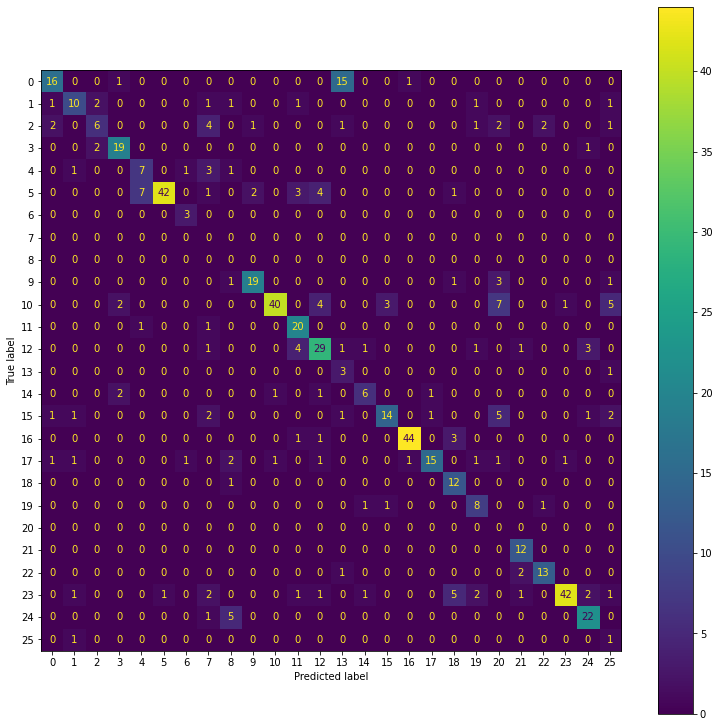

In [28]:
from sklearn import linear_model

# Logistic Regression Implementation:
lm = linear_model.LogisticRegression(multi_class='auto', solver='liblinear')
lm.fit(X_train, y_train) 

# Find the accuracy achieved on training set using logreg.score and y_train as type of int
acc_logreg = lm.score(X_train, y_train)
print("Accuracy on training data = %f" % acc_logreg)
# print("diff:", np.subtract(y_hat_logreg, y_train))

# eval
y_hat_logreg = lm.predict(X_val)
print("Metrics for Testing data")
print(metrics.classification_report(y_val, y_hat_logreg))
print("Confusion Matrix for *Testing Data")
cnf_matrix = metrics.confusion_matrix(y_hat_logreg, y_val)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)
# print("Coefficients:", lm.coef_)

In [29]:
# save results
y_hat_train = lm.predict(X_train).reshape(-1,1)
# print("Shapes:", y_train.shape, y_hat_train.shape, X_train.shape)
trained_matrix = np.hstack((y_hat_train, y_train, X_train))
print("Trained Matrix:", trained_matrix)
print("\nValidating Size:", trained_matrix.shape, "vs.", len(trained_labels))
# TODO: convert target to float so we can output as float csv instead of string
np.savetxt(predicted_dir+"logreg-results.csv", trained_matrix, delimiter=",", 
           header=','.join(trained_labels), fmt="%s")

Trained Matrix: [['good' 'good' '0.5837768316268921' ... '0.16024082899093628'
  '0.5482818484306335' '-0.10801234096288681']
 ['please' 'please' '0.1631850004196167' ... '0.6497573852539062'
  '0.5424402952194214' '-0.04827102646231651']
 ['project' 'project' '0.8363615870475769' ... '0.21348419785499573'
  '0.535830020904541' '-0.05214104801416397']
 ...
 ['b' 'c' '0.4175138771533966' ... '0.387866348028183'
  '0.4151456654071808' '-0.08874653279781342']
 ['a' 'a' '0.5082401037216187' ... '0.37982863187789917'
  '0.27652835845947266' '-0.10677354037761688']
 ['project' 'yes' '0.6808032393455505' ... '0.728218674659729'
  '0.8434618711471558' '-0.043134655803442']]

Validating Size: (1734, 65) vs. 65


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning: Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
  X = check_array(X, **check_params)


In [30]:
logreg_clf = lm

### Support Vector Machine Model

In [31]:
from sklearn import svm

# SVM Implementation
svm_results = []
for my_kernel in ['linear', 'poly', 'rbf', 'sigmoid']:  # skip 'precomputed'
    print("testing", my_kernel, "kernel...")
    for weight in range(1,201, 2):
        weight /= 10
        clf = svm.SVC(C=weight, decision_function_shape='ovo', kernel=my_kernel)
        clf.fit(X_train, y_train.reshape(-1))

        y_hat_nn = clf.predict(X_val)  # X_train
        acc = accuracy_score(y_val.reshape(-1), y_hat_nn) * 100

        new_entry = {'accuracy': acc, 'kernel': my_kernel, 'weight': weight, 'model': clf}
        svm_results.append(new_entry)
# show results
svm_results = sorted(svm_results, key=lambda d: d['accuracy'], reverse=True)
print()
for temp_result in svm_results:
    print(temp_result)

testing linear kernel...
testing poly kernel...
testing rbf kernel...
testing sigmoid kernel...

{'accuracy': 82.38341968911918, 'kernel': 'poly', 'weight': 10.5, 'model': SVC(C=10.5, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.38341968911918, 'kernel': 'poly', 'weight': 10.7, 'model': SVC(C=10.7, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.38341968911918, 'kernel': 'poly', 'weight': 10.9, 'model': SVC(C=10.9, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.38341968911918, 'kernel': 'poly', 'weight': 11.1, 'model': SVC(C=11.1, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.21070811744386, 'kernel': 'poly', 'weight': 9.3, 'model': SVC(C=9.3, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.21070811744386, 'kernel': 'poly', 'weight': 9.9, 'model': SVC(C=9.9, decision_function_shape='ovo', kernel='poly')}
{'accuracy': 82.21070811744386, 'kernel': 'poly', 'weight': 10.1, 'model': SVC(C=10.1, decision_functio

Metrics for Testing data
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        28
           1       0.68      0.48      0.57        27
           2       0.27      0.43      0.33         7
           3       0.95      0.79      0.86        24
           4       0.64      0.45      0.53        20
           5       0.97      1.00      0.98        56
           6       0.92      0.86      0.89        14
           7       0.88      0.64      0.74        11
           8       0.75      0.60      0.67         5
           9       0.92      0.80      0.86        15
           a       0.71      0.88      0.78        33
           b       0.78      0.82      0.80        22
         bye       0.97      0.90      0.94        42
           c       0.94      0.83      0.88        18
           d       0.77      0.77      0.77        13
           e       0.63      0.77      0.69        22
        good       0.95      0.95      0.95        58
go

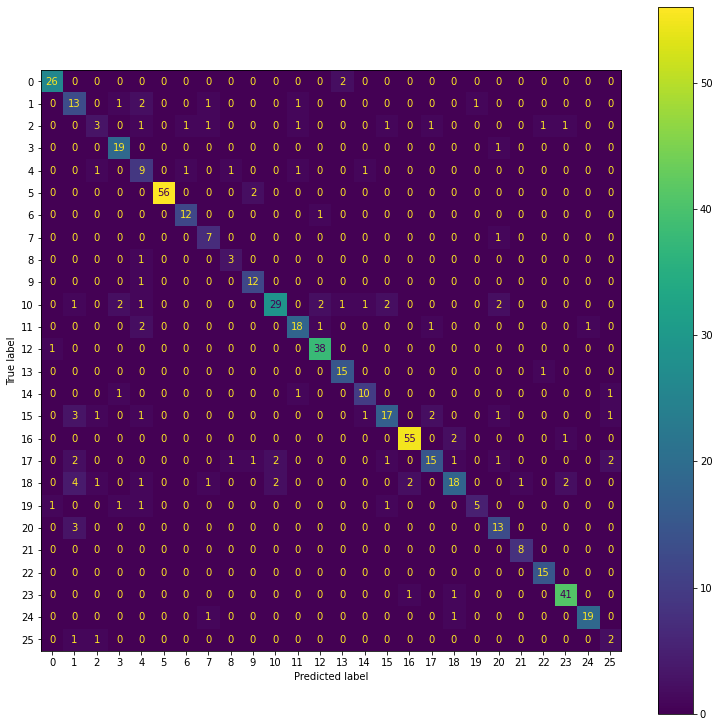

In [32]:
# set the best model to the one we evaluate
clf = svm_results[0]['model']
# eval
y_hat_svm = clf.predict(X_test)  # X_train
print("Metrics for Testing data")
print(metrics.classification_report(y_test, y_hat_svm))
print("Confusion Matrix for *Testing Data")
cnf_matrix = metrics.confusion_matrix(y_hat_svm, y_test)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)

In [33]:
# save results
y_hat_train = clf.predict(X_train).reshape(-1,1)
trained_matrix = np.hstack((y_hat_train, y_train, X_train))
print("Trained Matrix:", trained_matrix)
np.savetxt(predicted_dir+"svm-results.csv", trained_matrix, delimiter=",", header=','.join(trained_labels), fmt="%s")

Trained Matrix: [['good' 'good' '0.5837768316268921' ... '0.16024082899093628'
  '0.5482818484306335' '-0.10801234096288681']
 ['please' 'please' '0.1631850004196167' ... '0.6497573852539062'
  '0.5424402952194214' '-0.04827102646231651']
 ['project' 'project' '0.8363615870475769' ... '0.21348419785499573'
  '0.535830020904541' '-0.05214104801416397']
 ...
 ['b' 'c' '0.4175138771533966' ... '0.387866348028183'
  '0.4151456654071808' '-0.08874653279781342']
 ['a' 'a' '0.5082401037216187' ... '0.37982863187789917'
  '0.27652835845947266' '-0.10677354037761688']
 ['yes' 'yes' '0.6808032393455505' ... '0.728218674659729'
  '0.8434618711471558' '-0.043134655803442']]


In [34]:
svm_clf = clf

### Neural Network Model

In [48]:
from sklearn.neural_network import MLPClassifier

# Neural Network Implementation

middle_layer = 5*3 + 3  # hand digit flexion (xyz) + wrist orientation
# Note: standard hidden layer size, np.sqrt(X_train.shape[1] * total_options)=18, is approximately the same +-1
# proportional to image resolution?
middle_layer2 = 5 + 3  # flexion of single digit + 3 aggreate wrist positions
middle_layer3 = (X_train.shape[1] - len(letters))//3
nn_structures = [ [X_train.shape[1], middle_layer,                len(letters)],
                  [X_train.shape[1], middle_layer*2,              len(letters)],
#                   [X_train.shape[1], X_train.shape[1]//2,         middle_layer,          len(letters)],
#                   [X_train.shape[1], middle_layer,                middle_layer2,       len(letters)],
                  [X_train.shape[1], X_train.shape[1]-middle_layer3,   X_train.shape[1]-middle_layer3*2, len(letters)],
                  [X_train.shape[1], int(X_train.shape[1]/1.5),   int(middle_layer*1.5), len(letters)]
                ]
print("NN structures to test:\n", nn_structures)


"""  TEST RESULTS
Test 1) 84.3% best accuracy, 200 iter, activation ['tanh', 'logistic', 'relu'], 
learning rate range(1, 81, 15), ['constant', 'adaptive'] learning, regression range(0, 81, 20) 
[[63, 18, 27], [63, 36, 27], [63, 31, 18, 27], [63, 18, 8, 27], [63, 51, 39, 27], [63, 42, 27, 27]]

Test 2) 85.0% best accuracy, 400 iter, activation ['tanh', 'logistic', 'relu'], 
learning rate range(1, 81, 10), ['constant', 'adaptive'] learning, regression range(0, 106, 15) 
 [[63, 18, 27], [63, 36, 27], [63, 18, 8, 27], [63, 51, 39, 27], [63, 42, 27, 27]]

Test 3) 83.9% best accuracy, 500 iter, activation ['tanh', 'logistic', 'relu'],
['adaptive'] learning, learning rate & regression : [0.1, 0.05, 0.01, 0.005, 0.001, 0.0005, 0.0001]
 [[63, 18, 27], [63, 36, 27], [63, 51, 39, 27], [63, 42, 27, 27]]
 
Test 4) 84.8% best accuracy, 600 iter, activation ['tanh', 'logistic'],
['adaptive'] learning, learning rate & regression : [0.1, 0.4, 0.7, 0.01, 0.04, 0.07, 0.001, 0.004, 0.007, 0.0001, 0.0004, 0.0007]
 [[63, 18, 27], [63, 36, 27], [63, 51, 39, 27], [63, 42, 27, 27]]
 """
# train the NN
iterations_max = 800

temp_vals = [0.1, 0.01, 0.001, 0.0001]
exp_attempts = []
for val in temp_vals:
    exp_attempts.append(val)
    exp_attempts.append(round(val*4,5))
    exp_attempts.append(round(val*5,5))
    exp_attempts.append(round(val*7,5))
print("Vals Attempting:", exp_attempts)
# Note: reaches max limit => low training rate or likely doesnt converge

nn_results = []
for act in ['tanh', 'logistic', 'relu']:
    for n_struct in nn_structures:
        for delta_alpha in exp_attempts:
            learn_rate = delta_alpha/1  # 1000
            for learn_type in ['adaptive']:  # 'constant'
                for delta_reg in exp_attempts:
                    add_reg = delta_reg/1 # 1000
                    temp_clf = MLPClassifier(solver='lbfgs', activation=act, 
                                        learning_rate_init=learn_rate, learning_rate='constant',
                                        alpha=add_reg, max_iter=iterations_max,
                                        hidden_layer_sizes=n_struct[1:-1])
                    temp_clf.fit(X_train, y_train)

                    # Assessing accuracy (validation set to reduce bias)
                    y_hat_nn = temp_clf.predict(X_val)
                    acc = accuracy_score(y_val, y_hat_nn) * 100
                    
                    y_hat_train_nn = temp_clf.predict(X_train)
                    acc2 = accuracy_score(y_train, y_hat_train_nn) * 100
                    
                    if (acc < 83):  # save space for bad models - we can just recreate them later
                        temp_clf = ""

                    new_result = {'validation_accuracy': acc, 'testing_accuracy': acc2, 'activation': act, 'structure': n_struct, 
                                  'init_learning_rate': learn_rate, 'learning_type': learn_type, 
                                  'regulizer': add_reg, 'model': temp_clf}
                    print("Results:", new_result)
                    nn_results.append(new_result)

NN structures to test:
 [[63, 18, 27], [63, 36, 27], [63, 51, 39, 27], [63, 42, 27, 27]]
Vals Attempting: [0.1, 0.4, 0.5, 0.7, 0.01, 0.04, 0.05, 0.07, 0.001, 0.004, 0.005, 0.007, 0.0001, 0.0004, 0.0005, 0.0007]


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.7912341407151, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.67704728950405, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.33102652825836, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.46597462514417, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.92618223760091, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.90657439446368, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.02191464821222, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.82929642445214, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 95.67474048442907, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.54094579008074, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 94.40599769319492, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 93.9446366782007, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 93.25259515570934, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 90.42675893886967, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[18],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.5040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 89.33102652825836, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.73356401384083, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 91.92618223760091, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 94.1753171856978, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.82929642445214, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 92.21453287197232, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.13725490196079, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.02306805074971, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 88.63898500576701, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.81199538638985, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.6562860438293, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.84890426758939, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 92.21453287197232, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 93.31026528258363, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.46482122260669, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 94.86735870818916, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.1753171856978, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.02306805074971, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 89.5040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.63898500576701, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 92.73356401384083, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.1753171856978, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.00230680507498, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.90657439446368, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.44405997693195, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.27104959630911, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.31026528258363, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 92.32987312572088, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.90542099192618, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.2722029988466, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.73356401384083, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.77277970011534, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.15801614763552, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.81199538638985, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.40599769319492, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 93.13725490196079, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 95.38638985005767, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 95.6170703575548, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.67474048442907, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.77277970011534, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.73471741637832, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.46597462514417, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.88696655132641, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.54094579008074, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='tanh', alpha=0.07, hidden_layer_sizes=[18],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.02191464821222, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.02191464821222, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 94.52133794694349, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 92.44521337946944, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='tanh', alpha=0.1, hidden_layer_sizes=[18],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.08073817762399, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 89.79238754325259, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.10034602076125, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.32871972318338, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.32987312572088, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.63667820069203, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.19607843137256, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 89.56170703575548, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.1199538638985, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.86735870818916, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.07958477508652, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 92.2722029988466, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.40599769319492, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.96424452133795, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 94.1753171856978, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.21453287197232, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 89.79238754325259, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.02306805074971, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 87.8316032295271, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.6562860438293, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.09919261822375, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 93.25259515570934, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.90657439446368, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.31026528258363, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.63667820069203, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.13725490196079, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.56055363321799, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.6562860438293, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.15686274509804, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.56170703575548, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.79238754325259, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.17762399077279, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.38754325259517, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.80968858131487, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.6562860438293, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.25259515570934, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.27104959630911, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 93.82929642445214, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.98269896193771, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.92618223760091, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.80968858131487, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.98269896193771, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.09919261822375, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.63898500576701, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.02306805074971, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 88.58131487889274, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.50173010380622, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.82929642445214, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.50288350634371, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 94.52133794694349, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.5594002306805, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 94.23298731257209, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 90.08073817762399, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[18],
              learning_rate_init=0.007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.2156862745098, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.23529411764706, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.84890426758939, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.07958477508652, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.63783160322953, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 93.31026528258363, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.21453287197232, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.13725490196079, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.27104959630911, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 95.79008073817762, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.25374855824683, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.79238754325259, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 88.58131487889274, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.90772779700116, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.84890426758939, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 95.040369088812, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 94.86735870818916, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 92.44521337946944, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.67704728950405, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.02306805074971, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.52364475201846, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.38754325259517, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.56055363321799, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 94.80968858131487, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 91.75317185697808, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.84890426758939, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 92.50288350634371, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 93.9446366782007, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 92.84890426758939, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.65743944636678, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.10034602076125, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.9850057670127, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.09919261822375, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.56055363321799, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.42560553633218, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.92502883506344, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.63667820069203, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.88696655132641, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.56055363321799, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.59976931949251, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.33102652825836, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.4083044982699, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 94.98269896193771, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.00230680507498, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.40599769319492, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.67474048442907, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.32871972318338, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 93.6562860438293, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 92.67589388696655, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.67358708189158, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 94.7520184544406, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.58016147635524, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.92502883506344, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 91.98385236447521, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[36],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.78892733564014, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 95.50173010380622, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.15686274509804, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.21222606689734, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 97.69319492502883, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.15455594002307, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 94.69434832756633, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.1753171856978, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.32987312572088, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.26989619377161, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 93.31026528258363, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.6955017301038, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 94.86735870818916, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.88696655132641, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.04152249134948, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.32756632064591, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 98.21222606689734, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.78892733564014, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 97.57785467128028, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='tanh', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.93782383419689, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 93.19492502883506, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.44521337946944, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.44290657439446, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 94.80968858131487, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[36],
              learning_rate_init=0.07, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.63783160322953, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.21222606689734, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.09688581314879, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 97.57785467128028, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 94.11764705882352, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[36],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.29181084198386, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='tanh', alpha=0.07, hidden_layer_sizes=[36],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.0293609671848, 'testing_accuracy': 98.15455594002307, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.15455594002307, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.71395617070357, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 91.98385236447521, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.4636678200692, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.59861591695503, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.50288350634371, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='tanh', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.38523644752019, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.15570934256056, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.3679354094579, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 84.28324697754749, 'testing_accuracy': 91.6955017301038, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[36],
              learning_rate_init=0.007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 98.09688581314879, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.57900807381776, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.77162629757785, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.09919261822375, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.29065743944636, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.34832756632065, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 92.15686274509804, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 98.26989619377161, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.09803921568627, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.05997693194925, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.63783160322953, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.52018454440599, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.15455594002307, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.40599769319492, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.48327566320646, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 92.09919261822375, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='tanh', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.55824682814303, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 98.67358708189158, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='tanh', alpha=0.05, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.5, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[51, 39],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='tanh', alpha=0.07, hidden_layer_sizes=[51, 39],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0001, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 98.0392156862745, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.55824682814303, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.15455594002307, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.98154555940023, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 97.86620530565168, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 97.98154555940023, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.5, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.3385146804836, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.0293609671848, 'testing_accuracy': 96.65513264129181, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.57785467128028, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.01960784313727, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 98.0392156862745, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.6159169550173, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 97.17416378316032, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 97.92387543252595, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 97.98154555940023, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 97.17416378316032, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.55824682814303, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 98.26989619377161, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.6159169550173, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 97.75086505190312, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 96.77047289504037, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.40484429065745, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 97.46251441753172, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[42, 27],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.09688581314879, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 97.52018454440599, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.32756632064591, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.6159169550173, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.32756632064591, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.6159169550173, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.55824682814303, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.44290657439446, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.0392156862745, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 98.26989619377161, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 97.92387543252595, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.9042675893887, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 98.55824682814303, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.53863898500576, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.80853517877739, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.48096885813149, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.84659746251442, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': MLPClassifier(activation='tanh', alpha=0.5, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.0005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.80853517877739, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.13494809688581, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.36562860438293, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.65397923875432, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.59630911188005, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.50057670126874, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.96193771626297, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.7116493656286, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.07727797001154, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.73125720876585, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.19261822376009, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.82698961937716, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.25028835063438, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.76931949250289, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.30795847750865, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 97.00115340253748, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 99.4232987312572, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 99.88465974625143, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.09688581314879, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 85.23644752018454, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 84.54440599769319, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 82.46828143021915, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.96424452133795, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 92.2722029988466, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[18],
              learning_rate_init=0.1, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[18],
              learning_rate_init=0.1, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 89.44636678200692, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 91.75317185697808, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.17647058823529, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.44521337946944, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 90.08073817762399, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 89.5040369088812, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.40945790080738, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 83.91003460207612, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 82.5836216839677, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.77277970011534, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.52249134948097, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.4071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.00230680507498, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.3679354094579, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 92.96424452133795, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 88.29296424452133, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.07958477508652, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.04152249134948, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 85.75547866205305, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 83.9677047289504, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 82.35294117647058, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.38869665513263, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.15686274509804, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.3690888119954, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.3690888119954, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.15686274509804, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.96539792387543, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 87.8316032295271, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 89.67704728950405, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 89.2156862745098, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.08073817762399, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.61937716262976, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.29411764705883, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 84.71741637831603, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 82.5836216839677, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.90657439446368, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.09919261822375, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.7, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 92.61822376009228, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.35063437139561, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 91.92618223760091, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.38754325259517, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 91.6955017301038, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 88.92733564013841, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.29411764705883, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 84.65974625144176, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 82.69896193771626, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.67589388696655, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 91.17647058823529, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[18],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.04152249134948, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.44636678200692, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.9850057670127, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 91.81084198385237, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.3690888119954, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.59861591695503, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 90.54209919261822, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.54209919261822, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 83.39100346020761, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 82.98731257208766, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.58016147635524, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.11880046136102, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.90888119953864, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 88.06228373702422, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 91.92618223760091, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.32987312572088, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.17647058823529, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 85.75547866205305, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 84.02537485582468, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 82.75663206459055, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 90.77277970011534, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[18],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 91.11880046136102, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 88.4083044982699, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.75317185697808, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.09919261822375, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.96539792387543, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.19607843137256, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.75547866205305, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 84.37139561707035, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 82.8719723183391, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 91.63783160322953, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.56055363321799, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.3690888119954, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 89.79238754325259, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.5432525951557, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 89.10034602076125, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 89.33102652825836, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 89.27335640138409, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 92.7912341407151, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.4071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.38754325259517, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.19607843137256, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 84.71741637831603, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 82.92964244521337, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 91.29181084198386, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 89.85005767012687, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 87.25490196078431, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 91.23414071510958, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 88.46597462514417, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 90.77277970011534, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 85.40945790080738, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 84.14071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 82.92964244521337, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 92.56055363321799, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': MLPClassifier(activation='logistic', alpha=0.01, hidden_layer_sizes=[18],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.4071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 91.4071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[18],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.09919261822375, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.92733564013841, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 89.10034602076125, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.11880046136102, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 91.4071510957324, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 92.61822376009228, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 89.56170703575548, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 85.92848904267589, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 84.31372549019608, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 82.52595155709342, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.25374855824683, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.54209919261822, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 89.96539792387543, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 88.75432525951558, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.54209919261822, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 87.5432525951557, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 89.5040369088812, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.38869665513263, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.40945790080738, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 84.2560553633218, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 82.52595155709342, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.06113033448673, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.79238754325259, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 92.21453287197232, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.8881199538639, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.15801614763552, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 91.63783160322953, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 89.79238754325259, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 86.04382929642446, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 83.9677047289504, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 82.81430219146482, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 92.04152249134948, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[18],
              learning_rate_init=0.0001, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 91.23414071510958, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.0001, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.67704728950405, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 91.81084198385237, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.56055363321799, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 93.25259515570934, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 90.19607843137256, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.50288350634371, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.35063437139561, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 84.48673587081892, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 84.48673587081892, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 82.41061130334487, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.23414071510958, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 91.81084198385237, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.0004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.25374855824683, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.98385236447521, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.7912341407151, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 89.96539792387543, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.86851211072664, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.15686274509804, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 85.23644752018454, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 84.83275663206459, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 82.41061130334487, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.2722029988466, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.93782383419689, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[18],
              learning_rate_init=0.0005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.07958477508652, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.15801614763552, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.52249134948097, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.61937716262976, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.29181084198386, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.58016147635524, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.06113033448673, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 91.58016147635524, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.56170703575548, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 85.75547866205305, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 84.71741637831603, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 82.64129181084199, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 87.8316032295271, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 90.94579008073818, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[18],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.46482122260669, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.17647058823529, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.38754325259517, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.50288350634371, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 89.38869665513263, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 92.04152249134948, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.63667820069203, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.67820069204151, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.52479815455594, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 83.33333333333334, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.98154555940023, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 95.38638985005767, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 97.34717416378315, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.00115340253748, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': MLPClassifier(activation='logistic', alpha=0.005, hidden_layer_sizes=[36],
              learning_rate_init=0.1, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 96.25144175317186, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 75.47495682210709, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.54094579008074, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 94.23298731257209, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 87.19723183391004, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 86.04382929642446, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 83.33333333333334, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[36],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 95.8477508650519, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.34717416378315, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 98.44290657439446, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.86735870818916, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.96655132641293, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 85.40945790080738, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 83.62168396770473, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 96.7128027681661, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 84.11053540587218, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.5, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.5594002306805, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 95.21337946943483, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.5, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.50173010380622, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.15570934256056, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.67358708189158, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.21337946943483, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 94.11764705882352, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.37024221453287, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 83.50634371395617, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.7, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 97.92387543252595, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': MLPClassifier(activation='logistic', alpha=0.007, hidden_layer_sizes=[36],
              learning_rate_init=0.7, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.09688581314879, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.7520184544406, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 87.48558246828144, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.58246828143022, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 83.67935409457901, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.44290657439446, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.00115340253748, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 95.38638985005767, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.05997693194925, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 97.98154555940023, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.44405997693195, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 96.7128027681661, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 95.73241061130334, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 93.3679354094579, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.96655132641293, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 85.52479815455594, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 83.85236447520185, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[36],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 97.63552479815456, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.40484429065745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 97.00115340253748, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 94.57900807381776, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 86.90888119953864, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 85.6401384083045, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 83.62168396770473, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.7651122625216, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.44405997693195, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.79008073817762, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.00230680507498, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 94.4636678200692, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.07, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 87.48558246828144, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 85.58246828143022, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 84.02537485582468, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.57785467128028, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.07, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.57900807381776, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': MLPClassifier(activation='logistic', alpha=0.007, hidden_layer_sizes=[36],
              learning_rate_init=0.07, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.88581314878893, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 96.07843137254902, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.80968858131487, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 94.23298731257209, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.79354094579008, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.10149942329873, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 83.73702422145328, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 95.8477508650519, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 97.80853517877739, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': MLPClassifier(activation='logistic', alpha=0.004, hidden_layer_sizes=[36],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.98269896193771, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.79008073817762, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.21337946943483, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 96.7128027681661, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.00230680507498, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 94.80968858131487, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 87.0242214532872, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 85.98615916955016, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 83.67935409457901, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 96.88581314878893, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 96.25144175317186, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 95.73241061130334, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.78892733564014, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.00115340253748, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 96.94348327566321, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.7520184544406, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.90888119953864, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.46712802768167, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 83.85236447520185, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.50173010380622, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.40484429065745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 96.07843137254902, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.8477508650519, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.92502883506344, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 87.08189158016147, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.87081891580162, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 83.73702422145328, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.25144175317186, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 97.00115340253748, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 97.40484429065745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.27104959630911, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.13494809688581, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.63667820069203, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.44405997693195, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.92502883506344, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.67474048442907, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 94.69434832756633, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 87.13956170703575, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.69780853517878, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 83.44867358708188, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 95.38638985005767, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[36],
              learning_rate_init=0.0001, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.0001, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.88581314878893, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.27104959630911, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.63667820069203, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.90888119953864, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 83.9677047289504, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[36],
              learning_rate_init=0.0004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.7128027681661, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 84.28324697754749, 'testing_accuracy': 95.50173010380622, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.0004, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.80853517877739, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 95.32871972318338, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 86.79354094579008, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 85.52479815455594, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 83.79469434832757, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.44405997693195, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.88696655132641, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.92387543252595, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.98154555940023, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 94.05997693194925, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.96655132641293, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.69780853517878, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 83.56401384083046, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.25144175317186, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.04267589388697, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.4475201845444, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.2156862745098, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.98615916955016, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.78892733564014, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.01960784313727, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.86966551326412, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.56286043829297, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.59630911188005, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.79008073817762, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.38638985005767, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 97.28950403690888, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.42675893886967, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.44636678200692, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.10149942329873, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.7, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.52364475201846, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.62053056516724, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.0293609671848, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 88.58131487889274, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.67820069204151, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.59630911188005, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.92733564013841, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.67820069204151, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 96.94348327566321, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.16580310880829, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 97.63552479815456, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.13494809688581, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.11880046136102, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.75432525951558, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.4475201845444, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[51, 39],
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 91.00346020761245, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.81199538638985, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.27450980392157, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.59630911188005, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.3385146804836, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.19607843137256, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.33102652825836, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 86.159169550173, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 98.96193771626297, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 99.4232987312572, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.17647058823529, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.33102652825836, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.87081891580162, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 99.59630911188005, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.0293609671848, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 99.59630911188005, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.2156862745098, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.10149942329873, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.01960784313727, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.4232987312572, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 90.59976931949251, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.27335640138409, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.10149942329873, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.4232987312572, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.53863898500576, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.36562860438293, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 96.07843137254902, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.13840830449827, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.81199538638985, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 85.87081891580162, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 99.36562860438293, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.73241061130334, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.44290657439446, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.71510957324107, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.58131487889274, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 85.69780853517878, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 96.88581314878893, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.4232987312572, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.83044982698962, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.92733564013841, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 86.04382929642446, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=0.04, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0007, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.88465974625143, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 98.50057670126874, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 97.92387543252595, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.15801614763552, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.75432525951558, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 86.21683967704729, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 93.71395617070357, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.98154555940023, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.58131487889274, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.52479815455594, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(activation='logistic', alpha=0.05, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 94.57900807381776, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 94.1753171856978, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.08073817762399, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.46597462514417, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.159169550173, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.44290657439446, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.92387543252595, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.98269896193771, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.73241061130334, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.38638985005767, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 87.88927335640139, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 86.38985005767013, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.13494809688581, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.01960784313727, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.01960784313727, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 92.96424452133795, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.07843137254902, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.0293609671848, 'testing_accuracy': 97.57785467128028, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 76.51122625215889, 'testing_accuracy': 94.40599769319492, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 98.09688581314879, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.01, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 89.5040369088812, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.29296424452133, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.10149942329873, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.96193771626297, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 94.69434832756633, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.23298731257209, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 93.6562860438293, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 94.52133794694349, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.93782383419689, 'testing_accuracy': 97.52018454440599, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.04, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.69665513264128, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.87081891580162, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 95.8477508650519, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 98.67358708189158, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 97.40484429065745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 97.63552479815456, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.34717416378315, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.25374855824683, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.29296424452133, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 98.67358708189158, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.79008073817762, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.8566493955095, 'testing_accuracy': 95.15570934256056, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 92.96424452133795, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 93.13725490196079, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 92.21453287197232, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 96.88581314878893, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.02306805074971, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.63898500576701, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 85.46712802768167, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.48096885813149, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 98.44290657439446, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.07, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.05882352941177, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 99.94232987312573, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 94.4636678200692, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 93.77162629757785, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 97.92387543252595, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 97.40484429065745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.48442906574394, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.46597462514417, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.38985005767013, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.13494809688581, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 95.09803921568627, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.67358708189158, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.1753171856978, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.68393782383419, 'testing_accuracy': 97.86620530565168, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 97.11649365628604, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.040369088812, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.19607843137256, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.00461361014995, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.56286043829297, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.1361014994233, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.98269896193771, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 97.23183391003461, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 76.3385146804836, 'testing_accuracy': 92.50288350634371, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 97.34717416378315, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.65513264129181, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[42, 27],
              learning_rate_init=0.005, max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.46597462514417, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.21222606689734, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 98.96193771626297, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 94.63667820069203, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.67358708189158, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 93.82929642445214, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 96.59746251441753, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 93.48327566320646, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.92733564013841, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 85.6401384083045, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 97.75086505190312, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.4232987312572, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.7128027681661, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 93.77162629757785, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.71395617070357, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.32871972318338, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 96.07843137254902, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.73241061130334, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 76.3385146804836, 'testing_accuracy': 94.40599769319492, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.67704728950405, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.69665513264128, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.62053056516724, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.30795847750865, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.6159169550173, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.15455594002307, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 98.21222606689734, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 98.32756632064591, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 95.6170703575548, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 96.77047289504037, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 98.0392156862745, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.77277970011534, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.9850057670127, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 86.04382929642446, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.57785467128028, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 98.73125720876585, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.65397923875432, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.82698961937716, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 96.02076124567473, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 99.19261822376009, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 92.84890426758939, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 97.17416378316032, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 98.38523644752019, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.73471741637832, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.88927335640139, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.81314878892734, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.78892733564014, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.84659746251442, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.26989619377161, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.96193771626297, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 95.96309111880046, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 96.42445213379469, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 99.7116493656286, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 96.48212226066897, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.69319492502883, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.3690888119954, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.63898500576701, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.40945790080738, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 97.46251441753172, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 99.25028835063438, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 98.9042675893887, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.96193771626297, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 96.19377162629758, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 98.55824682814303, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 93.6562860438293, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.86735870818916, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.90542099192618, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 93.71395617070357, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.90888119953864, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 87.5432525951557, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 86.27450980392157, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.5432525951557, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.2156862745098, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 87.13956170703575, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 86.10149942329873, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.37478411053542, 'testing_accuracy': 85.58246828143022, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.67704728950405, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.54749568221071, 'testing_accuracy': 84.48673587081892, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.96655132641293, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 88.52364475201846, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.27450980392157, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 86.7358708189158, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.06113033448673, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 87.08189158016147, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.4083044982699, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 75.30224525043178, 'testing_accuracy': 79.52710495963092, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 89.67704728950405, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.9850057670127, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.19723183391004, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 88.75432525951558, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.33102652825836, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 88.23529411764706, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 85.81314878892734, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 86.38985005767013, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.62053056516724, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 86.56286043829297, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.10149942329873, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.21683967704729, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 82.81430219146482, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 86.04382929642446, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 89.15801614763552, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.2020725388601, 'testing_accuracy': 83.73702422145328, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.3125720876586, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.94694348327566, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 82.69896193771626, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 88.23529411764706, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 87.5432525951557, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.77393310265282, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 86.38985005767013, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 87.13956170703575, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 86.7358708189158, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.159169550173, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.69780853517878, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.75432525951558, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.92733564013841, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.0242214532872, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.38869665513263, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.52249134948097, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.27450980392157, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 75.99309153713298, 'testing_accuracy': 80.21914648212226, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 84.02537485582468, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.73471741637832, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.90772779700116, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 85.98615916955016, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.4083044982699, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 87.25490196078431, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.0242214532872, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 84.94809688581316, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 88.52364475201846, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 87.71626297577855, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.61937716262976, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 87.37024221453287, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 85.6401384083045, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.04267589388697, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 89.79238754325259, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 89.67704728950405, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.29296424452133, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 87.94694348327566, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 87.88927335640139, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 86.159169550173, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.88927335640139, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.86966551326412, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 90.3690888119954, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.7358708189158, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.58131487889274, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.92733564013841, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 86.33217993079585, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.50519031141869, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.61937716262976, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.69780853517878, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.23644752018454, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 88.29296424452133, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 84.83275663206459, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 84.54440599769319, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 87.5432525951557, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 90.77277970011534, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.3114186851211, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.33217993079585, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 87.88927335640139, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 89.85005767012687, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 87.77393310265282, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.75547866205305, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.71510957324107, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 84.2560553633218, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 85.98615916955016, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 86.50519031141869, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 88.1199538638985, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 86.67820069204151, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 85.0634371395617, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 84.60207612456747, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.52364475201846, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.52249134948097, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 86.79354094579008, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 86.21683967704729, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 86.62053056516724, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.46597462514417, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 80.44982698961938, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 88.63898500576701, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 89.73471741637832, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.48558246828144, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 87.65859284890428, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.63898500576701, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.10149942329873, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 86.56286043829297, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 86.79354094579008, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.56286043829297, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 83.62168396770473, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.29296424452133, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.00461361014995, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 86.79354094579008, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.04267589388697, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.02306805074971, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 88.92733564013841, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 87.48558246828144, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 88.46597462514417, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.50519031141869, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 83.62168396770473, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 86.27450980392157, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 85.81314878892734, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 82.64129181084199, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.48558246828144, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 84.65974625144176, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 86.85121107266436, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.4475201845444, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 88.69665513264128, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 75.64766839378238, 'testing_accuracy': 81.08419838523645, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.2722029988466, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.5040369088812, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 88.23529411764706, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.94694348327566, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.1199538638985, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 86.96655132641293, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 87.08189158016147, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 88.86966551326412, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.06113033448673, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.02306805074971, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 89.90772779700116, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 89.2156862745098, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 88.17762399077279, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.04267589388697, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.86851211072664, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 84.19838523644752, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 85.75547866205305, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.85121107266436, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.7358708189158, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 85.92848904267589, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 87.8316032295271, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 88.52364475201846, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.3690888119954, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 88.63898500576701, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.25490196078431, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.23644752018454, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 88.4083044982699, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.29296424452133, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.08073817762399, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 85.46712802768167, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 87.42791234140715, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 86.33217993079585, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 88.35063437139561, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 85.69780853517878, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 88.92733564013841, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 87.0242214532872, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 85.98615916955016, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 86.10149942329873, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 87.08189158016147, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 88.29296424452133, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 88.92733564013841, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.8316032295271, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.3114186851211, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 90.3690888119954, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 84.37139561707035, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 84.94809688581316, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 88.00461361014995, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 85.0634371395617, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 89.2156862745098, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 87.3125720876586, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.02306805074971, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 85.46712802768167, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 88.4083044982699, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 89.90772779700116, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.4475201845444, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.23529411764706, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 85.92848904267589, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.13840830449827, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.38985005767013, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 87.71626297577855, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 87.48558246828144, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 87.0242214532872, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.04382929642446, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.27335640138409, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 85.17877739331027, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.46597462514417, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 85.23644752018454, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 89.15801614763552, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 87.3125720876586, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 86.96655132641293, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.50519031141869, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 86.38985005767013, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.60092272202998, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.48558246828144, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 86.7358708189158, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 87.08189158016147, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.25374855824683, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 86.21683967704729, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 86.56286043829297, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.9850057670127, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.25374855824683, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.23414071510958, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 88.81199538638985, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 88.06228373702422, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.02306805074971, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.33102652825836, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.59746251441753, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.90542099192618, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.3114186851211, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.54209919261822, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.56055363321799, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.92618223760091, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.63783160322953, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 91.46482122260669, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': MLPClassifier(alpha=0.4, hidden_layer_sizes=[36], learning_rate_init=0.5,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.13840830449827, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.24697754749567, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(alpha=0.07, hidden_layer_sizes=[36], learning_rate_init=0.5,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.79008073817762, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 96.59746251441753, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.7520184544406, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.46482122260669, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.92618223760091, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 90.13840830449827, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.77277970011534, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 89.90772779700116, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.13840830449827, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 91.52249134948097, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.96424452133795, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.67704728950405, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 91.06113033448673, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.88696655132641, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.7520184544406, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.44405997693195, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.41968911917098, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(alpha=0.1, hidden_layer_sizes=[36], learning_rate_init=0.05,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.2722029988466, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.46482122260669, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.07958477508652, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.06113033448673, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.04152249134948, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.07958477508652, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.59976931949251, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(alpha=0.04, hidden_layer_sizes=[36], learning_rate_init=0.07,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.98269896193771, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.34832756632065, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.42675893886967, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.82929642445214, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 89.56170703575548, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.4636678200692, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.1753171856978, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.67474048442907, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.44405997693195, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.25374855824683, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 89.73471741637832, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 91.00346020761245, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 96.82814302191464, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.34832756632065, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.23414071510958, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 90.3114186851211, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.26989619377161, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.54209919261822, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.9446366782007, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.86851211072664, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.38638985005767, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.07843137254902, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 91.86851211072664, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.96424452133795, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.67589388696655, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.11649365628604, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.8477508650519, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.94579008073818, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 92.04152249134948, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 88.46597462514417, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 90.25374855824683, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.4636678200692, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.59240069084629, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(alpha=0.04, hidden_layer_sizes=[36], learning_rate_init=0.0001,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.80968858131487, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.56055363321799, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 91.6955017301038, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.11880046136102, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 98.73125720876585, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 83.07426597582038, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': MLPClassifier(alpha=0.05, hidden_layer_sizes=[36], learning_rate_init=0.0004,
              max_iter=800, solver='lbfgs')}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.06113033448673, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.29181084198386, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.8477508650519, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.6955017301038, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.11880046136102, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.75317185697808, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 90.65743944636678, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.77047289504037, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.90657439446368, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.86735870818916, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.63783160322953, 'activation': 'relu', 'structure': [63, 36, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.8477508650519, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 93.19492502883506, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.40484429065745, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 98.84659746251442, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 97.34717416378315, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 99.13494809688581, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.36562860438293, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 94.4636678200692, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 96.36678200692042, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.98154555940023, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 96.07843137254902, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.30911188004615, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.82929642445214, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 97.11649365628604, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.7520184544406, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 97.23183391003461, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.67589388696655, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.96424452133795, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 97.40484429065745, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.57785467128028, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.50173010380622, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.53863898500576, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.88696655132641, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.34717416378315, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.30911188004615, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.17416378316032, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 97.57785467128028, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.53863898500576, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.46251441753172, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.11649365628604, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 100.0, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 98.0392156862745, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.4232987312572, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.8477508650519, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.07958477508652, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 99.76931949250289, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.86735870818916, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.94348327566321, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.0392156862745, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 97.75086505190312, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.67474048442907, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.55824682814303, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.05882352941177, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.80853517877739, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.44290657439446, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.44290657439446, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.88465974625143, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.73125720876585, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 97.92387543252595, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 95.44405997693195, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.80968858131487, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.30795847750865, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 96.1361014994233, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 99.07727797001154, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 96.19377162629758, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.98269896193771, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 96.94348327566321, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.34717416378315, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.67474048442907, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.38638985005767, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 96.53979238754326, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 99.25028835063438, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.32756632064591, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 97.40484429065745, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 96.88581314878893, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.17416378316032, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.44290657439446, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 98.67358708189158, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.4636678200692, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.65397923875432, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.07727797001154, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.19492502883506, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 96.48212226066897, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.19492502883506, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.96193771626297, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.26989619377161, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.46251441753172, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.80853517877739, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 100.0, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 100.0, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 97.80853517877739, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 97.17416378316032, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 97.17416378316032, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 98.15455594002307, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.94232987312573, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.88696655132641, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 96.82814302191464, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 98.15455594002307, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.7116493656286, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.34832756632065, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.88465974625143, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 98.50057670126874, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 96.77047289504037, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.36678200692042, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 98.15455594002307, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.38638985005767, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 98.73125720876585, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.98269896193771, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.50173010380622, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 99.82698961937716, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.38523644752019, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 98.26989619377161, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.96309111880046, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 96.88581314878893, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.92387543252595, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.96309111880046, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.88465974625143, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.44405997693195, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 98.21222606689734, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 95.90542099192618, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.01960784313727, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 97.98154555940023, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.94348327566321, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 94.80968858131487, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 99.30795847750865, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.98269896193771, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 98.50057670126874, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.92618223760091, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 98.38523644752019, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.48212226066897, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.42445213379469, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 97.46251441753172, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 96.59746251441753, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 96.07843137254902, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.1361014994233, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 99.59630911188005, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.96309111880046, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.90542099192618, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 96.77047289504037, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.88581314878893, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 91.46482122260669, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 96.59746251441753, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 99.25028835063438, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 98.67358708189158, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 99.25028835063438, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 98.73125720876585, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.96309111880046, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 98.38523644752019, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 98.32756632064591, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 96.7128027681661, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 96.82814302191464, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.38638985005767, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 97.57785467128028, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 96.19377162629758, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 100.0, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.07843137254902, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 98.26989619377161, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 95.79008073817762, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.46251441753172, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.07843137254902, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 99.53863898500576, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.55824682814303, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.57785467128028, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 95.73241061130334, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 99.88465974625143, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.42445213379469, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 98.73125720876585, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.86735870818916, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 97.46251441753172, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.79008073817762, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.19492502883506, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.90542099192618, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 98.55824682814303, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.96309111880046, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.48327566320646, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 91.63783160322953, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 90.65743944636678, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 92.56055363321799, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 94.80968858131487, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3

Results: {'validation_accuracy': 82.90155440414507, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.15686274509804, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 87.71626297577855, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.85005767012687, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.15801614763552, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.6955017301038, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 98.67358708189158, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.09919261822375, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 91.11880046136102, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.4, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 95.50173010380622, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.38869665513263, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 93.48327566320646, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.720207253886, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.67474048442907, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.9446366782007, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 88.1199538638985, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.77047289504037, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 94.7520184544406, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.2722029988466, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 89.61937716262976, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.82929642445214, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.71510957324107, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 95.50173010380622, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 95.44405997693195, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.42675893886967, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 96.02076124567473, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 91.6955017301038, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.34948096885813, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.83044982698962, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 99.07727797001154, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.83044982698962, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 96.59746251441753, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 96.7128027681661, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.29181084198386, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 99.01960784313727, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.80968858131487, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.23414071510958, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.71510957324107, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 91.52249134948097, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 89.90772779700116, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 96.19377162629758, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.06563039723662, 'testing_accuracy': 96.88581314878893, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 96.82814302191464, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 91.6955017301038, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 88.69665513264128, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.96424452133795, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 77.89291882556131, 'testing_accuracy': 87.8316032295271, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.48442906574394, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.34832756632065, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.7520184544406, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.67589388696655, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.7912341407151, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 95.15570934256056, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.1753171856978, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 90.65743944636678, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 90.83044982698962, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 90.54209919261822, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 89.10034602076125, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.92618223760091, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.77393310265282, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 97.28950403690888, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 89.04267589388697, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.44521337946944, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 94.29065743944636, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.41105354058722, 'testing_accuracy': 95.21337946943483, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.25259515570934, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.92918825561313, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.67589388696655, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 91.00346020761245, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 87.5432525951557, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 90.3114186851211, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 89.73471741637832, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.71395617070357, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.94579008073818, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.90657439446368, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 94.11764705882352, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 91.17647058823529, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.38341968911918, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.86528497409327, 'testing_accuracy': 96.25144175317186, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 76.3385146804836, 'testing_accuracy': 85.6401384083045, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.54209919261822, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 90.54209919261822, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.21070811744386, 'testing_accuracy': 94.40599769319492, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 92.56055363321799, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.88696655132641, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 91.86851211072664, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.57900807381776, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 96.48212226066897, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 89.79238754325259, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 91.92618223760091, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 93.9446366782007, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 94.1753171856978, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.13725490196079, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.27104959630911, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 90.19607843137256, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.79008073817762, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.62003454231433, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 91.11880046136102, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 97.23183391003461, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 90.8881199538639, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.08073817762399, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.2722029988466, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 91.98385236447521, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 98.32756632064591, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.55613126079447, 'testing_accuracy': 93.19492502883506, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 89.44636678200692, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 93.42560553633218, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.38754325259517, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.77162629757785, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 86.62053056516724, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.75647668393782, 'testing_accuracy': 95.79008073817762, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.6562860438293, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.86735870818916, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.9446366782007, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 91.86851211072664, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 94.00230680507498, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 94.63667820069203, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 93.88696655132641, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 94.52133794694349, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 90.94579008073818, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 94.92502883506344, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.48359240069085, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.03799654576856, 'testing_accuracy': 95.040369088812, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.71510957324107, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 94.05997693194925, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.27461139896373, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.28950403690888, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.46482122260669, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 97.86620530565168, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 89.96539792387543, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.13816925734024, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.48327566320646, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 90.71510957324107, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 91.52249134948097, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 95.8477508650519, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 97.00115340253748, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 91.63783160322953, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 93.02191464821222, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.10189982728842, 'testing_accuracy': 95.5594002306805, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.65630397236615, 'testing_accuracy': 92.32987312572088, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.79274611398964, 'testing_accuracy': 94.23298731257209, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 92.04152249134948, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.23834196891191, 'testing_accuracy': 94.69434832756633, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.21453287197232, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 94.86735870818916, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.96545768566494, 'testing_accuracy': 93.9446366782007, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.69257340241796, 'testing_accuracy': 92.50288350634371, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.51986183074266, 'testing_accuracy': 92.67589388696655, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 93.59861591695503, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.01, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 96.30911188004615, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 82.72884283246978, 'testing_accuracy': 91.58016147635524, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 93.3679354094579, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.31088082901555, 'testing_accuracy': 95.6170703575548, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 95.09803921568627, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 79.44732297063904, 'testing_accuracy': 91.4071510957324, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.34715025906736, 'testing_accuracy': 92.73356401384083, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 78.58376511226253, 'testing_accuracy': 93.54094579008074, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 80.82901554404145, 'testing_accuracy': 92.90657439446368, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0004, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

Results: {'validation_accuracy': 81.00172711571675, 'testing_accuracy': 92.84890426758939, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}
Results: {'validation_accuracy': 81.17443868739205, 'testing_accuracy': 97.17416378316032, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0007, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly 

In [49]:
# ordering/sorting data
nn_results = sorted(nn_results, key=lambda d: d['validation_accuracy'], reverse=True) 
print('\n*****Results:')
for temp_result in nn_results:
    print(temp_result)


*****Results:
{'validation_accuracy': 84.28324697754749, 'testing_accuracy': 91.6955017301038, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[36],
              learning_rate_init=0.007, max_iter=800, solver='lbfgs')}
{'validation_accuracy': 84.28324697754749, 'testing_accuracy': 95.50173010380622, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': MLPClassifier(activation='logistic', alpha=0.07, hidden_layer_sizes=[36],
              learning_rate_init=0.0004, max_iter=800, solver='lbfgs')}
{'validation_accuracy': 84.11053540587218, 'testing_accuracy': 96.36678200692042, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.04, 'model': MLPClassifier(activation='logistic', alpha=

{'validation_accuracy': 81.00172711571675, 'testing_accuracy': 94.1753171856978, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}
{'validation_accuracy': 81.00172711571675, 'testing_accuracy': 91.81084198385237, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.05, 'model': ''}
{'validation_accuracy': 81.00172711571675, 'testing_accuracy': 87.77393310265282, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}
{'validation_accuracy': 81.00172711571675, 'testing_accuracy': 95.32871972318338, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}
{'validation_accuracy': 81.00172711571675, 'testing_accuracy': 90.94579008073818, 'activation': 'relu',

{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.07727797001154, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}
{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.30911188004615, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}
{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.53979238754326, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}
{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 96.82814302191464, 'activation': 'logistic', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}
{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 99.65397923875432, 

In [50]:
print("Results that minimize probability of overfitting")  # variance decomposition
nn_results2 = sorted(nn_results, key=lambda d: d['testing_accuracy']-d['validation_accuracy']) 
print('\n*****Results:')
for temp_result in nn_results2:
    print(temp_result)

Results that minimize probability of overfitting

*****Results:
{'validation_accuracy': 80.48359240069085, 'testing_accuracy': 82.81430219146482, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.5, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}
{'validation_accuracy': 78.06563039723662, 'testing_accuracy': 80.44982698961938, 'activation': 'relu', 'structure': [63, 18, 27], 'init_learning_rate': 0.07, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}
{'validation_accuracy': 79.44732297063904, 'testing_accuracy': 82.69896193771626, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 83.50634371395617, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': ''}
{'validation_accuracy': 81.17443868739205, 'testing_

              learning_rate_init=0.4, max_iter=800, solver='lbfgs')}
{'validation_accuracy': 83.41968911917098, 'testing_accuracy': 94.57900807381776, 'activation': 'logistic', 'structure': [63, 36, 27], 'init_learning_rate': 0.05, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': MLPClassifier(activation='logistic', alpha=0.1, hidden_layer_sizes=[36],
              learning_rate_init=0.05, max_iter=800, solver='lbfgs')}
{'validation_accuracy': 78.75647668393782, 'testing_accuracy': 89.96539792387543, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}
{'validation_accuracy': 79.10189982728842, 'testing_accuracy': 90.3114186851211, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}
{'validation_accuracy': 79.44732297063904, 'testing_accuracy': 90.65743944636678, 'activation': 'logistic', 'structur

{'validation_accuracy': 79.10189982728842, 'testing_accuracy': 91.92618223760091, 'activation': 'logistic', 'structure': [63, 18, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.0001, 'model': ''}
{'validation_accuracy': 79.79274611398964, 'testing_accuracy': 92.61822376009228, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.01, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 92.96424452133795, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}
{'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.31026528258363, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.1, 'model': ''}
{'validation_accuracy': 80.48359240069085, 'testing_accuracy': 93.31026528258363, 'activation': 'relu'

{'validation_accuracy': 82.21070811744386, 'testing_accuracy': 99.4232987312572, 'activation': 'relu', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.7, 'learning_type': 'adaptive', 'regulizer': 0.5, 'model': ''}
{'validation_accuracy': 82.55613126079447, 'testing_accuracy': 99.76931949250289, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.0004, 'learning_type': 'adaptive', 'regulizer': 0.07, 'model': ''}
{'validation_accuracy': 82.72884283246978, 'testing_accuracy': 99.94232987312573, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.4, 'model': ''}
{'validation_accuracy': 78.92918825561313, 'testing_accuracy': 96.19377162629758, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}
{'validation_accuracy': 79.96545768566494, 'testing_accuracy': 97.23183391003461, 'activation': 'relu'

{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.001, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.1, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.04, 'learning_type': 'adaptive', 'regulizer': 0.0005, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'tanh', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.001, 'learning_type': 'adaptive', 'regulizer': 0.0007, 'model': ''}
{'validation_accuracy': 80.13816925734024, 'testing_accuracy': 100.0, 'activation': 'logistic', 'structure': [63, 51, 39, 27], 'init_learning_rate'

In [51]:
# checking out results
print("Converting", len(nn_results), "nn results...")
print("Example coef:", nn_results[0]['model'].coefs_)

Converting 3072 nn results...
Example coef: [array([[ 2.20868360e-01,  3.10606979e-02, -7.67420825e-01, ...,
         5.60901865e-03, -1.99825594e+00, -7.92759522e-01],
       [-2.07215712e-01, -1.04484052e-02,  8.97410135e-01, ...,
        -4.78412156e-03, -5.67445520e-01, -6.59843931e-01],
       [ 3.01076434e-04, -1.86380912e-04, -1.46085085e-03, ...,
         5.15516343e-04,  4.17424060e-03, -2.39387639e-03],
       ...,
       [-2.11277598e-02, -6.76038235e-03, -9.42813410e-01, ...,
        -4.84500374e-03,  4.97708800e-01,  1.68436288e+00],
       [-3.14680137e-01, -2.77894192e-02, -1.14949019e+00, ...,
        -2.08596190e-02, -6.14418306e-01,  1.14779958e+00],
       [ 6.77637871e-01, -2.04200357e-02, -2.81315720e-01, ...,
        -1.49982747e-02,  1.21748541e-01,  1.41001824e-01]]), array([[ 1.42467876e+00,  4.90197193e-01, -9.34543480e-01,
         4.33856310e-01, -1.42444113e+00, -1.26598305e+00,
        -1.43040177e+00, -1.80040996e+00,  9.96954874e-01,
         3.49975987e

In [52]:
# {'accuracy': 95.33678756476684, 'activation': 'relu', 'structure': [63, 42, 27, 27], 'init_learning_rate': 0.0005, 'learning_type': 'adaptive', 'regulizer': 0.005, 'model': MLPClassifier(alpha=0.005, hidden_layer_sizes=[42, 27], 1k iters
iter_dir = "nn-results-" + str(iterations_max) + "iter/"

# save results
def csv_translate(val, attr):
    if attr == 'structure':
        return '-'.join([str(temp) for temp in val]).replace(',', '-')
    elif attr == 'model':
        return "" # str(val.coefs_).replace(',', '-') is too costly
    return str(val)

nn_attributes = nn_results[0].keys()
nn_overview = np.zeros((1, len(nn_attributes)))
for i in range(len(nn_results)):
    nn_overview = np.vstack((nn_overview, np.asarray( [csv_translate(nn_results[i][attr], attr) 
                                                       for attr in nn_attributes] ).reshape(1,-1)))
nn_overview = np.delete(nn_overview, (0), axis=0)  # delete row of zeros

print("Table Output:\n", nn_overview)
np.savetxt(predicted_dir+iter_dir+"nn-overview-"+str(iterations_max)+".csv", nn_overview, delimiter=",", header=','.join(nn_attributes), fmt="%s")


Table Output:
 [['84.28324697754749' '91.6955017301038' 'tanh' ... 'adaptive' '0.7' '']
 ['84.28324697754749' '95.50173010380622' 'logistic' ... 'adaptive'
  '0.07' '']
 ['84.11053540587218' '96.36678200692042' 'logistic' ... 'adaptive'
  '0.04' '']
 ...
 ['75.64766839378238' '81.08419838523645' 'relu' ... 'adaptive' '0.005'
  '']
 ['75.47495682210709' '97.11649365628604' 'logistic' ... 'adaptive'
  '0.0001' '']
 ['75.30224525043178' '79.52710495963092' 'relu' ... 'adaptive' '0.04' '']]


In [53]:
best_res = nn_results[0]
print('Best Result:', best_res)

# retrain
# clf = MLPClassifier(solver='lbfgs', activation=best_res['activation'], 
#                                         learning_rate_init=best_res['init_learning_rate'], learning_rate='constant',
#                                         alpha=best_res['regulizer'],
#                                         hidden_layer_sizes=best_res['structure'])
# clf.fit(X, y)  # train
nn_clf = best_res['model']

# save result
y_hat_train = nn_clf.predict(X_train).reshape(-1,1)

print("Metrics for Testing Data:")
print(metrics.classification_report(y_train, y_hat_train))
# print("Loss Curve:")
# plt.plot(nn_clf.loss_curve_)
# print("Validation:")
# plt.plot(nn_clf.validation_scores_)

trained_matrix = np.hstack((y_hat_train, y_train, X_train))
print("\nTrained Matrix:", trained_matrix)
np.savetxt(predicted_dir+iter_dir+"nn-results.csv", trained_matrix, delimiter=",", header=','.join(trained_labels), fmt="%s")
print("Coefs:", best_res['model'].coefs_)


Best Result: {'validation_accuracy': 84.28324697754749, 'testing_accuracy': 91.6955017301038, 'activation': 'tanh', 'structure': [63, 36, 27], 'init_learning_rate': 0.007, 'learning_type': 'adaptive', 'regulizer': 0.7, 'model': MLPClassifier(activation='tanh', alpha=0.7, hidden_layer_sizes=[36],
              learning_rate_init=0.007, max_iter=800, solver='lbfgs')}
Metrics for Testing Data:
              precision    recall  f1-score   support

           0       0.91      0.98      0.94        83
           1       0.76      0.88      0.82        51
           2       0.79      0.85      0.81        39
           3       0.94      0.84      0.89        58
           4       0.84      0.79      0.82        53
           5       0.99      0.98      0.98       138
           6       0.97      0.86      0.91        36
           7       0.83      0.73      0.78        26
           8       0.89      0.78      0.83        32
           9       0.93      0.89      0.91        72
           

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Confusion Matrix for *Testing Data

Labels: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'bye': 15, 'good': 16, 'good morning': 17, 'hello': 18, 'little bit': 19, 'no': 20, 'pardon': 21, 'please': 22, 'project': 23, 'whats up': 24, 'yes': 25, 'NULL': 26}


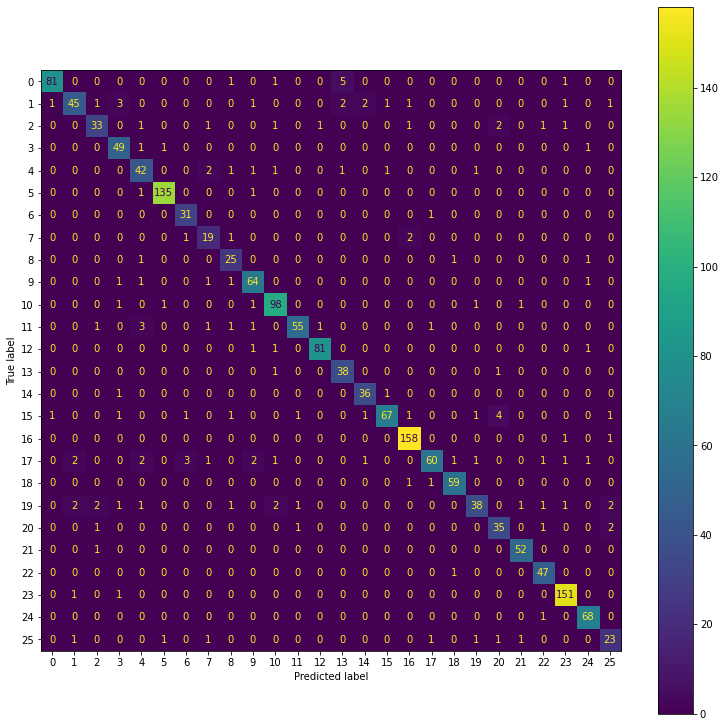

In [54]:
print("Confusion Matrix for *Testing Data")
print("\nLabels:", classes)
cnf_matrix = metrics.confusion_matrix(y_hat_train, y_train)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)

# Note: from this we can observe that the sign for 8 and the sign for 'no' are easily mixed up by the algo

## Dimensionality Reduction
### analysis of basic PCA & tSNE

In [20]:
# PCA
from sklearn.decomposition import PCA
import plotly.express as px

n = 2
pca_model = PCA(n_components=n)  # 5 fingers
pca_model.fit(X_train)#, y_train)

X_train_new = pca_model.transform(X_train)
col_labels = [f"PCA {i+1} ({var:.1f}%)" for i, var in enumerate(pca_model.explained_variance_ratio_ * 100)]

temp_data = np.hstack((X_train_new, y_train))
df = pd.DataFrame(data=temp_data, columns=col_labels+["sign_type"])
print("Data after dimensionality reduction:\n", df)

fig = px.scatter_matrix(
    df,
    dimensions=col_labels,
    color="sign_type"
)
fig.update_traces(diagonal_visible=False)
print("\n - Principle Component Analysis for", n, "Discrete Clusters:")
fig.show()
print('\n')

# print("Explained Variance:", pca.explained_variance_ratio_)
# y_hat_svm = clf.predict(X_test)  # X_train
# print("Metrics for Testing data")
# print(metrics.classification_report(y_test, y_hat_svm))
# print("Confusion Matrix for *Testing Data")
# cnf_matrix = metrics.confusion_matrix(y_hat_svm, y_test)
# metrics.ConfusionMatrixDisplay(cnf_matrix).plot()

Data after dimensionality reduction:
              PCA 1 (33.2%)          PCA 2 (31.7%)   sign_type
0     -0.26186077754230147   -0.03605387944071967           5
1      -0.0624319209588404    0.19715450950159788  little bit
2     -0.43801470380457874     0.2877374400406139         bye
3      0.06540164972422757    -0.6731292574039248        good
4      -0.8079254664232782      0.649055845609397           0
...                    ...                    ...         ...
1729     1.091364053023111    0.41323086398665376      pardon
1730   -0.2570525078475298     0.2501786613797607           b
1731   -0.2992010319342771  -0.039830506127346454           5
1732   -0.6713020755448005   -0.05516928514478748           e
1733   0.08454890632163262     0.5593093743288838      please

[1734 rows x 3 columns]

 - Principle Component Analysis for 2 Discrete Clusters:


In [ ]:
# tSNE
elif model_type == "TSNE":
    X_new = sklearn.manifold.TSNE(n_components=n, learning_rate='auto', init='random').fit_transform(X_red)
    # Note: experimentation with perplixity yields similar results (perplexity=(X_red.shape[0]/len(target_key)))
    col_labels = [model_type+" "+str(i) for i in range(X_new.shape[1])]
# TODO

## Neural Network Interpretability

In [113]:
# General SHAP
!pip install shap
import shap

     |████████████████████████████████| 436 kB 8.7 MB/s eta 0:00:01


In [120]:
exp = shap.Explainer(nn_clf.predict, output_names=attribute_decoder[:, 2:])
shap_values = exp(X_train)
print("Shap Values:\n", shap_values)
shap.summary_plot(shap_values)

TypeError: 'NoneType' object is not callable

In [ ]:
for classification in letters:
    if classification != "NULL":
        print("\nShap Values for Class:", classification)
        shap.plots.bar(shap_values[:,:, classification].mean(0))

In [ ]:
# InterpretML --> https://github.com/interpretml/interpret
!pip install interpret
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

In [ ]:
ebm = ExplainableBoostingClassifier()
ebm.fit(X_train, y_train)

In [ ]:
ebm_global = ebm.explain_global()
show(ebm_global)

In [ ]:
ebm_local = ebm.explain_local(X_test, y_test)
show(ebm_local)

In [ ]:
show([logistic_regression_global, decision_tree_global])

# Choosing Optimal Algorithm

In [121]:
print("NN:", nn_clf.score(X_val, y_val))
print("SVM:", svm_clf.score(X_val, y_val))
print("LogReg:", logreg_clf.score(X_val, y_val))

NN: 0.8480138169257341
SVM: 0.8203799654576857
LogReg: 0.687392055267703


Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.
Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.


In [ ]:
best_model = nn_clf  # most accurate choice

## Testing From Our Data

In [21]:
from sklearn.neural_network import MLPClassifier
"""
Best Result: {'accuracy': 98.27288428324698, 'activation': 'tanh', 'structure': [63, 51, 39, 27], 
'init_learning_rate': 0.0016, 'learning_type': 'constant', 'regulizer': 0.03, 
'model': MLPClassifier(activation='tanh', alpha=0.03, hidden_layer_sizes=[51, 39],
              learning_rate_init=0.0016, max_iter=400, solver='lbfgs')}
"""
best_model = MLPClassifier(solver='lbfgs', activation='tanh', 
                                        learning_rate_init=0.004, learning_rate='adaptive',
                                        alpha=0.4, max_iter=10000,
                                        hidden_layer_sizes=[36])
best_model.fit(X_train, y_train)

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1109: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



MLPClassifier(activation='tanh', alpha=0.4, hidden_layer_sizes=[36],
              learning_rate='adaptive', learning_rate_init=0.004,
              max_iter=10000, solver='lbfgs')

In [22]:
# reload
testing_dataset = np.load(save_test_results+".npy")
print(testing_dataset)
counter_after_test_processing = len(test_images)+1
print("Total images loaded:", testing_dataset.shape)

# testing_dataset = np.delete(testing_dataset, (0), axis=1)
print(testing_dataset)

[['1' 'b' '0.3964062035083771' ... '0.4469251036643982'
  '0.27895665168762207' '-0.048183050006628036']
 ['2' 'a' '0.5397152304649353' ... '0.5071197748184204'
  '0.6244933009147644' '-0.0010223040590062737']
 ['3' '3' '0.6293796896934509' ... '0.6812839508056641'
  '0.7319893836975098' '-0.04643464833498001']
 ...
 ['1269' 'e' '0.557081401348114' ... '0.5100159645080566'
  '0.48228058218955994' '0.007078072056174278']
 ['1270' 'a' '0.532738447189331' ... '0.5130353569984436'
  '0.5815353989601135' '0.00015242386143654585']
 ['1271' 'b' '0.39213827252388' ... '0.46315693855285645'
  '0.3094737231731415' '-0.012809917330741882']]
Total images loaded: (1269, 65)
[['1' 'b' '0.3964062035083771' ... '0.4469251036643982'
  '0.27895665168762207' '-0.048183050006628036']
 ['2' 'a' '0.5397152304649353' ... '0.5071197748184204'
  '0.6244933009147644' '-0.0010223040590062737']
 ['3' '3' '0.6293796896934509' ... '0.6812839508056641'
  '0.7319893836975098' '-0.04643464833498001']
 ...
 ['1269' 'e'

In [23]:
X_homebrew = testing_dataset[:, 2:]
y_homebrew = testing_dataset[:, 1]
print(X_homebrew)
print(y_homebrew)
print()
print(get_dist(y_homebrew))

[['0.3964062035083771' '0.6839089393615723' '3.4944815752169234e-07' ...
  '0.4469251036643982' '0.27895665168762207' '-0.048183050006628036']
 ['0.5397152304649353' '0.7516660690307617' '-4.2722058424260467e-07' ...
  '0.5071197748184204' '0.6244933009147644' '-0.0010223040590062737']
 ['0.6293796896934509' '0.9175158143043518' '9.31886745547672e-07' ...
  '0.6812839508056641' '0.7319893836975098' '-0.04643464833498001']
 ...
 ['0.557081401348114' '0.6657304763793945' '-2.687199014417274e-07' ...
  '0.5100159645080566' '0.48228058218955994' '0.007078072056174278']
 ['0.532738447189331' '0.7185418605804443' '-5.084274334876682e-07' ...
  '0.5130353569984436' '0.5815353989601135' '0.00015242386143654585']
 ['0.39213827252388' '0.6930208802223206' '6.227948006198858e-07' ...
  '0.46315693855285645' '0.3094737231731415' '-0.012809917330741882']]
['b' 'a' '3' ... 'e' 'a' 'b']

{'b': 187, 'a': 182, '4': 86, '3': 76, 'c': 75, '8': 72, '9': 72, '2': 69, '5': 69, '7': 67, 'e': 67, '0': 66, '6'

In [24]:
# Assessing accuracies
y_hat_train = best_model.predict(X_train)
acc0 = accuracy_score(y_train, y_hat_train) * 100
print("Best Model Training Accuracy:", acc0)

y_hat_kaggle = best_model.predict(X_test)
acc1 = accuracy_score(y_test, y_hat_kaggle) * 100
print("Best Model Kaggle-Testing Accuracy:", acc1)


y_hat_homebrew = best_model.predict(X_homebrew)
acc2 = accuracy_score(y_homebrew, y_hat_homebrew) * 100
print("Best Model Homebrew-Testing Accuracy:", acc2)  # note; either something was processed wrong or ...

Best Model Training Accuracy: 96.1361014994233
Best Model Kaggle-Testing Accuracy: 84.11053540587218
Best Model Homebrew-Testing Accuracy: 41.05594956658786


/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Confusion matrix for kaggle testing

Labels: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'bye': 15, 'good': 16, 'good morning': 17, 'hello': 18, 'little bit': 19, 'no': 20, 'pardon': 21, 'please': 22, 'project': 23, 'whats up': 24, 'yes': 25, 'NULL': 26}


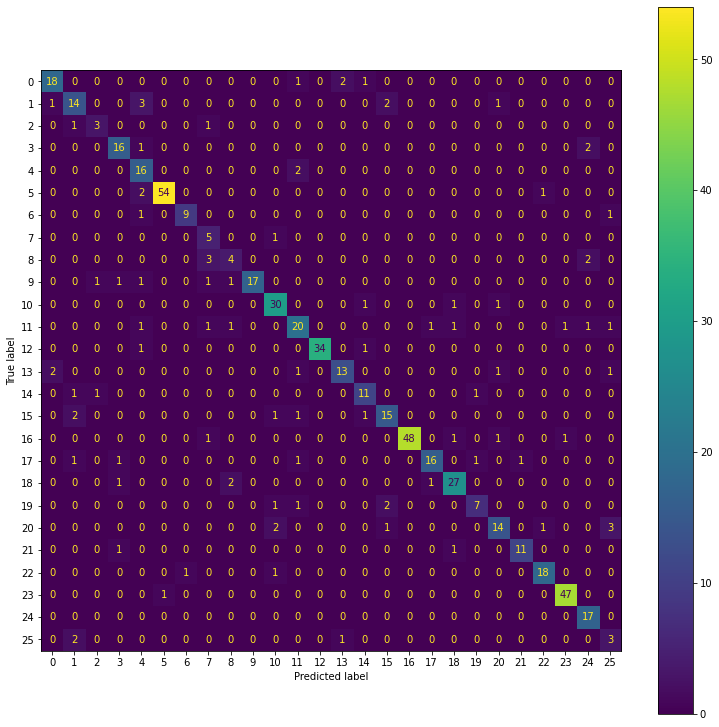

In [25]:
print("Confusion matrix for kaggle testing")
print("\nLabels:", classes)
cnf_matrix = metrics.confusion_matrix(y_hat_kaggle, y_test)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)

Confusion matrix for homebrew testing

Labels: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'bye': 15, 'good': 16, 'good morning': 17, 'hello': 18, 'little bit': 19, 'no': 20, 'pardon': 21, 'please': 22, 'project': 23, 'whats up': 24, 'yes': 25, 'NULL': 26}


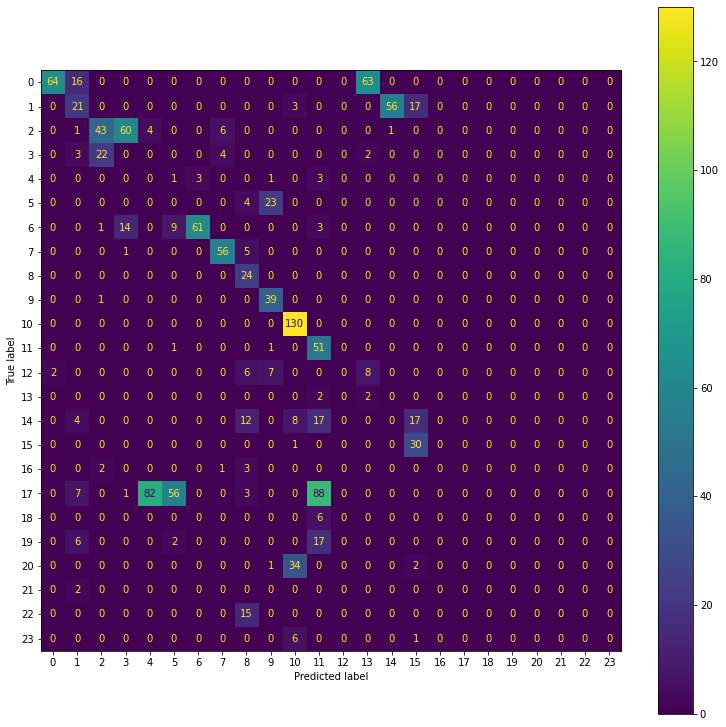

In [26]:
print("Confusion matrix for homebrew testing")
print("\nLabels:", classes)
cnf_matrix = metrics.confusion_matrix(y_hat_homebrew, y_homebrew)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Best Model Training Accuracy2: 97.57373929590865
Best Model Testing Accuracy2: 89.45615982241954
Confusion matrix for homebrew testing

Labels: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9, 'a': 10, 'b': 11, 'c': 12, 'd': 13, 'e': 14, 'bye': 15, 'good': 16, 'good morning': 17, 'hello': 18, 'little bit': 19, 'no': 20, 'pardon': 21, 'please': 22, 'project': 23, 'whats up': 24, 'yes': 25, 'NULL': 26}


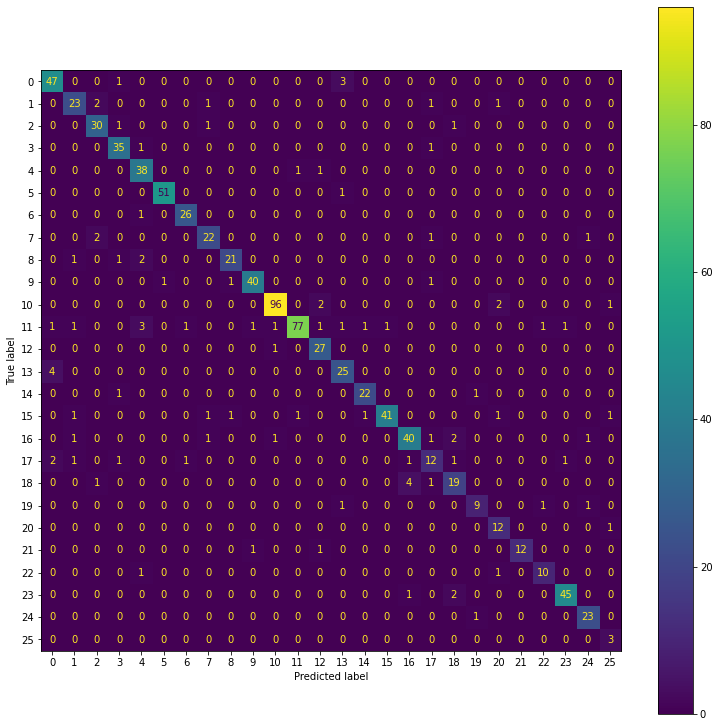

In [27]:
# testing how algo is when we use both kaggle and homebrew data
X_composite = np.vstack((X_train, X_homebrew))
y_composite = np.concatenate([y_train.reshape(1,-1)[0], y_homebrew.reshape(1,-1)[0]])
X_train2, X_test2, y_train2, y_test2 = train_test_split(X_composite, y_composite, test_size=0.3)

best_model.fit(X_train2, y_train2)

y_hat_comp1 = best_model.predict(X_train2)
acc3 = accuracy_score(y_train2, y_hat_comp1) * 100
print("Best Model Training Accuracy2:", acc3)
y_hat_comp2 = best_model.predict(X_test2)
acc3 = accuracy_score(y_test2, y_hat_comp2) * 100
print("Best Model Testing Accuracy2:", acc3)

print("Confusion matrix for homebrew testing")
print("\nLabels:", classes)
cnf_matrix = metrics.confusion_matrix(y_hat_comp2, y_test2)
cmp = metrics.ConfusionMatrixDisplay(cnf_matrix)
fig, ax = plt.subplots(figsize=(13,13))
cmp.plot(ax=ax)

In [59]:
# reload training data to store image num of hand
training_data_dirs = [save_train+file for file in os.listdir(save_train) if "processed_train_data-chunk" in file]
chunk_composite = np.ones((1, num_features+2))
for train_dir in training_data_dirs:
    data_to_add = np.load(train_dir)
    chunk_composite = np.vstack((chunk_composite, data_to_add))
training_dataset = np.delete(chunk_composite, (0), axis=0)  # take dummy row from data

all_dataset = np.vstack((np.load(save_test_results+".npy"), training_dataset))  # composite homebrew & training
print("Composite Dataset:\n", all_dataset)

Composite Dataset:
 [['1' 'b' '0.3964062035083771' ... '0.4469251036643982'
  '0.27895665168762207' '-0.048183050006628036']
 ['2' 'a' '0.5397152304649353' ... '0.5071197748184204'
  '0.6244933009147644' '-0.0010223040590062737']
 ['3' '3' '0.6293796896934509' ... '0.6812839508056641'
  '0.7319893836975098' '-0.04643464833498001']
 ...
 ['4174' 'project' '0.827033281326294' ... '0.3326241374015808'
  '0.643967866897583' '-0.06480514258146286']
 ['4185' 'whats up' '0.4761280417442322' ... '0.30661413073539734'
  '0.24892805516719818' '-0.08135085552930832']
 ['4194' 'project' '0.8161284923553467' ... '0.220038503408432'
  '0.6012241840362549' '-0.05777936056256294']]


In [81]:
def get_best_hands():
    training_copy = all_dataset.copy() # might have to prune this so we make a copy just in case
    hand_probas = best_model.predict_proba(training_copy[:, 2:])
    best_hands = []
    for i in range(len(letters)-1):  # -1 for notna case 
        has_found = False
        while has_found == False:
            best_ind = np.argmax(hand_probas[:, i])
            best_info_dict = {'sign': letters[i], 'image_dir': images_ref[int(training_copy[best_ind][0])],
                               'probabilities': hand_probas[best_ind], 'attributes': training_copy[best_ind]}
            actual_class = get_target(best_info_dict['image_dir'])
#             print(letters[i], "vs.", actual_class)
            if actual_class == letters[i]:  # get only the most confident guesses of the correct classifications
                best_hands.append(best_info_dict)
                has_found = True
            else:
                hand_probas = np.delete(hand_probas, (best_ind), axis=0)
                training_copy = np.delete(training_copy, (best_ind), axis=0)
    return best_hands

# show resultant data & hand images
best_signs = get_best_hands()
# print(best_signs[0], '\n')

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



image_name,y_algorithm,confidence,WRIST.z,THUMB_CMC.x,THUMB_CMC.y,THUMB_CMC.z,THUMB_MCP.x,THUMB_MCP.y,THUMB_MCP.z,THUMB_IP.x,THUMB_IP.y,THUMB_IP.z,THUMB_TIP.x,THUMB_TIP.y,THUMB_TIP.z,INDEX_FINGER_MCP.x,INDEX_FINGER_MCP.y,INDEX_FINGER_MCP.z,INDEX_FINGER_PIP.x,INDEX_FINGER_PIP.y,INDEX_FINGER_PIP.z,INDEX_FINGER_DIP.x,INDEX_FINGER_DIP.y,INDEX_FINGER_DIP.z,INDEX_FINGER_TIP.x,INDEX_FINGER_TIP.y,INDEX_FINGER_TIP.z,MIDDLE_FINGER_MCP.x,MIDDLE_FINGER_MCP.y,MIDDLE_FINGER_MCP.z,MIDDLE_FINGER_PIP.x,MIDDLE_FINGER_PIP.y,MIDDLE_FINGER_PIP.z,MIDDLE_FINGER_DIP.x,MIDDLE_FINGER_DIP.y,MIDDLE_FINGER_DIP.z,MIDDLE_FINGER_TIP.x,MIDDLE_FINGER_TIP.y,MIDDLE_FINGER_TIP.z,RING_FINGER_MCP.x,RING_FINGER_MCP.y,RING_FINGER_MCP.z,RING_FINGER_PIP.x,RING_FINGER_PIP.y,RING_FINGER_PIP.z,RING_FINGER_DIP.x,RING_FINGER_DIP.y,RING_FINGER_DIP.z,RING_FINGER_TIP.x,RING_FINGER_TIP.y,RING_FINGER_TIP.z,PINKY_MCP.x,PINKY_MCP.y,PINKY_MCP.z,PINKY_PIP.x,PINKY_PIP.y,PINKY_PIP.z,PINKY_DIP.x,PINKY_DIP.y,PINKY_DIP.z,PINKY_TIP.x,PINKY_TIP.y,P

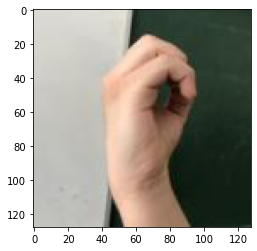

Sign Data:
 ['0.490159273147583' '0.7038196325302124' '-9.982804272112844e-08'
 '0.6201262474060059' '0.5739663243293762' '0.0395202599465847'
 '0.6574819684028625' '0.4518112540245056' '0.028390802443027496'
 '0.7039021253585815' '0.3659239709377289' '-0.007059501018375158'
 '0.6986866593360901' '0.31492772698402405' '-0.03565116971731186'
 '0.390194296836853' '0.3013142943382263' '0.037287142127752304'
 '0.5084739923477173' '0.15561628341674805' '-0.023760225623846054'
 '0.6271234750747681' '0.1892741173505783' '-0.07251232862472534'
 '0.6840611696243286' '0.26467645168304443' '-0.09501053392887115'
 '0.36291489005088806' '0.3164966106414795' '-0.02009500376880169'
 '0.5209606289863586' '0.1349078118801117' '-0.06844545900821686'
 '0.6470565795898438' '0.18886798620224' '-0.08704257011413574'
 '0.690170407295227' '0.27214452624320984' '-0.09102446585893631'
 '0.3789103627204895' '0.34705525636672974' '-0.08146410435438156'
 '0.5396673083305359' '0.1575469970703125' '-0.12454412132501

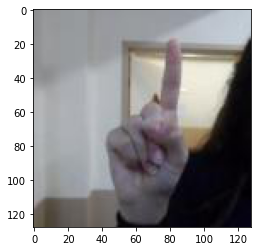

Sign Data:
 ['0.5290880799293518' '0.8125529289245605' '3.7244578265926975e-07'
 '0.6103029251098633' '0.7867230176925659' '-0.049109917134046555'
 '0.6623013615608215' '0.6705594062805176' '-0.07445020973682404'
 '0.6282519102096558' '0.5789203643798828' '-0.09920503944158554'
 '0.5510678291320801' '0.5301843285560608' '-0.12529630959033966'
 '0.612768828868866' '0.5101361870765686' '-0.05186057090759277'
 '0.6282825469970703' '0.36219048500061035' '-0.09744041413068771'
 '0.6400830745697021' '0.2615092992782593' '-0.12572962045669556'
 '0.6432700753211975' '0.1821170449256897' '-0.1456170678138733'
 '0.529058039188385' '0.5284528732299805' '-0.05827013775706291'
 '0.5261293649673462' '0.4657132923603058' '-0.14176242053508759'
 '0.5521148443222046' '0.559186577796936' '-0.16710016131401062'
 '0.5673114061355591' '0.6371747851371765' '-0.16398516297340393'
 '0.45298779010772705' '0.5682767033576965' '-0.06840279698371887'
 '0.4589270353317261' '0.5369977951049805' '-0.1553579121828079

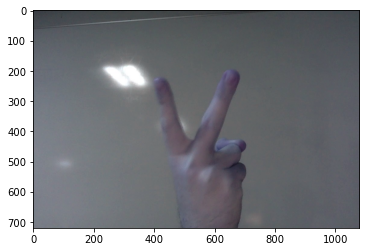

Sign Data:
 ['0.5352684259414673' '1.0094321966171265' '1.1183324204466771e-06'
 '0.5014016628265381' '0.8599246144294739' '0.05703863129019737'
 '0.5230017900466919' '0.7376235723495483' '0.038891371339559555'
 '0.5731517672538757' '0.6634983420372009' '0.015394839458167553'
 '0.6188634037971497' '0.6078635454177856' '-0.0035419997293502092'
 '0.44930341839790344' '0.6863576769828796' '-0.0742533877491951'
 '0.42181456089019775' '0.5314517021179199' '-0.1127953752875328'
 '0.4006817936897278' '0.43128854036331177' '-0.1457284390926361'
 '0.3870653212070465' '0.3407994508743286' '-0.1750078946352005'
 '0.492355078458786' '0.7097405791282654' '-0.1110900267958641'
 '0.5417888164520264' '0.51997309923172' '-0.16453817486763'
 '0.5823813676834106' '0.3968660831451416' '-0.19709651172161102'
 '0.6141893863677979' '0.3070383369922638' '-0.22583544254302979'
 '0.5419667363166809' '0.743116021156311' '-0.12837138772010803'
 '0.6121796369552612' '0.6362006068229675' '-0.10855959355831146'
 '0.

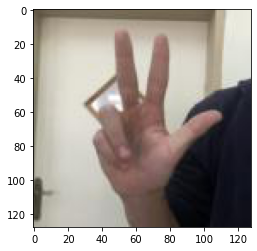

Sign Data:
 ['0.4792401194572449' '0.7990900278091431' '1.8408594542052015e-06'
 '0.5823595523834229' '0.7452003359794617' '-0.06771562248468399'
 '0.6556768417358398' '0.6275205612182617' '-0.09996236115694046'
 '0.7384744882583618' '0.5448179244995117' '-0.13276341557502747'
 '0.822360634803772' '0.4964144825935364' '-0.16790339350700378'
 '0.5496463179588318' '0.4847048819065094' '-0.05962888151407242'
 '0.5650157332420349' '0.3382061719894409' '-0.11748991906642914'
 '0.571089506149292' '0.23927754163742065' '-0.153597891330719'
 '0.5795251131057739' '0.15501457452774048' '-0.17270901799201965'
 '0.4577125012874603' '0.4894444942474365' '-0.06317844986915588'
 '0.4317777454853058' '0.3450208604335785' '-0.13037797808647156'
 '0.40920376777648926' '0.23615261912345886' '-0.16974496841430664'
 '0.39526236057281494' '0.1467074453830719' '-0.18303462862968445'
 '0.3812401294708252' '0.5329362154006958' '-0.07372064888477325'
 '0.3481571078300476' '0.4719734191894531' '-0.17828194797039

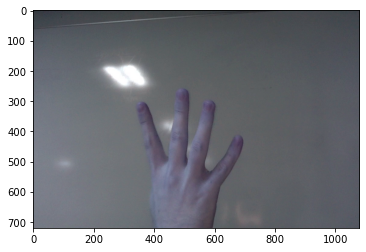

Sign Data:
 ['0.45178160071372986' '1.037630319595337' '3.0878581469551136e-07'
 '0.3947198987007141' '0.9190070629119873' '0.04557036608457565'
 '0.3850485384464264' '0.8106672763824463' '0.05560517683625221'
 '0.41490671038627625' '0.7243112325668335' '0.06261413544416428'
 '0.44589218497276306' '0.6717265248298645' '0.06791548430919647'
 '0.3867374062538147' '0.7459707260131836' '-0.04029553756117821'
 '0.3611924648284912' '0.6085522174835205' '-0.06902144849300385'
 '0.34396007657051086' '0.5121406316757202' '-0.08168230205774307'
 '0.32995542883872986' '0.44054946303367615' '-0.08828449249267578'
 '0.43173331022262573' '0.764677107334137' '-0.06798318028450012'
 '0.4453735649585724' '0.5850117206573486' '-0.1104586273431778'
 '0.4540666341781616' '0.46828752756118774' '-0.1302838772535324'
 '0.4591573476791382' '0.3853831887245178' '-0.1395939141511917'
 '0.481392502784729' '0.7956390380859375' '-0.0859038308262825'
 '0.5100210309028625' '0.6299401521682739' '-0.12796610593795776'

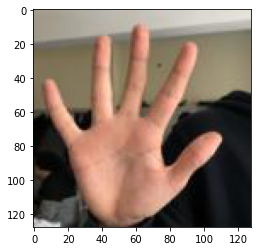

Sign Data:
 ['0.39838120341300964' '0.9445551633834839' '1.516765678388765e-06'
 '0.5283278226852417' '0.8935777544975281' '-0.09097812324762344'
 '0.6358070373535156' '0.7857348322868347' '-0.13943934440612793'
 '0.7228233814239502' '0.6856603622436523' '-0.17896315455436707'
 '0.8150376081466675' '0.615875244140625' '-0.21918395161628723'
 '0.5389853715896606' '0.5545759797096252' '-0.11378192901611328'
 '0.6262847781181335' '0.40027087926864624' '-0.1836923062801361'
 '0.677137017250061' '0.2940557599067688' '-0.23490510880947113'
 '0.7125828266143799' '0.20297998189926147' '-0.27129897475242615'
 '0.4292985200881958' '0.5270014405250549' '-0.1179066151380539'
 '0.4618138372898102' '0.34217923879623413' '-0.17879921197891235'
 '0.4790215492248535' '0.22118207812309265' '-0.22304871678352356'
 '0.4902498424053192' '0.1197148859500885' '-0.2536155581474304'
 '0.3235766291618347' '0.5539487600326538' '-0.13114891946315765'
 '0.31571611762046814' '0.3814427852630615' '-0.195749238133430

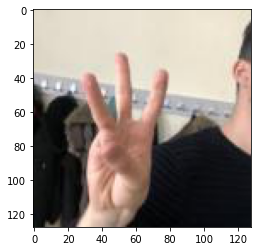

Sign Data:
 ['0.373008131980896' '0.850959837436676' '1.2676409824052826e-06'
 '0.4484124183654785' '0.8360042572021484' '-0.07029086351394653'
 '0.4814986288547516' '0.7667734622955322' '-0.10119441896677017'
 '0.42042818665504456' '0.7038895487785339' '-0.12091012299060822'
 '0.3415225148200989' '0.6548309922218323' '-0.14174243807792664'
 '0.5000166893005371' '0.573758065700531' '-0.07397103309631348'
 '0.546411395072937' '0.4509859085083008' '-0.10952407866716385'
 '0.5734674334526062' '0.3771112561225891' '-0.13433444499969482'
 '0.5891008973121643' '0.3106842041015625' '-0.15199896693229675'
 '0.4182223677635193' '0.5533934831619263' '-0.0722474604845047'
 '0.416583776473999' '0.4034267067909241' '-0.10474032908678055'
 '0.41086673736572266' '0.3102378249168396' '-0.1342749297618866'
 '0.4024755656719208' '0.2358907163143158' '-0.15060558915138245'
 '0.3505721688270569' '0.5857911705970764' '-0.07617876678705215'
 '0.3073248267173767' '0.4770849943161011' '-0.1344439685344696'
 '

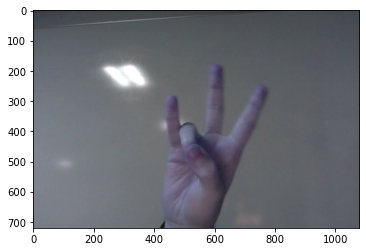

Sign Data:
 ['0.46343478560447693' '0.9444619417190552' '1.0301116617483785e-06'
 '0.5223149061203003' '0.9138987064361572' '-0.07368188351392746'
 '0.5518726706504822' '0.8112635612487793' '-0.10196452587842941'
 '0.5290127396583557' '0.7112278938293457' '-0.12200585007667542'
 '0.4898132383823395' '0.6286654472351074' '-0.13709262013435364'
 '0.5956946015357971' '0.651453971862793' '-0.046916667371988297'
 '0.6510483026504517' '0.530082643032074' '-0.07508271187543869'
 '0.6814327239990234' '0.4417688846588135' '-0.09323273599147797'
 '0.700667142868042' '0.3735365867614746' '-0.10147850215435028'
 '0.5425060391426086' '0.6241998076438904' '-0.03185729309916496'
 '0.5553531050682068' '0.47389811277389526' '-0.06882903724908829'
 '0.5620180368423462' '0.36351627111434937' '-0.09596312791109085'
 '0.5625364780426025' '0.27567535638809204' '-0.10672261565923691'
 '0.49071767926216125' '0.6297545433044434' '-0.02509535662829876'
 '0.4773472249507904' '0.5517951846122742' '-0.082226939499

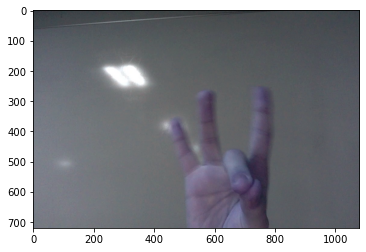

Sign Data:
 ['0.580840528011322' '1.1107722520828247' '2.6166404154537304e-07'
 '0.6440412402153015' '1.071886658668518' '-0.06532608717679977'
 '0.6764737963676453' '0.984218955039978' '-0.11289176344871521'
 '0.6767230033874512' '0.8988075256347656' '-0.15392155945301056'
 '0.651104748249054' '0.8210400938987732' '-0.19094134867191315'
 '0.6768482327461243' '0.7641202211380005' '-0.06534519791603088'
 '0.6936964392662048' '0.599907398223877' '-0.10748861730098724'
 '0.7029199004173279' '0.4811895787715912' '-0.13034164905548096'
 '0.6984255909919739' '0.3954477608203888' '-0.1453404575586319'
 '0.6134295463562012' '0.7580578327178955' '-0.06278122961521149'
 '0.6116892695426941' '0.6493831872940063' '-0.143141970038414'
 '0.6265170574188232' '0.7501792907714844' '-0.16073305904865265'
 '0.6396632790565491' '0.8343530893325806' '-0.14731405675411224'
 '0.5529769659042358' '0.7632863521575928' '-0.06910313665866852'
 '0.5378734469413757' '0.6131733059883118' '-0.1183520033955574'
 '0.5

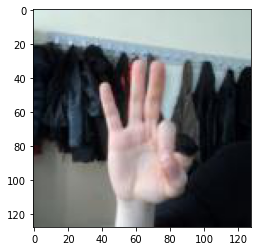

Sign Data:
 ['0.48054417967796326' '0.8683905601501465' '2.2879737571201986e-07'
 '0.5644202828407288' '0.8581143617630005' '-0.06552349030971527'
 '0.6484730839729309' '0.8070979118347168' '-0.10475825518369675'
 '0.6733772158622742' '0.7557801008224487' '-0.13936719298362732'
 '0.6475116014480591' '0.7046175599098206' '-0.1671571582555771'
 '0.6066372394561768' '0.5983848571777344' '-0.060467351227998734'
 '0.6197150945663452' '0.5331346988677979' '-0.1350957751274109'
 '0.6037132740020752' '0.6105809807777405' '-0.19220459461212158'
 '0.5836267471313477' '0.6825705766677856' '-0.21780787408351898'
 '0.5373221039772034' '0.5612841248512268' '-0.060160525143146515'
 '0.5529390573501587' '0.4288066625595093' '-0.1029113382101059'
 '0.5592836141586304' '0.3487187623977661' '-0.1378466933965683'
 '0.5657792091369629' '0.2721027731895447' '-0.1608269363641739'
 '0.4626721739768982' '0.5615638494491577' '-0.07139173150062561'
 '0.47007644176483154' '0.4279772639274597' '-0.1119607761502265

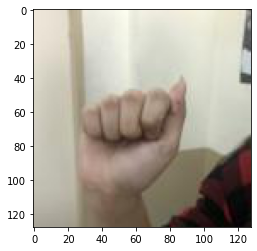

Sign Data:
 ['0.35558345913887024' '0.7961512804031372' '-8.540737326256931e-07'
 '0.49168485403060913' '0.7895632982254028' '-0.0748085230588913'
 '0.6332632899284363' '0.6276257038116455' '-0.07724277675151825'
 '0.6696479916572571' '0.46397992968559265' '-0.065788134932518'
 '0.6708765029907227' '0.3574572205543518' '-0.03594803065061569'
 '0.5678343176841736' '0.48858642578125' '-0.03378937393426895'
 '0.5663089752197266' '0.3961520195007324' '-0.09697633981704712'
 '0.54471355676651' '0.5246047973632812' '-0.11582101136445999'
 '0.5422452092170715' '0.5614237785339355' '-0.11808740347623825'
 '0.46626198291778564' '0.48511821031570435' '-0.013579479418694973'
 '0.460991233587265' '0.40547341108322144' '-0.07589507102966309'
 '0.4529566168785095' '0.5575826168060303' '-0.07342863082885742'
 '0.46160829067230225' '0.5619279742240906' '-0.05615878477692604'
 '0.3759250044822693' '0.4922802448272705' '-0.008953128010034561'
 '0.3643335700035095' '0.42878156900405884' '-0.0801611691713

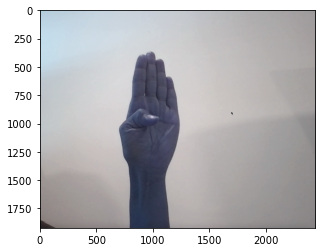

Sign Data:
 ['0.38991498947143555' '0.702360987663269' '7.587385084661946e-07'
 '0.3251015543937683' '0.633533239364624' '-0.04035917669534683'
 '0.3152822256088257' '0.5441622138023376' '-0.051283176988363266'
 '0.3701936602592468' '0.4974045753479004' '-0.057712703943252563'
 '0.4217248558998108' '0.4960108697414398' '-0.061944629997015'
 '0.3550703525543213' '0.43189945816993713' '0.008731909096240997'
 '0.360574334859848' '0.3332497477531433' '0.010901199653744698'
 '0.36596423387527466' '0.2731698751449585' '-0.0005258457385934889'
 '0.3717900812625885' '0.22386151552200317' '-0.012919407337903976'
 '0.4024360775947571' '0.4372488260269165' '0.018155450001358986'
 '0.4019226133823395' '0.33167386054992676' '0.026687584817409515'
 '0.4004862606525421' '0.2641080915927887' '0.015186592005193233'
 '0.3999175727367401' '0.20974430441856384' '0.0035466758999973536'
 '0.438717782497406' '0.4578569829463959' '0.02090742625296116'
 '0.44246378540992737' '0.36005696654319763' '0.0289096478

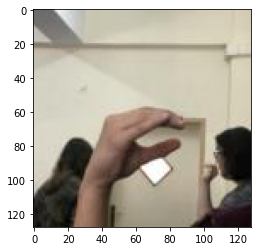

Sign Data:
 ['0.45158272981643677' '0.74321448802948' '6.231705356185557e-07'
 '0.5747321844100952' '0.6860436201095581' '-0.043434761464595795'
 '0.6648045182228088' '0.5580209493637085' '-0.041878536343574524'
 '0.6744791269302368' '0.4519498646259308' '-0.03796374425292015'
 '0.6381512880325317' '0.3826450705528259' '-0.032005757093429565'
 '0.5716225504875183' '0.4202294945716858' '0.01984252594411373'
 '0.5857510566711426' '0.32143378257751465' '-0.003906733822077513'
 '0.6056181788444519' '0.26591548323631287' '-0.0333566851913929'
 '0.6281968951225281' '0.2301224172115326' '-0.05259065702557564'
 '0.49886688590049744' '0.40010470151901245' '0.024605946615338326'
 '0.5120810270309448' '0.28983360528945923' '0.006427071988582611'
 '0.5307211875915527' '0.2409139722585678' '-0.01977415382862091'
 '0.5545949935913086' '0.2221032977104187' '-0.03593164309859276'
 '0.4282923936843872' '0.40310055017471313' '0.01844683848321438'
 '0.4358515739440918' '0.2914851903915405' '-0.0040419124

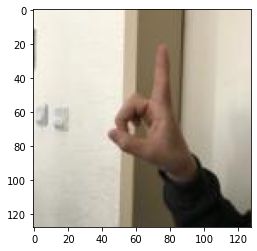

Sign Data:
 ['0.21927404403686523' '0.733837366104126' '8.479722737320117e-07'
 '0.3716297149658203' '0.6992675065994263' '0.026316098868846893'
 '0.49083495140075684' '0.621326208114624' '0.018357954919338226'
 '0.5971025824546814' '0.5840992331504822' '-0.008669107221066952'
 '0.691647469997406' '0.5417268872261047' '-0.03743999823927879'
 '0.38286906480789185' '0.4080372452735901' '0.03774791583418846'
 '0.4740365147590637' '0.27228981256484985' '-0.004991630092263222'
 '0.5727728605270386' '0.2736591696739197' '-0.0398310124874115'
 '0.6454780697822571' '0.3109844923019409' '-0.06136251613497734'
 '0.35608410835266113' '0.40414705872535706' '-0.012258660979568958'
 '0.46360456943511963' '0.25239044427871704' '-0.05795052647590637'
 '0.5800807476043701' '0.26880645751953125' '-0.09522048383951187'
 '0.6516899466514587' '0.3258192539215088' '-0.11733948439359665'
 '0.3373517394065857' '0.42188960313796997' '-0.06686936318874359'
 '0.43872588872909546' '0.2663693428039551' '-0.1053228

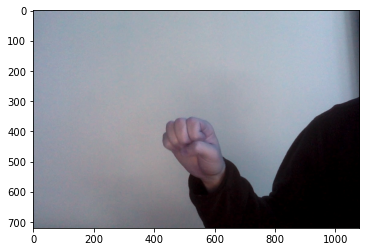

Sign Data:
 ['0.503507673740387' '0.803955078125' '-5.713301831633544e-08'
 '0.44504761695861816' '0.7765570878982544' '-0.039688631892204285'
 '0.3789348006248474' '0.7149540781974792' '-0.05554460734128952'
 '0.31143468618392944' '0.6640714406967163' '-0.07147077471017838'
 '0.2569388151168823' '0.6178771257400513' '-0.08328916132450104'
 '0.4855595827102661' '0.5726783871650696' '-0.004507105797529221'
 '0.5099489092826843' '0.47560805082321167' '-0.04084759205579758'
 '0.5063839554786682' '0.4242951273918152' '-0.07142551988363266'
 '0.516227126121521' '0.3952676057815552' '-0.08856044709682465'
 '0.4750075340270996' '0.5577054023742676' '-0.004342436324805021'
 '0.38656967878341675' '0.47593432664871216' '-0.056789614260196686'
 '0.31939977407455444' '0.5204263925552368' '-0.08668186515569687'
 '0.3061315417289734' '0.5819312334060669' '-0.09058665484189987'
 '0.4695914089679718' '0.5555945634841919' '-0.011923538520932198'
 '0.3804800510406494' '0.4727136790752411' '-0.0683132410

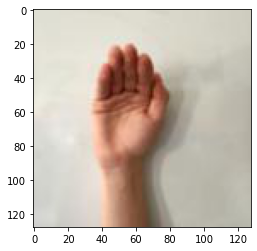

Sign Data:
 ['0.29459911584854126' '0.47225871682167053' '-2.2626207396569953e-07'
 '0.3445054292678833' '0.43948492407798767' '0.01710127852857113'
 '0.378924161195755' '0.3988022208213806' '0.022475799545645714'
 '0.40848931670188904' '0.36970481276512146' '0.019252948462963104'
 '0.4257582426071167' '0.3450019955635071' '0.0180850587785244'
 '0.3298262655735016' '0.3378402888774872' '0.038419242948293686'
 '0.3958301842212677' '0.3170493245124817' '0.025200270116329193'
 '0.41328391432762146' '0.3465592563152313' '0.012506091967225075'
 '0.40699905157089233' '0.3767728805541992' '0.007747743744403124'
 '0.326703816652298' '0.3318849205970764' '0.02400590293109417'
 '0.3976987600326538' '0.315221905708313' '0.015822770074009895'
 '0.41382497549057007' '0.3489963114261627' '0.009018529206514359'
 '0.40653130412101746' '0.3769305944442749' '0.0066675180569291115'
 '0.3285260498523712' '0.32990074157714844' '0.0071627493016421795'
 '0.3992910385131836' '0.3173586130142212' '0.0013903616

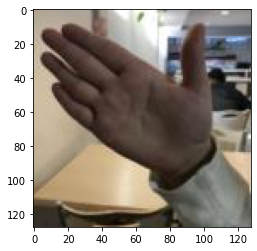

Sign Data:
 ['0.6800033450126648' '0.6447842121124268' '1.2045176163155702e-06'
 '0.7564831972122192' '0.5182400941848755' '-0.09259799122810364'
 '0.7548332214355469' '0.36927491426467896' '-0.13577349483966827'
 '0.737612247467041' '0.24329227209091187' '-0.16667164862155914'
 '0.7404886484146118' '0.1376500129699707' '-0.19576822221279144'
 '0.4797969162464142' '0.2958458364009857' '-0.0875120535492897'
 '0.34822872281074524' '0.1983494758605957' '-0.13562552630901337'
 '0.2558167278766632' '0.14241115748882294' '-0.17652244865894318'
 '0.17635218799114227' '0.09624707698822021' '-0.2065643072128296'
 '0.39176124334335327' '0.3672769069671631' '-0.07230202853679657'
 '0.24790158867835999' '0.261661171913147' '-0.1126776710152626'
 '0.15482664108276367' '0.18859758973121643' '-0.14697864651679993'
 '0.08014816045761108' '0.12589767575263977' '-0.17120897769927979'
 '0.34134000539779663' '0.45244529843330383' '-0.06595483422279358'
 '0.20718026161193848' '0.3573073148727417' '-0.10485

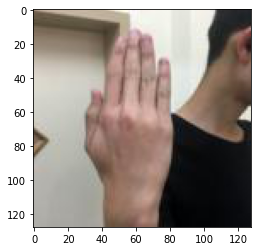

Sign Data:
 ['0.45613905787467957' '0.750789999961853' '8.866273901730892e-07'
 '0.33726656436920166' '0.6937789916992188' '-0.022420916706323624'
 '0.27091899514198303' '0.5883192420005798' '-0.04873232915997505'
 '0.26969462633132935' '0.4816087484359741' '-0.0711253359913826'
 '0.2830324172973633' '0.39844703674316406' '-0.09546619653701782'
 '0.3451967239379883' '0.48430830240249634' '-0.0853613018989563'
 '0.36675044894218445' '0.3117199242115021' '-0.13013313710689545'
 '0.3868311643600464' '0.21378588676452637' '-0.15174904465675354'
 '0.4032127261161804' '0.14082008600234985' '-0.16153863072395325'
 '0.4336692988872528' '0.48780661821365356' '-0.096798375248909'
 '0.44560617208480835' '0.30345624685287476' '-0.13703462481498718'
 '0.45445916056632996' '0.19360896944999695' '-0.1566830724477768'
 '0.45802566409111023' '0.11013361811637878' '-0.16653062403202057'
 '0.5164515972137451' '0.5063009858131409' '-0.10681740194559097'
 '0.5215141177177429' '0.3314425051212311' '-0.14080

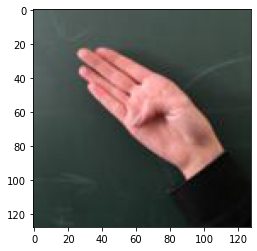

Sign Data:
 ['0.6854853630065918' '0.5774117112159729' '8.460268645649194e-07'
 '0.6812416315078735' '0.47271427512168884' '-0.042047977447509766'
 '0.6119225025177002' '0.40104496479034424' '-0.06530943512916565'
 '0.5249620676040649' '0.4259366989135742' '-0.08517764508724213'
 '0.4796610176563263' '0.49545586109161377' '-0.10704211890697479'
 '0.5484122633934021' '0.3454335629940033' '-0.05430503562092781'
 '0.444222092628479' '0.26696914434432983' '-0.09035244584083557'
 '0.37592828273773193' '0.22429615259170532' '-0.11645511537790298'
 '0.3190182149410248' '0.19487200677394867' '-0.13301248848438263'
 '0.4996227025985718' '0.3932759761810303' '-0.05758628994226456'
 '0.38567283749580383' '0.30481666326522827' '-0.08904705196619034'
 '0.3074210584163666' '0.24986982345581055' '-0.11375018954277039'
 '0.24293074011802673' '0.2097426950931549' '-0.12939123809337616'
 '0.46782979369163513' '0.4500320255756378' '-0.0647883266210556'
 '0.35744237899780273' '0.37310874462127686' '-0.089

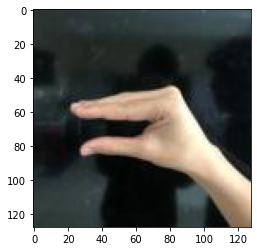

Sign Data:
 ['0.7228105664253235' '0.6555323004722595' '-3.7853786238883913e-07'
 '0.627092719078064' '0.6652224063873291' '-0.07936424016952515'
 '0.5050208568572998' '0.6402783393859863' '-0.12523269653320312'
 '0.39979833364486694' '0.6288487315177917' '-0.15708176791667938'
 '0.3183509111404419' '0.6201815605163574' '-0.18641190230846405'
 '0.6009785532951355' '0.443816602230072' '-0.11603202670812607'
 '0.44086790084838867' '0.4569843113422394' '-0.172561913728714'
 '0.32372790575027466' '0.4615848660469055' '-0.21444952487945557'
 '0.22835838794708252' '0.46383872628211975' '-0.24297353625297546'
 '0.6093838214874268' '0.4048304259777069' '-0.09799892455339432'
 '0.4397420287132263' '0.4231540560722351' '-0.16118818521499634'
 '0.3129104673862457' '0.43849536776542664' '-0.19900435209274292'
 '0.21704673767089844' '0.4536100924015045' '-0.2221851944923401'
 '0.611912190914154' '0.3890218436717987' '-0.08279182016849518'
 '0.45100975036621094' '0.41002002358436584' '-0.13408958911

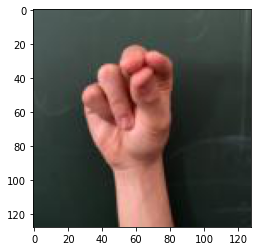

Sign Data:
 ['0.46122539043426514' '0.6884216070175171' '-1.5946567089031305e-07'
 '0.5367416143417358' '0.5949848294258118' '-0.07332716137170792'
 '0.5676109790802002' '0.48692232370376587' '-0.11560563743114471'
 '0.5442888140678406' '0.38778138160705566' '-0.156915545463562'
 '0.5164533853530884' '0.3022877871990204' '-0.19301116466522217'
 '0.5626087188720703' '0.3335244059562683' '-0.03628327697515488'
 '0.5906662940979004' '0.2475414127111435' '-0.11555664241313934'
 '0.5640738606452942' '0.23256663978099823' '-0.170297309756279'
 '0.5341101884841919' '0.25545820593833923' '-0.19535697996616364'
 '0.46774277091026306' '0.3369560241699219' '-0.03460291028022766'
 '0.4684014618396759' '0.187788188457489' '-0.12972308695316315'
 '0.4510897099971771' '0.20590348541736603' '-0.17038190364837646'
 '0.45205897092819214' '0.26842132210731506' '-0.17202164232730865'
 '0.3759934902191162' '0.3679960370063782' '-0.04568774998188019'
 '0.3562512695789337' '0.2916799783706665' '-0.1580692231

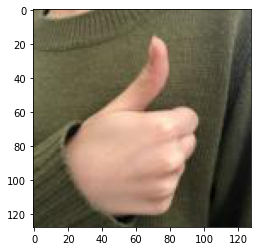

Sign Data:
 ['0.20680227875709534' '0.7608077526092529' '-9.62978447205387e-07'
 '0.2549552917480469' '0.5735154151916504' '-0.03871338069438934'
 '0.3796949088573456' '0.457439124584198' '-0.07287152856588364'
 '0.4936334490776062' '0.3534264862537384' '-0.10247787833213806'
 '0.5563703179359436' '0.24668791890144348' '-0.12648707628250122'
 '0.6093342304229736' '0.540693461894989' '-0.04204157739877701'
 '0.7180256247520447' '0.4953746199607849' '-0.06575699895620346'
 '0.650495707988739' '0.5030826330184937' '-0.0824679359793663'
 '0.567681610584259' '0.5228973031044006' '-0.08958742022514343'
 '0.6339861154556274' '0.6723750233650208' '-0.03480125963687897'
 '0.7086846232414246' '0.6196639537811279' '-0.03728729858994484'
 '0.641353964805603' '0.6080076694488525' '-0.04428917169570923'
 '0.570262610912323' '0.6212288737297058' '-0.05147240310907364'
 '0.6177120804786682' '0.7915819883346558' '-0.028993215411901474'
 '0.666872501373291' '0.7295960783958435' '-0.030392050743103027'
 

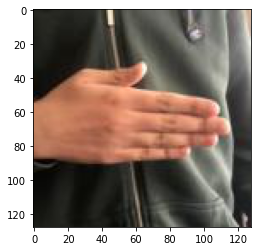

Sign Data:
 ['0.15382924675941467' '0.5313328504562378' '1.1629634855125914e-06'
 '0.18009397387504578' '0.39732176065444946' '-0.06227783113718033'
 '0.27995577454566956' '0.3298310339450836' '-0.10519743710756302'
 '0.3867042064666748' '0.310594379901886' '-0.13468806445598602'
 '0.47591036558151245' '0.27163809537887573' '-0.16668766736984253'
 '0.3972371816635132' '0.41325604915618896' '-0.1295870840549469'
 '0.5827767848968506' '0.42588281631469727' '-0.18447303771972656'
 '0.7013038992881775' '0.4373924136161804' '-0.21516774594783783'
 '0.7954248785972595' '0.44757744669914246' '-0.23121576011180878'
 '0.4010511338710785' '0.5137813687324524' '-0.122980035841465'
 '0.5978947877883911' '0.5201775431632996' '-0.170094832777977'
 '0.7294830083847046' '0.5224027037620544' '-0.20029683411121368'
 '0.8403336405754089' '0.5237023234367371' '-0.21878941357135773'
 '0.38832372426986694' '0.5964953899383545' '-0.11586052179336548'
 '0.5711941123008728' '0.5983834862709045' '-0.15565766394

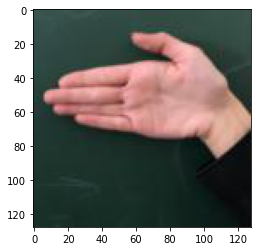

Sign Data:
 ['0.8183859586715698' '0.43550369143486023' '7.314926051549264e-07'
 '0.8047645092010498' '0.3037339150905609' '-0.07268311083316803'
 '0.7016534805297852' '0.19915500283241272' '-0.09360585361719131'
 '0.5859719514846802' '0.15496282279491425' '-0.10489729046821594'
 '0.49213364720344543' '0.1271325945854187' '-0.11376883834600449'
 '0.484934002161026' '0.2980928421020508' '-0.052156951278448105'
 '0.3311346173286438' '0.3031863272190094' '-0.08754544705152512'
 '0.2334163784980774' '0.314880907535553' '-0.11859693378210068'
 '0.1527092158794403' '0.32725051045417786' '-0.14026392996311188'
 '0.46057024598121643' '0.37968823313713074' '-0.03946809843182564'
 '0.29031458497047424' '0.3838779926300049' '-0.07096898555755615'
 '0.17927810549736023' '0.3876020908355713' '-0.10200625658035278'
 '0.09021696448326111' '0.39130833745002747' '-0.12299813330173492'
 '0.46375516057014465' '0.4536958336830139' '-0.03473501652479172'
 '0.304629921913147' '0.4576322138309479' '-0.066831

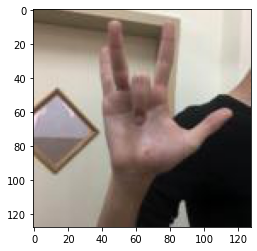

Sign Data:
 ['0.4888220429420471' '0.7031631469726562' '6.824557772233675e-07'
 '0.6044945120811462' '0.6996067762374878' '-0.0920967236161232'
 '0.7163650393486023' '0.60262531042099' '-0.1297220140695572'
 '0.7971521615982056' '0.529490053653717' '-0.15119852125644684'
 '0.87188720703125' '0.4765101671218872' '-0.17048898339271545'
 '0.6093981862068176' '0.4068050980567932' '-0.08359728753566742'
 '0.6130288243293762' '0.2762957811355591' '-0.11883004754781723'
 '0.6225622892379761' '0.1806761622428894' '-0.14198966324329376'
 '0.62894207239151' '0.09642621874809265' '-0.16193793714046478'
 '0.5181988477706909' '0.39589372277259827' '-0.06636643409729004'
 '0.5135297775268555' '0.31205350160598755' '-0.13435262441635132'
 '0.5133349895477295' '0.391270250082016' '-0.1530028134584427'
 '0.5190132260322571' '0.46119028329849243' '-0.14857426285743713'
 '0.43455517292022705' '0.40549784898757935' '-0.06039300188422203'
 '0.4264396131038666' '0.27472513914108276' '-0.11408665776252747'
 

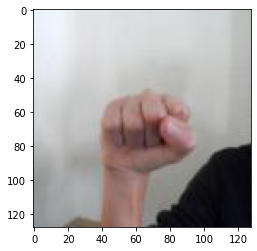

Sign Data:
 ['0.4484368562698364' '0.7237673997879028' '-9.527021234134736e-07'
 '0.5644721984863281' '0.6949604749679565' '-0.05030814930796623'
 '0.6836177110671997' '0.6592212915420532' '-0.09283208847045898'
 '0.7132605314254761' '0.6001765131950378' '-0.13508141040802002'
 '0.6383618116378784' '0.5541998147964478' '-0.17136457562446594'
 '0.627013623714447' '0.41333940625190735' '-0.06022825092077255'
 '0.65765780210495' '0.4592497646808624' '-0.12779369950294495'
 '0.6538931727409363' '0.545080840587616' '-0.17331987619400024'
 '0.6521576046943665' '0.5741360187530518' '-0.2001371830701828'
 '0.5317471027374268' '0.3982658386230469' '-0.06770221143960953'
 '0.5568677186965942' '0.5005216002464294' '-0.11570581793785095'
 '0.5563969016075134' '0.5931044816970825' '-0.13233967125415802'
 '0.5571200251579285' '0.6090539693832397' '-0.14356276392936707'
 '0.4401280879974365' '0.41455990076065063' '-0.08293578028678894'
 '0.4605100452899933' '0.5362734794616699' '-0.1270759403705597'


In [82]:
saved_best_dir = "/results/best_hands/"
best_hand_img = {}
best_hand_table_titles = "image_name,y_algorithm,confidence," + ",".join(landmark_list[0, 2:])
print(best_hand_table_titles, '\n')
best_signs_table = np.ones((1,num_features+3))
for optimal_sign in best_signs:
    print("Best Sign for", optimal_sign['sign'], "::")
    print("Corresponding Image Name:", optimal_sign['image_dir'])
    optimal_image = cv2.imread(cwd+optimal_sign['image_dir'])
    plt.imshow(optimal_image)  # show actual image on import
    plt.show()
    print("Sign Data:\n", optimal_sign['attributes'][2:])
    print("Probability Data:\n", optimal_sign['probabilities'])
    print('\n')
    
    new_hand_dir = saved_best_dir+optimal_sign['sign']+"-optimal.png"
    cv2.imwrite(new_hand_dir, optimal_image)  # write image
    best_hand_img[optimal_sign['sign']] = new_hand_dir  # save dict[sign] = best_hand_dir
    
    new_row = [optimal_sign['image_dir'], optimal_sign['sign'], max(optimal_sign['probabilities'])]
    new_row = new_row + optimal_sign['attributes'].tolist()[2:]
    best_signs_table = np.vstack((best_signs_table, new_row))
best_signs_table = np.delete(best_signs_table, (0), axis=0)

# write tabular data
# print(best_signs_table)
np.savetxt(cwd+saved_best_dir+"best_hand_data.csv", best_signs_table, delimiter=",", 
           header=best_hand_table_titles, fmt="%s")

In [70]:
best_hand_img

{'5': 'results/best_hands/5-optimal.png',
 '6': 'results/best_hands/6-optimal.png',
 '7': 'results/best_hands/7-optimal.png',
 '8': 'results/best_hands/8-optimal.png',
 '9': 'results/best_hands/9-optimal.png',
 'a': 'results/best_hands/a-optimal.png',
 'b': 'results/best_hands/b-optimal.png',
 'c': 'results/best_hands/c-optimal.png',
 'd': 'results/best_hands/d-optimal.png',
 'e': 'results/best_hands/e-optimal.png',
 'bye': 'results/best_hands/bye-optimal.png',
 'good': 'results/best_hands/good-optimal.png',
 'good morning': 'results/best_hands/good morning-optimal.png',
 'hello': 'results/best_hands/hello-optimal.png',
 'little bit': 'results/best_hands/little bit-optimal.png',
 'no': 'results/best_hands/no-optimal.png',
 'pardon': 'results/best_hands/pardon-optimal.png',
 'please': 'results/best_hands/please-optimal.png',
 'project': 'results/best_hands/project-optimal.png',
 'whats up': 'results/best_hands/whats up-optimal.png',
 'yes': 'results/best_hands/yes-optimal.png'}

In [64]:
def dir_to_table(im_dir, show_optimal=False):
    """ composite function f(image_directory or list_of_image_directory) = predicted_class
    translates image_dir to key points on hand
    translates key points on hand to features
    calls prediction using best model
    """
    new_images = []
    if im_dir[:-4] == '.png':
        new_images.append(im_dir)
    else:
        new_images = [file for file in os.listdir(im_dir) if get_target(file) in letters and ".png" in file]
    
    y_algo = []
    confidences = []
    y_intended = []
    image_name = []
    results = np.ones((1, num_features+2))
    
    for img in new_images:
        plt.imshow(cv2.imread(img))  # show actual image on import
        plt.show()
        ret = run_mediapipe([img], True, True, 1)[0].multi_hand_landmarks[0] # get hand skeleton data  
        add_row = np.ones((1, num_features))  # add features to list
        for j in range(0, num_features):
            if j%3 == 0:
                add_row[0, j] = ret.landmark[j//3].x
            elif j%3 == 1:
                add_row[0, j] = ret.landmark[j//3].y
            else:
                add_row[0, j] = ret.landmark[j//3].z
        print("Features Extrapolated into Row:\n", add_row)

        best_model.predict(add_row)[0]
        if show_optimal:
            print("Best Hand:")
            plt.imshow(best_hand_img[])  # show actual image on import
            plt.show()
            for hand in best_signs:
                if hand['sign'] == pred:
                    images_ref[hand['attributes'][0]]
        results.append({"prediction": pred, "probabilities": best_model.predict_proba(add_row)[0]})
    return np.hstack((image_name, y_intended, y_algo, confidences))

# testing all in one functions
print("Results:\n", dir_to_table(cwd+"/testing/images/2-video31image61.png"))  # example: 1

In [97]:
# writing final table
table_titles = "image_name,y_intended,y_algorithm,confidence," + ",".join(landmark_list[0, 2:])
print(table_titles)
print()

def landmarks_to_table(landmarks):
    y_algo = best_model.predict(landmarks[:, 2:]).reshape(-1,1)
    y_conf = best_model.predict_proba(landmarks[:, 2:])
    results = np.ones((1, num_features+4))
    for i in range(len(landmarks)):
        if i%500 ==0:
            print("Formatting row", str(i+1), "of", len(landmarks))
        im_name = images_ref[int(landmarks[i, 0])]
        im_intent = get_target(im_name)
        new_row = np.array([im_name, im_intent, y_algo[i,0], max(y_conf[i])])
        new_row = np.hstack((new_row, landmarks[i, 2:]))
#         print(new_row)
        results = np.vstack((results, np.array(new_row)))
    results = np.delete(results, (0), axis = 0)
    return results

# print(all_dataset)
finalized_table = landmarks_to_table(all_dataset)
print("DONE!")

image_name,y_intended,y_algorithm,confidence,WRIST.z,THUMB_CMC.x,THUMB_CMC.y,THUMB_CMC.z,THUMB_MCP.x,THUMB_MCP.y,THUMB_MCP.z,THUMB_IP.x,THUMB_IP.y,THUMB_IP.z,THUMB_TIP.x,THUMB_TIP.y,THUMB_TIP.z,INDEX_FINGER_MCP.x,INDEX_FINGER_MCP.y,INDEX_FINGER_MCP.z,INDEX_FINGER_PIP.x,INDEX_FINGER_PIP.y,INDEX_FINGER_PIP.z,INDEX_FINGER_DIP.x,INDEX_FINGER_DIP.y,INDEX_FINGER_DIP.z,INDEX_FINGER_TIP.x,INDEX_FINGER_TIP.y,INDEX_FINGER_TIP.z,MIDDLE_FINGER_MCP.x,MIDDLE_FINGER_MCP.y,MIDDLE_FINGER_MCP.z,MIDDLE_FINGER_PIP.x,MIDDLE_FINGER_PIP.y,MIDDLE_FINGER_PIP.z,MIDDLE_FINGER_DIP.x,MIDDLE_FINGER_DIP.y,MIDDLE_FINGER_DIP.z,MIDDLE_FINGER_TIP.x,MIDDLE_FINGER_TIP.y,MIDDLE_FINGER_TIP.z,RING_FINGER_MCP.x,RING_FINGER_MCP.y,RING_FINGER_MCP.z,RING_FINGER_PIP.x,RING_FINGER_PIP.y,RING_FINGER_PIP.z,RING_FINGER_DIP.x,RING_FINGER_DIP.y,RING_FINGER_DIP.z,RING_FINGER_TIP.x,RING_FINGER_TIP.y,RING_FINGER_TIP.z,PINKY_MCP.x,PINKY_MCP.y,PINKY_MCP.z,PINKY_PIP.x,PINKY_PIP.y,PINKY_PIP.z,PINKY_DIP.x,PINKY_DIP.y,PINKY_DIP.z,PINKY_TIP.x,PI

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.

/Users/korahughes/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:566: FutureWarning:

Arrays of bytes/strings is being converted to decimal numbers if dtype='numeric'. This behavior is deprecated in 0.24 and will be removed in 1.1 (renaming of 0.26). Please convert your data to numeric values explicitly instead.



Formatting row 501 of 4163
Formatting row 1001 of 4163
Formatting row 1501 of 4163
Formatting row 2001 of 4163
Formatting row 2501 of 4163
Formatting row 3001 of 4163
Formatting row 3501 of 4163
Formatting row 4001 of 4163
DONE!


In [99]:
print(finalized_table[0])
print(finalized_table)
np.savetxt(cwd+"/results/predicted_matrix/best-results.csv", finalized_table, delimiter=",", 
           header=table_titles, fmt="%s")

['/testing/images/b-video8image44.png' 'b' 'b' '0.9713445332346562'
 '0.3964062035083771' '0.6839089393615723' '3.4944815752169234e-07'
 '0.3360367715358734' '0.6316518783569336' '-0.01575626991689205'
 '0.309407114982605' '0.5356264710426331' '-0.017911816015839577'
 '0.3467937707901001' '0.4809502065181732' '-0.020850716158747673'
 '0.3971172869205475' '0.4822624921798706' '-0.024093657732009888'
 '0.34458068013191223' '0.4211377799510956' '0.006655605509877205'
 '0.33502960205078125' '0.3258005380630493' '-0.0032758829183876514'
 '0.3314424157142639' '0.26697394251823425' '-0.018116911873221397'
 '0.33066532015800476' '0.21635058522224426' '-0.03195079788565636'
 '0.38732466101646423' '0.41356387734413147' '0.000491751532536'
 '0.37531083822250366' '0.31095442175865173' '-0.007162161637097597'
 '0.3692971467971802' '0.24591660499572754' '-0.021546972915530205'
 '0.3639909029006958' '0.19034886360168457' '-0.03320862725377083'
 '0.42654600739479065' '0.42619943618774414' '-0.01001727